# **⋆. 𐙚 ̊  CP462 Project  ̊ 𐙚.⋆**

# หัวข้อ : **การคาดการณ์จำนวนผู้ป่วยไข้เลือดออกในไทยจากข้อมูลสิ่งแวดล้อม**

<br><br>
**Dataset:** <br>
*   สถานการณ์โรคไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566
*   ข้อมูลสภาพอากาศ (AWS) ตามพื้นที่

**Source:**

*   [สถานการณ์โรคไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566](https://opendata.ddc.moph.go.th/en/dataset/odpc4-01/resource/d2b707d9-2bf0-4938-8c19-51864cab2c25?inner_span=True)
*   [ข้อมูลสภาพอากาศ (AWS) ตามพื้นที่](https://dpmalert.disaster.go.th/WeatherData/WeatherDataByArea)

## **Connecting to google drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root = '/content/drive/MyDrive/CP462/after_midterm_proj'

## **Import Packages**

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, learning_curve, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import r2_score, mean_squared_error

# **ᯓᰔ Pre-midterm**

## **Import Dataset**

ข้อมูลผู้ป่วย จาก:
[สถานการณ์โรคไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566](https://opendata.ddc.moph.go.th/en/dataset/odpc4-01/resource/d2b707d9-2bf0-4938-8c19-51864cab2c25?inner_span=True)

*   สถานการณ์โรคไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566 (นครนายก, นนทบุรี, ปทุมธานี, พระนครศรีอยุธยา, ลพบุรี, สิงห์บุรี, สระบุรี, อ่างทอง)

ข้อมูลสภาพอากาศ จาก: [ข้อมูลสภาพอากาศ (AWS) ตามพื้นที่](https://dpmalert.disaster.go.th/WeatherData/WeatherDataByArea)

*   ข้อมูลสภาพอากาศตามพื้นที่แบบรายเดือนของปี 2566 (นครนายก, พระนครศรีอยุธยา, ลพบุรี)

### ข้อมูลผู้ป่วย

In [ ]:
patient_df = pd.read_csv(f"{root}/dengue_odpc4_2566.csv")

### ข้อมูลสภาพอากาศ

In [ ]:
# import glob
# import os

# # ระบุ path ของไฟล์ CSV ทั้งหมด (ปรับ path ตามจริง)
# path = "/content/drive/MyDrive/สภาพอากาศ"  # เช่น "C:/Users/Manissara/Downloads"
# all_files = glob.glob(os.path.join(path, "ข้อมูลรายงานประจำวัน*.csv"))

# # อ่านและรวมทุกไฟล์
# df_list = []
# for filename in all_files:
#     temp_df = pd.read_csv(filename, skiprows=1)
#     df_list.append(temp_df)

# # รวมทั้งหมดเป็น DataFrame เดียว
# weather_df = pd.concat(df_list, ignore_index=True)

# # บันทึกเป็นไฟล์เดียว
# weather_df.to_csv(os.path.join(path, "weather.csv"), index=False, encoding='utf-8-sig')

In [ ]:
weather_df = pd.read_csv(f"{root}/weather.csv")

## **Explore Data Analysis**

### Data Overview

#### ข้อมูลผู้ป่วย

ดูโครงสร้างตารางข้อมูล

In [ ]:
print('ขนาดข้อมูล:', patient_df.shape)
print('จำนวนแถว:', patient_df.shape[0])
print('จำนวนคอลัมน์:', patient_df.shape[1])

print('\nชื่อคอลัมน์:')
print(patient_df.columns)

ขนาดข้อมูล: (7096, 21)
จำนวนแถว: 7096
จำนวนคอลัมน์: 21

ชื่อคอลัมน์:
Index(['discode', 'Sex', 'agey', 'agem', 'aged', 'nation', 'occupation',
       'addercode', 'metropol', 'treatmentloc', 'patienttype', 'results',
       'treatmentloccod', 'datesick', 'datedefine', 'datefound', 'datedeath',
       'germ', 'complications', 'district', 'province'],
      dtype='object')


**คำอธิบายคอลัมน์**

1. `discode` -	โรค	(รหัสโรค)
2.  `sex` -	เพศ	(ระบุเพศ)
3.	`agey` -	อายุปี	(อายุนับปี	อายุไม่ถึงปีให้ใส่ 0)
4.	`agem` -	อายุเดือน	(อายุนับเดือน	อายุไม่ถึงเดือนให่ใส่ 0)
5.	`aged` -	อายุวัน	(อายุนับวัน)
6.	`nation` -	เชื้อชาติ	(จำแนกเชื้อชาติ)
7.	`occupation` -	อาชีพ	(จำแนกอาชีพ)
8.	`addercode` -	ที่อยู่	(รหัสที่อยู่)
9.	`metropol` -	เขตเทศบาล	(จำแนกเขตเทศบาล)
10.	`treatmentloc` -	ประเภทสถานที่รักษา	(ประเภทสถานที่รักษา)
11.	`patienttype` -	ชนิดผู้ป่วย	(จำแนกผู้ป่วยออกเป็นผู้ป่วยนอก,ผู้ป่วยใน)
12.	`results` -	ผลการรักษา	(ผลการรักษา)
13.	`treatmentloccod` -	รหัสสถานที่รักษา	(รหัสสถานที่รักษา)
14.	`datesick` -	วันเริ่มป่วย	(วัน/เดือน/ปีคริสต์ศักราช	dd/mm/yyyy)
15.	`datedefine` -	วันที่มาโรงพยาบาล (วัน/เดือน/ปีคริสต์ศักราช	dd/mm/yyyy)
16.	`datefound` -	วันที่พบผู้ป่วย (วัน/เดือน/ปีคริสต์ศักราช	dd/mm/yyyy)
17.	`datedeath` -	วันที่ผู้ป่วยเสียชีวิต	(วัน/เดือน/ปีคริสต์ศักราช	dd/mm/yyyy)
18.	`germ` -	เชื้อ	(เชื้อที่ตรวจพบให้ระบุรหัส)
19.	`complications` -	โรคแทรกซ้อน	(การตรวจพบโรคแทรกซ้อนใส่เป็นรหัส)
20.	`district` -	อำเภอ	(อำเภอพื้นที่ของหน่วยบริการเช่น ร.พ.)
21.	`province` -	จังหวัด	(จังหวัดของพื้นที่ให้บริการเช่น ร.พ.)

ดูตัวอย่างข้อมูลจริง

In [ ]:
print('ตัวอย่างข้อมูล 5 แถวแรก')
display(patient_df.head())

print('\nตัวอย่างข้อมูล 5 แถวท้าย')
display(patient_df.tail())

ตัวอย่างข้อมูล 5 แถวแรก


,discode,Sex,agey,agem,aged,nation,occupation,addercode,metropol,treatmentloc,...,results,treatmentloccod,datesick,datedefine,datefound,datedeath,germ,complications,district,province
0,66,ชาย,13,9,0,ไทย,นักเรียน,16010606,ในเขตเทศบาล,ร.พ.ทั่วไป,...,ยังรักษาอยู่,160106,7/1/2023,9/1/2023,10/1/2023,0000-00-00,NaN,NaN,เมืองลพบุรี,ลพบุรี
1,66,หญิง,20,7,0,ไทย,รับจ้าง-กรรมกร,16010604,ในเขตเทศบาล,ร.พ.ทั่วไป,...,ยังรักษาอยู่,160106,4/1/2023,9/1/2023,10/1/2023,0000-00-00,NaN,NaN,เมืองลพบุรี,ลพบุรี
2,66,หญิง,4,6,0,ไทย,ไม่ทราบอาชีพ,16010504,ในเขตเทศบาล,ร.พ.ทั่วไป,...,ยังรักษาอยู่,160106,5/1/2023,10/1/2023,13/1/2023,0000-00-00,NaN,NaN,เมืองลพบุรี,ลพบุรี
3,66,หญิง,8,6,0,ไทย,นักเรียน,16061704,อบต.,ร.พ.ทั่วไป,...,ยังรักษาอยู่,160106,6/1/2023,10/1/2023,13/1/2023,0000-00-00,NaN,NaN,บ้านหมี่,ลพบุรี
4,66,หญิง,16,0,0,ไทย,นักเรียน,16011508,ในเขตเทศบาล,ร.พ.ทั่วไป,...,ยังรักษาอยู่,160106,5/1/2023,9/1/2023,13/1/2023,0000-00-00,NaN,NaN,เมืองลพบุรี,ลพบุรี



ตัวอย่างข้อมูล 5 แถวท้าย


,discode,Sex,agey,agem,aged,nation,occupation,addercode,metropol,treatmentloc,...,results,treatmentloccod,datesick,datedefine,datefound,datedeath,germ,complications,district,province
7091,66,ชาย,47,0,0,ไทย,ทหาร-ตำรวจ,26011313,ในเขตเทศบาล,ร.พ.ทั่วไป,...,ยังรักษาอยู่,260113,24/12/2023,28/12/2023,4/1/2024,0000-00-00,9.0,0.0,เมืองนครนายก,นครนายก
7092,66,หญิง,54,6,4,ไทย,รับจ้าง-กรรมกร,14060225,อบต.,ร.พ.ทั่วไป,...,ยังรักษาอยู่,270101,5/10/2023,5/10/2023,9/10/2023,0000-00-00,NaN,NaN,บางปะอิน,พระนครศรีอยุธยา
7093,66,ชาย,33,0,0,ไทย,นักเรียน,150107,ในเขตเทศบาล,ร.พ.ชุมชน,...,ยังรักษาอยู่,500501,10/11/2023,10/11/2023,18/11/2023,0000-00-00,NaN,NaN,เมืองอ่างทอง,อ่างทอง
7094,66,หญิง,54,7,9,ไทย,รับจ้าง-กรรมกร,130201,ในเขตเทศบาล,ร.พ.ทั่วไป,...,หาย,560101,9/7/2023,14/7/2023,17/7/2023,0000-00-00,0.0,NaN,คลองหลวง,ปทุมธานี
7095,66,หญิง,32,1,14,ไทย,รับจ้าง-กรรมกร,1201050-,ในเขตเทศบาล,ร.พ.ชุมชน,...,ยังรักษาอยู่,760616,1/12/2023,1/12/2023,7/12/2023,0000-00-00,NaN,NaN,เมืองนนทบุรี,นนทบุรี


ดูชนิดข้อมูล (Data Types)

In [ ]:
patient_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7096 entries, 0 to 7095
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   discode          7096 non-null   int64  
 1   Sex              7096 non-null   object 
 2   agey             7096 non-null   int64  
 3   agem             7096 non-null   int64  
 4   aged             7096 non-null   int64  
 5   nation           7096 non-null   object 
 6   occupation       7071 non-null   object 
 7   addercode        7096 non-null   object 
 8   metropol         7096 non-null   object 
 9   treatmentloc     7096 non-null   object 
 10  patienttype      7096 non-null   object 
 11  results          7096 non-null   object 
 12  treatmentloccod  7096 non-null   object 
 13  datesick         7096 non-null   object 
 14  datedefine       7096 non-null   object 
 15  datefound        7096 non-null   object 
 16  datedeath        7096 non-null   object 
 17  germ          

ดูค่าสถิติพื้นฐาน

In [ ]:
patient_df.describe()

,discode,agey,agem,aged,germ,complications
count,7096.0,7096.000000,7096.000000,7096.000000,3604.000000,2806.0
mean,66.0,23.428974,3.850197,8.432497,5.523862,0.0
std,0.0,17.022856,3.871723,9.896687,4.376246,0.0
min,66.0,0.000000,0.000000,0.000000,0.000000,0.0
25%,66.0,11.000000,0.000000,0.000000,0.000000,0.0
50%,66.0,18.000000,3.000000,3.000000,9.000000,0.0
75%,66.0,32.000000,7.000000,17.000000,9.000000,0.0
max,66.0,93.000000,11.000000,30.000000,9.000000,0.0


In [ ]:
patient_df.describe(include='object')

,Sex,nation,occupation,addercode,metropol,treatmentloc,patienttype,results,treatmentloccod,datesick,datedefine,datefound,datedeath,district,province
count,7096,7096,7071,7096,7096,7096,7096,7096,7096,7096,7096,7096,7096,7085,7096
unique,2,8,13,2470,2,7,2,4,107,368,368,332,3,68,8
top,ชาย,ไทย,นักเรียน,13020304,ในเขตเทศบาล,ร.พ.ชุมชน,ผู้ป่วยนอก,ยังรักษาอยู่,130101,18/8/2023,4/9/2023,2/10/2023,0000-00-00,คลองหลวง,ปทุมธานี
freq,3611,6928,3322,44,3594,3194,4535,5255,802,63,68,139,7094,536,2172


#### ข้อมูลสภาพอากาศ

ดูโครงสร้างตารางข้อมูล

In [ ]:
print('ขนาดข้อมูล:', weather_df.shape)
print('จำนวนแถว:', weather_df.shape[0])
print('จำนวนคอลัมน์:', weather_df.shape[1])

print('\nชื่อคอลัมน์:')
print(weather_df.columns)

ขนาดข้อมูล: (3650, 11)
จำนวนแถว: 3650
จำนวนคอลัมน์: 11

ชื่อคอลัมน์:
Index(['สถานี', 'อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม',
       'ทิศทางลม', 'ลมกระโชก', 'เวลาที่บันทึก', 'หมายเหตุ', 'Unnamed: 10'],
      dtype='object')


**คำอธิบายคอลัมน์**

1. `สถานี` - สถานีตรวจวัดโทรมาตร
2. `อุณหภูมิ` - อุณหภูมิ (°C)
3. `ฝน` - ฝน (mm)
3. `ความชื้น` - ความชื้น (%)
5.	`ความกด` -	ความกด (hPa)
6.	`ความเร็วลม` -	ความเร็วลม (m/s)
7.	`ทิศทางลม` -	ทิศทางลม (Deg)
8.	`ลมกระโชก` -	ลมกระโชก (m/s)
9.	`เวลาที่บันทึก` -	เวลาที่บันทึก
10.	`หมายเหตุ` -	หมายเหตุ
11.	`Unnamed: 10` -	คอลัมน์เปล่า

ดูตัวอย่างข้อมูลจริง

In [ ]:
print('ตัวอย่างข้อมูล 5 แถวแรก')
display(weather_df.head())

print('\nตัวอย่างข้อมูล 5 แถวท้าย')
display(weather_df.tail())

ตัวอย่างข้อมูล 5 แถวแรก


,สถานี,อุณหภูมิ,ฝน,ความชื้น,ความกด,ความเร็วลม,ทิศทางลม,ลมกระโชก,เวลาที่บันทึก,หมายเหตุ,Unnamed: 10
0,TB77 - บ้านกำนันถาวร อ.เมืองนครนายก จ.นครนายก,26.22,23.2,95.13,1005,0.334,358.7-N,1.287,23/07/2566,ระยะที่ 1,NaN
1,TB87 - บ้านผู้ช่วยผู้ใหญ่บ้าน หมู่ 6 อ.ปากพลี ...,26.47,15.9,91.72,1003,0.114,355.7-N,0.671,23/07/2566,ระยะที่ 1,NaN
2,TB81 - ประปาหมู่บ้าน หมู่ 8 อ.บ้านนา จ.นครนายก,26.69,0.0,95.82,1006,0.374,351-N,1.457,23/07/2566,ระยะที่ 1,NaN
3,TB76 - วัดบ้านดง หมู่ 1 อ.เมืองนครนายก จ.นคร...,26.13,31.9,93.59,1004,0.226,344.7-N,1.080,23/07/2566,ระยะที่ 2,NaN
4,TB82 - ศาลาเอนกประสงค์ ม.6 อ.บ้านนา จ.นครนายก,26.97,0.2,94.81,1005,0.360,358.7-N,1.419,23/07/2566,ระยะที่ 2,NaN



ตัวอย่างข้อมูล 5 แถวท้าย


,สถานี,อุณหภูมิ,ฝน,ความชื้น,ความกด,ความเร็วลม,ทิศทางลม,ลมกระโชก,เวลาที่บันทึก,หมายเหตุ,Unnamed: 10
3645,CG01 - เขาน้อย อ.เมืองนครนายก จ.นครนายก,23.62,0.0,86.40,1004,0.516,356-N,1.274,06/02/2566,ระยะที่ 3,NaN
3646,CG02 - ที่ทำการ อบต. ป่าขะ อ.บ้านนา จ.นครนายก,25.51,0.0,82.30,1008,1.076,154.1-SE,1.960,06/02/2566,ระยะที่ 3,NaN
3647,CC01 - ที่ว่าการอำเภอเมือง อ.เมืองลพบุรี จ.ลพบุรี,26.48,0.0,83.30,1007,0.000,0-CALM,0.000,06/02/2566,ระยะที่ 3,NaN
3648,CC02 - ที่ว่าการอำเภอชัยบาดาล อ.ชัยบาดาล จ.ลพบุรี,25.43,0.0,84.30,1003,0.000,0-CALM,0.000,06/02/2566,ระยะที่ 3,NaN
3649,CJ04 - ทต.บางปะหัน อ.บางปะหัน จ.พระนครศรีอยุธยา,26.22,0.0,79.45,1009,1.284,185.8-S,2.842,06/02/2566,ระยะที่ 3,NaN


ดูชนิดข้อมูล (Data Types)

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3650 entries, 0 to 3649
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   สถานี          3650 non-null   object 
 1   อุณหภูมิ       3650 non-null   float64
 2   ฝน             3650 non-null   float64
 3   ความชื้น       3650 non-null   float64
 4   ความกด         3650 non-null   int64  
 5   ความเร็วลม     3650 non-null   float64
 6   ทิศทางลม       3650 non-null   object 
 7   ลมกระโชก       3650 non-null   float64
 8   เวลาที่บันทึก  3650 non-null   object 
 9   หมายเหตุ       3650 non-null   object 
 10  Unnamed: 10    0 non-null      float64
dtypes: float64(6), int64(1), object(4)
memory usage: 313.8+ KB


ดูค่าสถิติพื้นฐาน

In [ ]:
weather_df.describe()

,อุณหภูมิ,ฝน,ความชื้น,ความกด,ความเร็วลม,ลมกระโชก,Unnamed: 10
count,3650.000000,3650.000000,3650.000000,3650.000000,3650.000000,3650.000000,0.0
mean,26.572247,1.968795,76.087392,992.174247,0.819668,2.185479,NaN
std,3.816545,8.625120,16.100687,118.177117,0.887078,1.818941,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,25.780000,0.000000,68.815000,1004.000000,0.205000,1.045750,NaN
50%,27.210000,0.000000,79.380000,1006.000000,0.580500,1.801000,NaN
75%,28.377500,0.000000,86.790000,1008.000000,1.183750,2.940000,NaN
max,32.780000,161.000000,100.000000,1019.000000,10.830000,20.290000,NaN


In [ ]:
weather_df.describe(include='object')

,สถานี,ทิศทางลม,เวลาที่บันทึก,หมายเหตุ
count,3650,3650,3650,3650
unique,10,1695,365,3
top,TB77 - บ้านกำนันถาวร อ.เมืองนครนายก จ.นครนายก,0-CALM,06/02/2566,ระยะที่ 3
freq,365,378,10,1825


### Data Quality Check

#### ข้อมูลผู้ป่วย

In [ ]:
print("Missing Values:")
print(patient_df.isnull().sum())

Missing Values:
discode               0
Sex                   0
agey                  0
agem                  0
aged                  0
nation                0
occupation           25
addercode             0
metropol              0
treatmentloc          0
patienttype           0
results               0
treatmentloccod       0
datesick              0
datedefine            0
datefound             0
datedeath             0
germ               3492
complications      4290
district             11
province              0
dtype: int64


**จำนวน Missing Values**
*   `occupation` (อาชีพ) - 25 รายการ
*   `germ` (เชื้อที่ตรวจพบ) - 3492 รายการ
*   `complications` (โรคแทรกซ้อน) - 4290 รายการ
*   `district` (อำเภอ) - 11 รายการ


In [ ]:
print("Duplicate Rows:")
print(patient_df[patient_df.duplicated()])

Duplicate Rows:
     discode  Sex  agey  agem  aged nation occupation addercode     metropol  \
984       66  ชาย    14     0     0    ไทย   นักเรียน  19020505  ในเขตเทศบาล   

    treatmentloc  ...       results treatmentloccod   datesick datedefine  \
984   ร.พ.ทั่วไป  ...  ยังรักษาอยู่          190901  18/6/2023  21/6/2023   

     datefound   datedeath germ  complications  district province  
984  22/6/2023  0000-00-00  0.0            0.0   แก่งคอย  สระบุรี  

[1 rows x 21 columns]


**จำนวน Duplicate Rows**
*   พบ 1 รายการ

In [ ]:
print("Data Type Validation")
print(patient_df.dtypes)

Data Type Validation
discode              int64
Sex                 object
agey                 int64
agem                 int64
aged                 int64
nation              object
occupation          object
addercode           object
metropol            object
treatmentloc        object
patienttype         object
results             object
treatmentloccod     object
datesick            object
datedefine          object
datefound           object
datedeath           object
germ               float64
complications      float64
district            object
province            object
dtype: object


**ตรวจสอบ Outlier**

คอลัมน์ข้อมูลเชิงปริมาณ

1.	`agey` -	อายุนับปี
2. `agem` -	อายุนับเดือน
3.	`aged` -	อายุนับวัน

ด้วยวิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)

In [ ]:
numeric_cols = ['agey', 'agem', 'aged']

for col in numeric_cols:
    Q1 = patient_df[col].quantile(0.25)
    Q3 = patient_df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # ดึงแถวที่เป็น outlier
    outliers = patient_df[(patient_df[col] < lower_bound) | (patient_df[col] > upper_bound)]

    print(f"\n===== {col} =====")
    print(f"Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
    print(f"เกณฑ์ต่ำสุด = {lower_bound:.2f}, เกณฑ์สูงสุด = {upper_bound:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")

    # แสดงตัวอย่างค่า outlier 5 แถวแรก
    if not outliers.empty:
        print(outliers[[col]].head())


===== agey =====
Q1 = 11.00, Q3 = 32.00, IQR = 21.00
เกณฑ์ต่ำสุด = -20.50, เกณฑ์สูงสุด = 63.50
จำนวน outlier = 255
    agey
26    70
29    64
55    69
96    91
98    65

===== agem =====
Q1 = 0.00, Q3 = 7.00, IQR = 7.00
เกณฑ์ต่ำสุด = -10.50, เกณฑ์สูงสุด = 17.50
จำนวน outlier = 0

===== aged =====
Q1 = 0.00, Q3 = 17.00, IQR = 17.00
เกณฑ์ต่ำสุด = -25.50, เกณฑ์สูงสุด = 42.50
จำนวน outlier = 0


ด้วยวิธี Z-score method (> 3 หรือ < -3)

In [ ]:
numeric_cols = ['agey', 'agem', 'aged']

for col in numeric_cols:
    mean = patient_df[col].mean()
    std = patient_df[col].std()

    # คำนวณ Z-score
    patient_df[col + "_zscore"] = (patient_df[col] - mean) / std

    # เลือก outlier
    outliers = patient_df[np.abs(patient_df[col + "_zscore"]) > 3]

    print(f"\n===== {col} =====")
    print(f"Mean = {mean:.2f}, Std = {std:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")
    if not outliers.empty:
        print(outliers[[col, col + "_zscore"]].head())

# ลบคอลัมน์ zscore
numeric_cols = ['agey', 'agem', 'aged']
for col in numeric_cols:
    weather_df = weather_df.drop(columns=[col + "_zscore"], errors='ignore')
    print(f"ลบคอลัมน์ {col + '_zscore'}")


===== agey =====
Mean = 23.43, Std = 17.02
จำนวน outlier = 73
     agey  agey_zscore
96     91     3.969430
142    80     3.323239
306    87     3.734451
315    75     3.029517
328    77     3.147006

===== agem =====
Mean = 3.85, Std = 3.87
จำนวน outlier = 0

===== aged =====
Mean = 8.43, Std = 9.90
จำนวน outlier = 0
ลบคอลัมน์ agey_zscore
ลบคอลัมน์ agem_zscore
ลบคอลัมน์ aged_zscore


Visualization - Boxplot

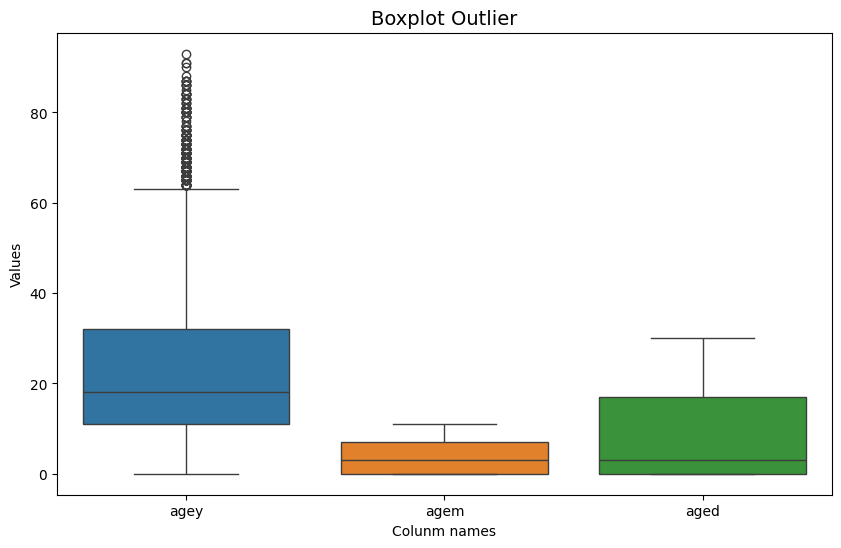

In [ ]:
numeric_cols = ['agey', 'agem', 'aged']

plt.figure(figsize=(10, 6))

# สร้าง boxplot ของแต่ละคอลัมน์
sns.boxplot(data=patient_df[numeric_cols], orient="v")

plt.title("Boxplot Outlier", fontsize=14)
plt.ylabel("Values")
plt.xlabel("Colunm names")
plt.show()

**สรุปค่า Outlier**

วิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)
* คอลัมน์ `agey` - จำนวน outlier = 255 (ตัวอย่าง: 70, 64, 69, 91)
* คอลัมน์ `agem` - ไม่มีค่า outlier
* คอลัมน์ `aged` - ไม่มีค่า outlier

วิธี Z-score method (> 3 หรือ < -3)
* คอลัมน์ `agey` - จำนวน outlier = 73 (ตัวอย่าง: 91, 80, 87, 75)
* คอลัมน์ `agem` - ไม่มีค่า outlier
* คอลัมน์ `aged` - ไม่มีค่า outlier

#### ข้อมูลสภาพอากาศ

In [ ]:
print("Missing Values:")
print(weather_df.isnull().sum())

Missing Values:
สถานี               0
อุณหภูมิ            0
ฝน                  0
ความชื้น            0
ความกด              0
ความเร็วลม          0
ทิศทางลม            0
ลมกระโชก            0
เวลาที่บันทึก       0
หมายเหตุ            0
Unnamed: 10      3650
dtype: int64


**จำนวน Missing Values**
*   `Unnamed: 10` (คอลัมน์เปล่า) 3650 รายการ

In [ ]:
print("Duplicate Rows:")
print(weather_df[weather_df.duplicated()])

Duplicate Rows:
Empty DataFrame
Columns: [สถานี, อุณหภูมิ, ฝน, ความชื้น, ความกด, ความเร็วลม, ทิศทางลม, ลมกระโชก, เวลาที่บันทึก, หมายเหตุ, Unnamed: 10]
Index: []


**จำนวน Duplicate Rows**
*   ไม่พบ

In [ ]:
print("Data Type Validation")
print(weather_df.dtypes)

Data Type Validation
สถานี             object
อุณหภูมิ         float64
ฝน               float64
ความชื้น         float64
ความกด             int64
ความเร็วลม       float64
ทิศทางลม          object
ลมกระโชก         float64
เวลาที่บันทึก     object
หมายเหตุ          object
Unnamed: 10      float64
dtype: object


**ตรวจสอบค่า Outlier**

คอลัมน์ข้อมูลเชิงปริมาณ

1. `อุณหภูมิ` - อุณหภูมิ (°C)
2. `ฝน` - ฝน (mm)
3. `ความชื้น` - ความชื้น (%)
4.	`ความกด` -	ความกด (hPa)
5.	`ความเร็วลม` -	ความเร็วลม (m/s)
6.	`ลมกระโชก` -	ลมกระโชก (m/s)

ด้วยวิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)

In [ ]:
numeric_cols = ['อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม', 'ลมกระโชก']

for col in numeric_cols:
    Q1 = weather_df[col].quantile(0.25)
    Q3 = weather_df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # ดึงแถวที่เป็น outlier
    outliers = weather_df[(weather_df[col] < lower_bound) | (weather_df[col] > upper_bound)]

    print(f"\n===== {col} =====")
    print(f"Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
    print(f"เกณฑ์ต่ำสุด = {lower_bound:.2f}, เกณฑ์สูงสุด = {upper_bound:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")

    # แสดงตัวอย่างค่า outlier 5 แถวแรก
    if not outliers.empty:
        print(outliers[[col]].head())


===== อุณหภูมิ =====
Q1 = 25.78, Q3 = 28.38, IQR = 2.60
เกณฑ์ต่ำสุด = 21.88, เกณฑ์สูงสุด = 32.27
จำนวน outlier = 140
    อุณหภูมิ
10     19.89
11     18.36
12     20.16
14     19.14
16     19.85

===== ฝน =====
Q1 = 0.00, Q3 = 0.00, IQR = 0.00
เกณฑ์ต่ำสุด = 0.00, เกณฑ์สูงสุด = 0.00
จำนวน outlier = 827
     ฝน
0  23.2
1  15.9
3  31.9
4   0.2
5   0.2

===== ความชื้น =====
Q1 = 68.81, Q3 = 86.79, IQR = 17.98
เกณฑ์ต่ำสุด = 41.85, เกณฑ์สูงสุด = 113.75
จำนวน outlier = 87
     ความชื้น
79        0.0
129       0.0
181       0.0
259       0.0
418       0.0

===== ความกด =====
Q1 = 1004.00, Q3 = 1008.00, IQR = 4.00
เกณฑ์ต่ำสุด = 998.00, เกณฑ์สูงสุด = 1014.00
จำนวน outlier = 118
    ความกด
28     997
49    1016
55     997
58     995
79       0

===== ความเร็วลม =====
Q1 = 0.20, Q3 = 1.18, IQR = 0.98
เกณฑ์ต่ำสุด = -1.26, เกณฑ์สูงสุด = 2.65
จำนวน outlier = 153
    ความเร็วลม
29       2.755
45       6.341
47       2.923
59       3.091
89       2.690

===== ลมกระโชก =====
Q1 = 1.05, Q3 = 2.94, IQR =

ด้วยวิธี Z-score method (> 3 หรือ < -3)

In [ ]:
numeric_cols = ['อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม', 'ลมกระโชก']

for col in numeric_cols:
    mean = weather_df[col].mean()
    std = weather_df[col].std()

    # คำนวณ Z-score
    weather_df[col + "_zscore"] = (weather_df[col] - mean) / std

    # เลือก outlier
    outliers = weather_df[np.abs(weather_df[col + "_zscore"]) > 3]

    print(f"\n===== {col} =====")
    print(f"Mean = {mean:.2f}, Std = {std:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")
    if not outliers.empty:
        print(outliers[[col, col + "_zscore"]].head())

# ลบคอลัมน์ zscore
numeric_cols = ['อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม', 'ลมกระโชก']
for col in numeric_cols:
    weather_df = weather_df.drop(columns=[col + "_zscore"], errors='ignore')
    print(f"ลบคอลัมน์ {col + '_zscore'}")


===== อุณหภูมิ =====
Mean = 26.57, Std = 3.82
จำนวน outlier = 51
     อุณหภูมิ  อุณหภูมิ_zscore
79        0.0        -6.962382
129       0.0        -6.962382
181       0.0        -6.962382
259       0.0        -6.962382
418       0.0        -6.962382

===== ฝน =====
Mean = 1.97, Std = 8.63
จำนวน outlier = 81
       ฝน  ฝน_zscore
3    31.9   3.470236
31   31.0   3.365890
36   32.5   3.539801
37   31.5   3.423860
254  40.7   4.490512

===== ความชื้น =====
Mean = 76.09, Std = 16.10
จำนวน outlier = 51
     ความชื้น  ความชื้น_zscore
79        0.0        -4.725723
129       0.0        -4.725723
181       0.0        -4.725723
259       0.0        -4.725723
418       0.0        -4.725723

===== ความกด =====
Mean = 992.17, Std = 118.18
จำนวน outlier = 51
     ความกด  ความกด_zscore
79        0      -8.395655
129       0      -8.395655
181       0      -8.395655
259       0      -8.395655
418       0      -8.395655

===== ความเร็วลม =====
Mean = 0.82, Std = 0.89
จำนวน outlier = 61
     ความเร็วล

Visualization - Boxplot

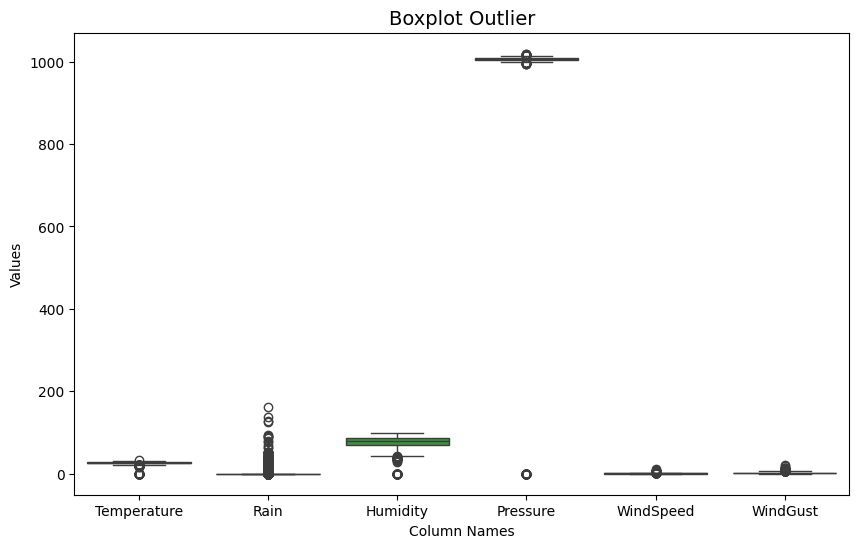

In [ ]:
numeric_cols = ['อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม', 'ลมกระโชก']

# mapping ไทย -> อังกฤษ
col_map = {
    'อุณหภูมิ': 'Temperature',
    'ฝน': 'Rain',
    'ความชื้น': 'Humidity',
    'ความกด': 'Pressure',
    'ความเร็วลม': 'WindSpeed',
    'ลมกระโชก': 'WindGust'
}

# เลือกเฉพาะคอลัมน์ที่สนใจแล้วเปลี่ยนชื่อ
df_eng = weather_df[numeric_cols].rename(columns=col_map)

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_eng, orient="v")

plt.title("Boxplot Outlier", fontsize=14)
plt.ylabel("Values")
plt.xlabel("Column Names")
plt.show()

**สรุปค่า Outlier**

วิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)
* คอลัมน์ `อุณหภูมิ` - จำนวน outlier = 140
* คอลัมน์ `ฝน` - จำนวน outlier = 827
* คอลัมน์ `ความชื้น` - จำนวน outlier = 87
* คอลัมน์ `ความกด` - จำนวน outlier = 118
* คอลัมน์ `ความเร็วลม` - จำนวน outlier = 153
* คอลัมน์ `ลมกระโชก` - จำนวน outlier = 156

วิธี Z-score method (> 3 หรือ < -3)
* คอลัมน์ `อุณหภูมิ` - จำนวน outlier = 51
* คอลัมน์ `ฝน` - จำนวน outlier = 81
* คอลัมน์ `ความชื้น` - จำนวน outlier = 51
* คอลัมน์ `ความกด` - จำนวน outlier = 51
* คอลัมน์ `ความเร็วลม` - จำนวน outlier = 61
* คอลัมน์ `ลมกระโชก` - จำนวน outlier = 64

### Data Wrangling
1. Gathering (การรวมข้อมูล)
2. Cleaning (การทำความสะอาด)
3. Transforming (การแปลงรูปแบบ)
4. Enriching (การเสริมข้อมูล)
5. Validating (การตรวจสอบความถูกต้อง)
6. Publishing (การจัดเก็บ/ส่งออก)

#### **Cleaning**

จัดการ missing values, duplicates, outliers

##### ข้อมูลผู้ป่วย

###### **จัดการ Missing values, Duplicates values**

จากขั้นตอน Data Quality Check

**จำนวน Missing Values**
*   `occupation` (อาชีพ) - 25 รายการ
*   `germ` (เชื้อที่ตรวจพบ) - 3492 รายการ
*   `complications` (โรคแทรกซ้อน) - 4290 รายการ
*   `district` (อำเภอ) - 11 รายการ

**จำนวน Duplicate Rows**
*   พบ 1 รายการ

In [ ]:
# จัดการ missing values
patient_df['occupation'] = patient_df['occupation'].fillna("ไม่ทราบอาชีพ")
patient_df['district'] = patient_df['district'].fillna("ไม่ทราบอำเภอ")
patient_df['germ'] = patient_df['germ'].fillna(0)
patient_df['complications'] = patient_df['complications'].fillna(0)

# จัดการ duplicates values
patient_df.drop_duplicates(inplace=True)

# ตรวจสอบ
print("Missing Values:")
print(patient_df.isnull().sum())
print("=========================================")
print("Duplicate Rows:")
print(patient_df[patient_df.duplicated()])

Missing Values:
discode            0
Sex                0
agey               0
agem               0
aged               0
nation             0
occupation         0
addercode          0
metropol           0
treatmentloc       0
patienttype        0
results            0
treatmentloccod    0
datesick           0
datedefine         0
datefound          0
datedeath          0
germ               0
complications      0
district           0
province           0
agey_zscore        0
agem_zscore        0
aged_zscore        0
dtype: int64
Duplicate Rows:
Empty DataFrame
Columns: [discode, Sex, agey, agem, aged, nation, occupation, addercode, metropol, treatmentloc, patienttype, results, treatmentloccod, datesick, datedefine, datefound, datedeath, germ, complications, district, province, agey_zscore, agem_zscore, aged_zscore]
Index: []

[0 rows x 24 columns]


###### **จัดการ Outlier**

คอลัมน์ข้อมูลเชิงปริมาณ

1.	`agey` -	อายุนับปี
2. `agem` -	อายุนับเดือน
3.	`aged` -	อายุนับวัน

**จากสรุปค่า Outlier**

วิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)
* คอลัมน์ `agey` - จำนวน outlier = 255 (ตัวอย่าง: 70, 64, 69, 91)
* คอลัมน์ `agem` - ไม่มีค่า outlier
* คอลัมน์ `aged` - ไม่มีค่า outlier

วิธี Z-score method (> 3 หรือ < -3)
* คอลัมน์ `agey` - จำนวน outlier = 73 (ตัวอย่าง: 91, 80, 87, 75)
* คอลัมน์ `agem` - ไม่มีค่า outlier
* คอลัมน์ `aged` - ไม่มีค่า outlier

จากการตรวจสอบค่า Outlier: พบว่า ค่า outllier ที่ตรวจพบไม่ใช่ค่าผิดพลาด จึงไม่จัดการกับค่า outlier

Visualization - Boxplot

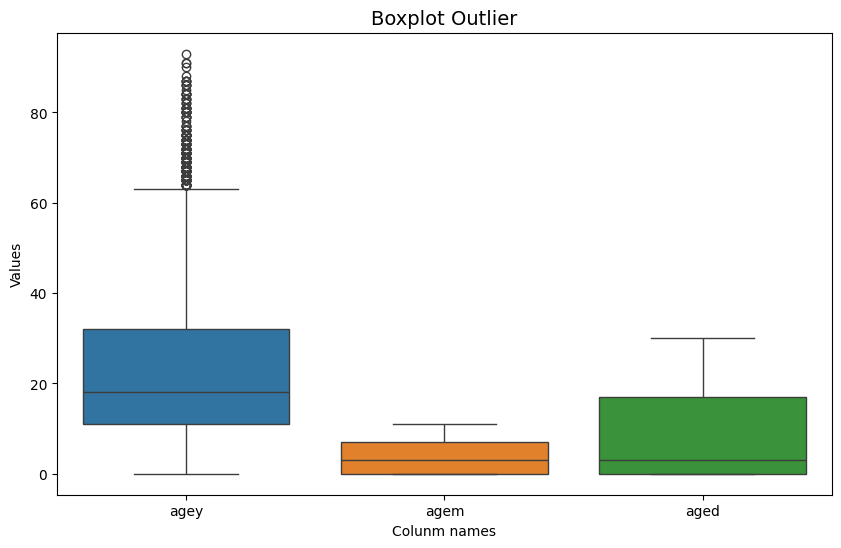

In [ ]:
numeric_cols = ['agey', 'agem', 'aged']

plt.figure(figsize=(10, 6))

# สร้าง boxplot ของแต่ละคอลัมน์
sns.boxplot(data=patient_df[numeric_cols], orient="v")

plt.title("Boxplot Outlier", fontsize=14)
plt.ylabel("Values")
plt.xlabel("Colunm names")
plt.show()

##### ข้อมูลสภาพอากาศ

###### **จัดการ Missing values, Duplicates values**

จากขั้นตอน Data Quality Check

**จำนวน Missing Values**
* พบว่า คอลัมน์ `Unnamed: 10` เป็น คอลัมน์เปล่า ทำให้เกิด Missing values จำนวน 3650 รายการ

**จำนวน Duplicate Rows**
*   ไม่พบ

In [ ]:
# จัดการลบคอลัมน์ Unnamed: 10 ที่เป็น คอลัมน์เปล่า
weather_df = weather_df.iloc[:, :-1]

# ตรวจสอบ
print("Missing Values:")
print(weather_df.isnull().sum())
print("=========================================")
print("Duplicate Rows:")
print(weather_df[weather_df.duplicated()])

Missing Values:
สถานี            0
อุณหภูมิ         0
ฝน               0
ความชื้น         0
ความกด           0
ความเร็วลม       0
ทิศทางลม         0
ลมกระโชก         0
เวลาที่บันทึก    0
หมายเหตุ         0
dtype: int64
Duplicate Rows:
Empty DataFrame
Columns: [สถานี, อุณหภูมิ, ฝน, ความชื้น, ความกด, ความเร็วลม, ทิศทางลม, ลมกระโชก, เวลาที่บันทึก, หมายเหตุ]
Index: []


###### **จัดการ Outlier**

คอลัมน์ข้อมูลเชิงปริมาณ

1. `อุณหภูมิ` - อุณหภูมิ (°C)
2. `ฝน` - ฝน (mm)
3. `ความชื้น` - ความชื้น (%)
4.	`ความกด` -	ความกด (hPa)
5.	`ความเร็วลม` -	ความเร็วลม (m/s)
6.	`ลมกระโชก` -	ลมกระโชก (m/s)

**จากสรุปค่า Outlier**

วิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)
* คอลัมน์ `อุณหภูมิ` - จำนวน outlier = 11 (ตัวอย่าง: 18.98, 21.49)
* คอลัมน์ `ฝน` - จำนวน outlier = 13 (ตัวอย่าง: 397.4, 518.6)
* คอลัมน์ `ความชื้น` - ไม่มีค่า outlier
* คอลัมน์ `ความกด` - ไม่มีค่า outlier
* คอลัมน์ `ความเร็วลม` - ไม่มีค่า outlier
* คอลัมน์ `ลมกระโชก` - ไม่มีค่า outlier

วิธี Z-score method (> 3 หรือ < -3)
* คอลัมน์ `อุณหภูมิ` - ไม่มีค่า outlier
* คอลัมน์ `ฝน` - จำนวน outlier = 3 (ตัวอย่าง: 648.8, 518.6)
* คอลัมน์ `ความชื้น` - ไม่มีค่า outlier
* คอลัมน์ `ความกด` - ไม่มีค่า outlier
* คอลัมน์ `ความเร็วลม` - ไม่มีค่า outlier
* คอลัมน์ `ลมกระโชก` - ไม่มีค่า outlier

จากการตรวจสอบค่า Outlier: พบว่า ค่า outllier ที่ตรวจพบไม่ใช่ค่าผิดพลาด จึงไม่จัดการกับค่า outlier

Visualization - Boxplot

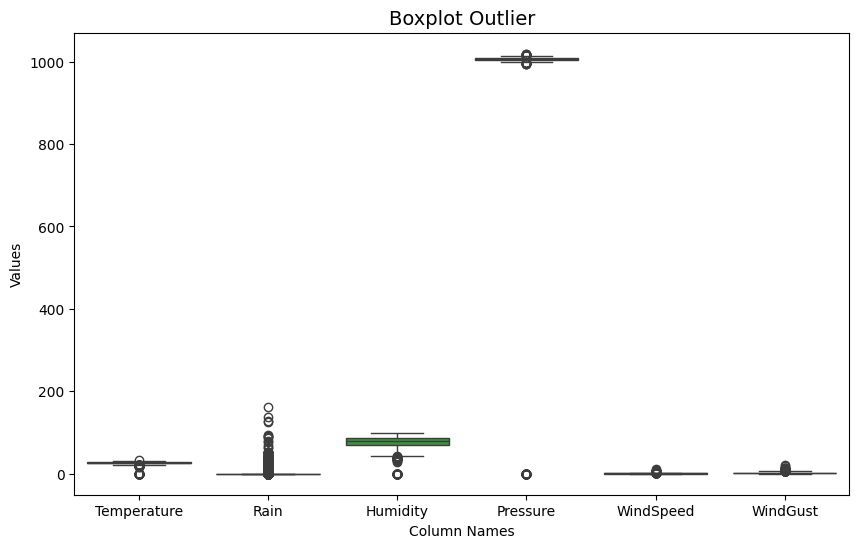

In [ ]:
numeric_cols = ['อุณหภูมิ', 'ฝน', 'ความชื้น', 'ความกด', 'ความเร็วลม', 'ลมกระโชก']

# mapping ไทย -> อังกฤษ
col_map = {
    'อุณหภูมิ': 'Temperature',
    'ฝน': 'Rain',
    'ความชื้น': 'Humidity',
    'ความกด': 'Pressure',
    'ความเร็วลม': 'WindSpeed',
    'ลมกระโชก': 'WindGust'
}

# เลือกเฉพาะคอลัมน์ที่สนใจแล้วเปลี่ยนชื่อ
df_eng = weather_df[numeric_cols].rename(columns=col_map)

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_eng, orient="v")

plt.title("Boxplot Outlier", fontsize=14)
plt.ylabel("Values")
plt.xlabel("Column Names")
plt.show()

#### **Transforming**

เปลี่ยนชนิดข้อมูล, normalize/standardize ค่า, encode ข้อมูลเชิงหมวดหมู่

##### ข้อมูลผู้ป่วย

###### เปลี่ยนชนิดข้อมูล

In [ ]:
# แปลงวันที่เป็น datetime
date_cols = ['datesick', 'datedefine', 'datefound']
for col in date_cols:
    if col in patient_df.columns:
        patient_df[col] = pd.to_datetime(patient_df[col], errors='coerce', dayfirst=True)

# แปลงเป็น categorical
cat_cols = ['Sex', 'nation', 'occupation', 'metropol', 'treatmentloc',
            'patienttype', 'results', 'district', 'province']
for col in cat_cols:
    if col in patient_df.columns:
        patient_df[col] = patient_df[col].astype('category')

###### จัดการข้อมูล

* กรองให้เหลือแค่ 3 จังหวัด - เนื่องจากไม่มีสถานีตรวจวัดโทรมาตรในทุกจังหวัด ทำให้ข้อมูลสภาพอากาศ มีเพียง 3 จังหวัดจากทั้งหมด 8 จังหวัด
* ลบคอลัมน์ที่ไม่จำเป็น - ลบบางคอลัมน์ที่ไม่เกี่ยวข้องกับการคาดการณ์จำนวนผู้ป่วย

In [ ]:
#  กรองให้เหลือแค่ 3 จังหวัด
target_provinces = ["นครนายก", "พระนครศรีอยุธยา", "ลพบุรี"]
patient_df = patient_df[patient_df['province'].isin(target_provinces)]

# ลบคอลัมน์ที่ไม่จำเป็น
patient_df = patient_df.drop(columns=['discode', 'addercode', 'treatmentloccod', 'datedeath'], errors='ignore')

##### ข้อมูลสภาพอากาศ

###### เปลี่ยนชนิดข้อมูล

In [ ]:
# แปลงปีพุทธศักราช (2566) เป็นคริสต์ศักราช (2023)
weather_df["เวลาที่บันทึก"] = weather_df["เวลาที่บันทึก"].str.replace(
    r"(\d{2}/\d{2}/)(\d{4})",
    lambda m: f"{m.group(1)}{int(m.group(2)) - 543}",
    regex=True
)

# แปลงเป็น datetime
weather_df["เวลาที่บันทึก"] = pd.to_datetime(
    weather_df["เวลาที่บันทึก"],
    format="%d/%m/%Y",
    errors="coerce"
)

###### Normalization (Min-Max Scaling)

เปลี่ยนเป็นทำการ scaling หลังจากแบ่งข้อมูล train, test เพื่อป้องกันการรั่วไหลของข้อมูล

In [ ]:
# scaler = MinMaxScaler()
# scaled = scaler.fit_transform(weather_df[["อุณหภูมิ", "ฝน", "ความชื้น"]])

# weather_df[["อุณหภูมิ", "ฝน", "ความชื้น"]] = scaled

เปลี่ยนขื่อคอลัมน์

In [ ]:
# เปลี่ยนชื่อคอลัมน์เป็นภาษาอังกฤษ
weather_df = weather_df.rename(columns={
    "อุณหภูมิ": "Temperature",
    "ฝน": "Rainfall",
    "ความชื้น": "Humidity"
})

#### Enriching

ผนวกข้อมูลเพิ่มเติมจากแหล่งอื่นเพื่อเพิ่มมิติการวิเคราะห์

##### ข้อมูลผู้ป่วย

* เพิ่มคอลัมน์ `Patients` group by province + datesick

In [ ]:
# จำนวนผู้ป่วย (count) ต่อ province + datesick
patient_df = patient_df.groupby(['province', 'datesick'], observed=True).size().reset_index(name='Patients')

In [ ]:
patient_df.shape

(667, 3)

In [ ]:
print('ตัวอย่างข้อมูล 5 แถวแรก')
display(patient_df.head())

print('\nตัวอย่างข้อมูล 5 แถวท้าย')
display(patient_df.tail())

ตัวอย่างข้อมูล 5 แถวแรก


,province,datesick,Patients
0,นครนายก,2023-01-05,1
1,นครนายก,2023-01-17,1
2,นครนายก,2023-01-20,1
3,นครนายก,2023-01-26,1
4,นครนายก,2023-02-10,1



ตัวอย่างข้อมูล 5 แถวท้าย


,province,datesick,Patients
662,ลพบุรี,2023-12-17,1
663,ลพบุรี,2023-12-18,2
664,ลพบุรี,2023-12-19,1
665,ลพบุรี,2023-12-21,1
666,ลพบุรี,2023-12-22,1


In [ ]:
# สร้างช่วงวันเต็ม
date_range = pd.date_range(start='2023-01-01', end='2023-12-31')

# ดึงรายชื่อจังหวัดไม่ซ้ำ
provinces = patient_df['province'].unique()

# สร้าง dataframe ใหม่แบบ cross join (province x date)
full_grid = pd.MultiIndex.from_product([provinces, date_range], names=['province', 'datesick']).to_frame(index=False)

# รวมกับข้อมูลเดิม
patient_df = pd.merge(full_grid, patient_df, on=['province', 'datesick'], how='left')

# เติมค่า 0 สำหรับวันที่ไม่มีผู้ป่วย
patient_df['Patients'] = patient_df['Patients'].fillna(0).astype(int)

# เรียงลำดับ
patient_df = patient_df.sort_values(['province', 'datesick']).reset_index(drop=True)

In [ ]:
patient_df.shape

(1095, 3)

In [ ]:
print('ตัวอย่างข้อมูล 5 แถวแรก')
display(patient_df.head())

print('\nตัวอย่างข้อมูล 5 แถวท้าย')
display(patient_df.tail())

ตัวอย่างข้อมูล 5 แถวแรก


,province,datesick,Patients
0,นครนายก,2023-01-01,0
1,นครนายก,2023-01-02,0
2,นครนายก,2023-01-03,0
3,นครนายก,2023-01-04,0
4,นครนายก,2023-01-05,1



ตัวอย่างข้อมูล 5 แถวท้าย


,province,datesick,Patients
1090,ลพบุรี,2023-12-27,0
1091,ลพบุรี,2023-12-28,0
1092,ลพบุรี,2023-12-29,0
1093,ลพบุรี,2023-12-30,0
1094,ลพบุรี,2023-12-31,0


Log transform ลด skew และลดผลกระทบของ outlier

In [ ]:
# log transform ข้อมูลที่ skewed ไปทางขวา
# patient_df['Patients'] = np.log(patient_df['Patients'] + 1)

เพิ่ม Lag และ Rolling Average Feature Engineering (ตามที่อาจารย์แนะนำ)

In [ ]:
patient_df = patient_df.sort_values('datesick')

# สร้าง lag feature ของ Patients
patient_df['Patients_lag7'] = patient_df['Patients'].shift(7)
patient_df['Patients_lag14'] = patient_df['Patients'].shift(14)
patient_df['Patients_lag30'] = patient_df['Patients'].shift(30)

# สร้าง rolling mean feature ของ Patients
patient_df['Patients_roll7'] = patient_df['Patients'].rolling(window=7).mean()
patient_df['Patients_roll14'] = patient_df['Patients'].rolling(window=14).mean()
patient_df['Patients_roll30'] = patient_df['Patients'].rolling(window=30).mean()

# Lag features เติมค่า 0 แถวแรกที่เป็น NaN
patient_df['Patients_lag7'] = patient_df['Patients_lag7'].fillna(0)
patient_df['Patients_lag14'] = patient_df['Patients_lag14'].fillna(0)
patient_df['Patients_lag30'] = patient_df['Patients_lag30'].fillna(0)

# Rolling mean ใช้ min_periods=1 เพื่อให้เริ่มคำนวณแม้ข้อมูลไม่ครบ window
patient_df['Patients_roll7'] = patient_df['Patients'].rolling(window=7, min_periods=1).mean()
patient_df['Patients_roll14'] = patient_df['Patients'].rolling(window=14, min_periods=1).mean()
patient_df['Patients_roll30'] = patient_df['Patients'].rolling(window=30, min_periods=1).mean()

##### ข้อมูลสภาพอากาศ

* เพิ่มคอลัมน์ `province` อ้างอิงจากคอลัมน์ `สถานี`

In [ ]:
# แยกจังหวัดจากคอลัมน์ "สถานี"
weather_df["province"] = weather_df["สถานี"].str.extract(r"จ\.(.+)")

In [ ]:
# เรียกเอาเฉพาะจังหวัดที่ไม่ซ้ำ เพื่อดูว่าได้ข้อมูลจังหวัดใดมาบ้าง
provinces = weather_df["province"].unique()
print(provinces)

['นครนายก' 'ลพบุรี' 'พระนครศรีอยุธยา']


คำนวณค่าทางสถิติ - เนื่องจาก 1 จังหวัดมีสถานีตรวจวัดโทรมาตรมากกว่า 1 สถานี ทำให้มีข้อมูลของแต่ละจังหวัดมากกว่า 1 แถว

In [ ]:
# สร้าง group by + aggregate
weather_daily_df = (
    weather_df
    .groupby(["province", "เวลาที่บันทึก"])
    .agg({
        "Temperature": "mean",
        "Rainfall": "mean",
        "Humidity": "mean"
    })
    .reset_index()
)

เพิ่ม Lag และ Rolling Average Feature Engineering ไข้เลือดออกมีระยะฟักตัว + vector cycle (ยุง)

In [ ]:
lag_features = ['Rainfall', 'Temperature', 'Humidity']

for feature in lag_features:
    for lag in [7, 14, 16, 17, 20, 30, 60, 90]:
        col_name = f"{feature}_roll{lag}"
        weather_daily_df[col_name] = weather_daily_df.groupby("province")[feature].transform(lambda x: x.rolling(window=lag, min_periods=1).mean())

In [ ]:
weather_daily_df["TempRain_roll16"] = weather_daily_df[f"Temperature_roll16"] * weather_daily_df[f"Rainfall_roll16"]

In [ ]:
for col in ['Rainfall', 'Temperature', 'Humidity']:
  weather_daily_df[f"{col}_roll7_lag14"] = (
    weather_daily_df.groupby("province")[col]
    .transform(lambda x: x.rolling(7, min_periods=1).mean().shift(14))
    .bfill()   # เติมค่าจากด้านล่างขึ้นบน
)

In [ ]:
for col in ['Rainfall', 'Temperature', 'Humidity']:
  weather_daily_df[f"{col}_roll30_lag30"] = (
    weather_daily_df.groupby("province")[col]
    .transform(lambda x: x.rolling(30, min_periods=1).mean().shift(30))
    .bfill()   # เติมค่าจากด้านล่างขึ้นบน
)

##### Merge ตารางผู้ป่วยกับสภาพอากาศ ตาม จังหวัด + วันที่

In [ ]:
# Merge ตารางผู้ป่วยกับสภาพอากาศ ตาม จังหวัด + วันที่
df = patient_df.merge(weather_daily_df, left_on=["province", "datesick"], right_on=["province", "เวลาที่บันทึก"], how="left")

df = df.drop(columns=["เวลาที่บันทึก"])

* เพิ่มคอลัมน์ `lat`, `lon` อ้างอิงจากคอลัมน์ `province` (จังหวัด)

In [ ]:
# dict จังหวัด → lat, lon
province_coords = {
    "นครนายก": (14.2061, 101.2130),
    "พระนครศรีอยุธยา": (14.3532, 100.5689),
    "ลพบุรี": (14.7995, 100.6534),
}

# สร้างคอลัมน์ lat, lon
df["lat"] = df["province"].map(lambda x: province_coords.get(x, (None, None))[0])
df["lon"] = df["province"].map(lambda x: province_coords.get(x, (None, None))[1])

In [ ]:
print('\nชื่อคอลัมน์:')
print(df.columns)


ชื่อคอลัมน์:
Index(['province', 'datesick', 'Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'lat', 'lon'],
      dtype='object')


##### ลบคอลัมน์ที่ไม่ต้องการ

In [ ]:
# ลบคอลัมน์ province
df = df.drop(columns=['province'])

In [ ]:
df.shape

(1095, 44)

#### **Validating**
ตรวจสอบ consistency และความสมบูรณ์ของข้อมูล

In [ ]:
print('ขนาดข้อมูล:', df.shape)
print('จำนวนแถว:', df.shape[0])
print('จำนวนคอลัมน์:', df.shape[1])

print('\nชื่อคอลัมน์:')
print(df.columns)

ขนาดข้อมูล: (1095, 44)
จำนวนแถว: 1095
จำนวนคอลัมน์: 44

ชื่อคอลัมน์:
Index(['datesick', 'Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'lat', 'lon'

**คำอธิบายคอลัมน์**

1. `datesick` - วันที่บันทึกข้อมูลหรือวันที่เริ่มป่วย  
3. `Patients` - จำนวนผู้ป่วยรายวันในแต่ละจังหวัด  
3. `Patients_lag7` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 7 วัน (ค่า 7 วันก่อนหน้า) ใช้เพื่อดูผลกระทบจากผู้ป่วยในสัปดาห์ก่อน  
3. `Patients_lag14` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 14 วัน (สองสัปดาห์ก่อน)  
3. `Patients_lag30` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 30 วัน (หนึ่งเดือนก่อน)  
3. `Patients_roll7` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 7 วัน (7-day rolling average) เพื่อเรียบแนวโน้มรายวันและลดความผันผวน  
3. `Patients_roll14` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 14 วัน (14-day rolling average) เพื่อจับแนวโน้มระยะกลาง  
3. `Patients_roll30` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 30 วัน (30-day rolling average) เพื่อดูแนวโน้มระยะยาวและความสัมพันธ์กับสภาพอากาศชัดเจนขึ้น  
4. `Temperature` - ค่าอุณหภูมิเฉลี่ยรายวัน (องศาเซลเซียส)  
5. `Rainfall` - ปริมาณน้ำฝนรายวัน (มิลลิเมตร)  
6. `Humidity` - ความชื้นสัมพัทธ์เฉลี่ยรายวัน (%)  
7. `Rainfall_roll7_lag14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
8. `Temperature_roll7_lag14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
9. `Humidity_roll7_lag14` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
10. `Rainfall_roll30_lag30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
11. `Temperature_roll30_lag30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
12. `Humidity_roll30_lag30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
13. `Rainfall_roll7` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน  
14. `Rainfall_roll14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 14 วัน  
15. `Rainfall_roll16` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 16 วัน  
16. `Rainfall_roll17` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 17 วัน  
17. `Rainfall_roll20` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 20 วัน  
18. `Rainfall_roll30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน  
19. `Rainfall_roll60` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 60 วัน  
20. `Rainfall_roll90` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 90 วัน  
21. `Temperature_roll7` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน  
22. `Temperature_roll14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 14 วัน  
23. `Temperature_roll16` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 16 วัน  
24. `Temperature_roll17` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 17 วัน  
25. `Temperature_roll20` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 20 วัน  
26. `Temperature_roll30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน  
27. `Temperature_roll60` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 60 วัน  
28. `Temperature_roll90` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 90 วัน  
29. `Humidity_roll7` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน  
30. `Humidity_roll14` - ค่าเฉลี่ยความชื้นย้อนหลัง 14 วัน  
31. `Humidity_roll16` - ค่าเฉลี่ยความชื้นย้อนหลัง 16 วัน  
32. `Humidity_roll17` - ค่าเฉลี่ยความชื้นย้อนหลัง 17 วัน  
33. `Humidity_roll20` - ค่าเฉลี่ยความชื้นย้อนหลัง 20 วัน  
34. `Humidity_roll30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน  
35. `Humidity_roll60` - ค่าเฉลี่ยความชื้นย้อนหลัง 60 วัน  
36. `Humidity_roll90` - ค่าเฉลี่ยความชื้นย้อนหลัง 90 วัน  
37. `TempRain_roll16` - ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน เพื่อดูผลร่วมของปัจจัยสภาพอากาศ  
38. `lat` - ละติจูดของพื้นที่หรือจังหวัด  
39. `lon` - ลองจิจูดของพื้นที่หรือจังหวัด  



In [ ]:
print('ตัวอย่างข้อมูล 5 แถวแรก')
display(df.head())

print('\nตัวอย่างข้อมูล 5 แถวท้าย')
display(df.tail())

ตัวอย่างข้อมูล 5 แถวแรก


,datesick,Patients,Patients_lag7,Patients_lag14,Patients_lag30,Patients_roll7,Patients_roll14,Patients_roll30,Temperature,Rainfall,...,Humidity_roll90,TempRain_roll16,Rainfall_roll7_lag14,Temperature_roll7_lag14,Humidity_roll7_lag14,Rainfall_roll30_lag30,Temperature_roll30_lag30,Humidity_roll30_lag30,lat,lon
0,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,21.800000,0.0,...,67.477143,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143,14.2061,101.2130
1,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,22.385000,0.0,...,57.200000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000,14.7995,100.6534
2,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,22.910000,0.0,...,62.510000,0.0,0.0,22.910,62.510000,0.0,22.910,62.510000,14.3532,100.5689
3,2023-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,22.731429,0.0,...,61.225000,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143,14.2061,101.2130
4,2023-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,22.460000,0.0,...,55.110000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000,14.7995,100.6534



ตัวอย่างข้อมูล 5 แถวท้าย


,datesick,Patients,Patients_lag7,Patients_lag14,Patients_lag30,Patients_roll7,Patients_roll14,Patients_roll30,Temperature,Rainfall,...,Humidity_roll90,TempRain_roll16,Rainfall_roll7_lag14,Temperature_roll7_lag14,Humidity_roll7_lag14,Rainfall_roll30_lag30,Temperature_roll30_lag30,Humidity_roll30_lag30,lat,lon
1090,2023-12-30,0,1.0,0.0,0.0,0.142857,0.214286,0.933333,23.464286,0.000000,...,75.766048,75.904763,0.012245,27.271429,79.074694,1.843333,25.704905,73.548190,14.2061,101.2130
1091,2023-12-30,1,0.0,0.0,2.0,0.285714,0.285714,0.900000,24.070000,0.000000,...,64.882333,2.909461,0.028571,29.002857,68.824286,1.520000,24.639667,62.106667,14.3532,100.5689
1092,2023-12-31,0,0.0,0.0,1.0,0.285714,0.285714,0.866667,28.590000,0.000000,...,64.720444,2.901938,0.028571,28.991429,67.907143,1.520000,23.677000,59.906000,14.3532,100.5689
1093,2023-12-31,0,1.0,0.0,1.0,0.142857,0.285714,0.833333,23.745714,0.014286,...,75.504587,75.232320,0.312245,27.341224,78.076327,1.809524,25.705524,73.559238,14.2061,101.2130
1094,2023-12-31,0,0.0,1.0,4.0,0.142857,0.214286,0.700000,28.435000,0.000000,...,67.570056,0.420926,0.107143,18.891429,41.613571,0.285000,27.472667,69.237833,14.7995,100.6534


##### ตรวจสอบ Missing Values

In [ ]:
print("Missing Values:")
print(df.isnull().sum())

Missing Values:
datesick                    0
Patients                    0
Patients_lag7               0
Patients_lag14              0
Patients_lag30              0
Patients_roll7              0
Patients_roll14             0
Patients_roll30             0
Temperature                 0
Rainfall                    0
Humidity                    0
Rainfall_roll7              0
Rainfall_roll14             0
Rainfall_roll16             0
Rainfall_roll17             0
Rainfall_roll20             0
Rainfall_roll30             0
Rainfall_roll60             0
Rainfall_roll90             0
Temperature_roll7           0
Temperature_roll14          0
Temperature_roll16          0
Temperature_roll17          0
Temperature_roll20          0
Temperature_roll30          0
Temperature_roll60          0
Temperature_roll90          0
Humidity_roll7              0
Humidity_roll14             0
Humidity_roll16             0
Humidity_roll17             0
Humidity_roll20             0
Humidity_roll30         

##### ตรวจสอบ Outlier

คอลัมน์ข้อมูลเชิงปริมาณ

1. `Patients` - จำนวนผู้ป่วยรายวันในแต่ละจังหวัด  
4. `Temperature` - ค่าอุณหภูมิเฉลี่ยรายวัน (องศาเซลเซียส)  
5. `Rainfall` - ปริมาณน้ำฝนรายวัน (มิลลิเมตร)  
6. `Humidity` - ความชื้นสัมพัทธ์เฉลี่ยรายวัน (%)  
7. `Rainfall_roll7_lag14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
8. `Temperature_roll7_lag14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
9. `Humidity_roll7_lag14` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
10. `Rainfall_roll30_lag30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
11. `Temperature_roll30_lag30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
12. `Humidity_roll30_lag30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
13. `Rainfall_roll7` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน  
14. `Rainfall_roll14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 14 วัน  
15. `Rainfall_roll16` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 16 วัน  
16. `Rainfall_roll17` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 17 วัน  
17. `Rainfall_roll20` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 20 วัน  
18. `Rainfall_roll30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน  
19. `Rainfall_roll60` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 60 วัน  
20. `Rainfall_roll90` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 90 วัน  
21. `Temperature_roll7` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน  
22. `Temperature_roll14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 14 วัน  
23. `Temperature_roll16` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 16 วัน  
24. `Temperature_roll17` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 17 วัน  
25. `Temperature_roll20` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 20 วัน  
26. `Temperature_roll30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน  
27. `Temperature_roll60` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 60 วัน  
28. `Temperature_roll90` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 90 วัน  
29. `Humidity_roll7` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน  
30. `Humidity_roll14` - ค่าเฉลี่ยความชื้นย้อนหลัง 14 วัน  
31. `Humidity_roll16` - ค่าเฉลี่ยความชื้นย้อนหลัง 16 วัน  
32. `Humidity_roll17` - ค่าเฉลี่ยความชื้นย้อนหลัง 17 วัน  
33. `Humidity_roll20` - ค่าเฉลี่ยความชื้นย้อนหลัง 20 วัน  
34. `Humidity_roll30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน  
35. `Humidity_roll60` - ค่าเฉลี่ยความชื้นย้อนหลัง 60 วัน  
36. `Humidity_roll90` - ค่าเฉลี่ยความชื้นย้อนหลัง 90 วัน  
37. `TempRain_roll16` - ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน เพื่อดูผลร่วมของปัจจัยสภาพอากาศ  

ด้วยวิธี IQR method (Q1 - 1.5IQR, Q3 + 1.5IQR)

In [ ]:
numeric_cols = ['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30']

for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # ดึงแถวที่เป็น outlier
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    print(f"\n===== {col} =====")
    print(f"Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
    print(f"เกณฑ์ต่ำสุด = {lower_bound:.2f}, เกณฑ์สูงสุด = {upper_bound:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")

    # แสดงตัวอย่างค่า outlier 5 แถวแรก
    if not outliers.empty:
        print(outliers[[col]].head())


===== Patients =====
Q1 = 0.00, Q3 = 3.00, IQR = 3.00
เกณฑ์ต่ำสุด = -4.50, เกณฑ์สูงสุด = 7.50
จำนวน outlier = 92
     Patients
600        10
605         9
642        10
647        13
650         9

===== Patients_lag7 =====
Q1 = 0.00, Q3 = 3.00, IQR = 3.00
เกณฑ์ต่ำสุด = -4.50, เกณฑ์สูงสุด = 7.50
จำนวน outlier = 92
     Patients_lag7
607           10.0
612            9.0
649           10.0
654           13.0
657            9.0

===== Patients_lag14 =====
Q1 = 0.00, Q3 = 3.00, IQR = 3.00
เกณฑ์ต่ำสุด = -4.50, เกณฑ์สูงสุด = 7.50
จำนวน outlier = 92
     Patients_lag14
614            10.0
619             9.0
656            10.0
661            13.0
664             9.0

===== Patients_lag30 =====
Q1 = 0.00, Q3 = 3.00, IQR = 3.00
เกณฑ์ต่ำสุด = -4.50, เกณฑ์สูงสุด = 7.50
จำนวน outlier = 92
     Patients_lag30
630            10.0
635             9.0
672            10.0
677            13.0
680             9.0

===== Patients_roll7 =====
Q1 = 0.57, Q3 = 4.00, IQR = 3.43
เกณฑ์ต่ำสุด = -4.57, เกณฑ์สู

ด้วยวิธี Z-score method (> 3 หรือ < -3)

In [ ]:
numeric_cols = ['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30']

for col in numeric_cols:
    mean = df[col].mean()
    std = df[col].std()

    # คำนวณ Z-score
    df[col + "_zscore"] = (df[col] - mean) / std

    # เลือก outlier
    outliers = df[np.abs(df[col + "_zscore"]) > 3]

    print(f"\n===== {col} =====")
    print(f"Mean = {mean:.2f}, Std = {std:.2f}")
    print(f"จำนวน outlier = {len(outliers)}")
    if not outliers.empty:
        print(outliers[[col, col + "_zscore"]].head())

# ลบคอลัมน์ zscore
for col in numeric_cols:
    df = df.drop(columns=[col + "_zscore"], errors='ignore')


===== Patients =====
Mean = 2.32, Std = 3.36
จำนวน outlier = 26
     Patients  Patients_zscore
647        13         3.176712
664        16         4.069017
746        13         3.176712
779        13         3.176712
787        22         5.853626

===== Patients_lag7 =====
Mean = 2.32, Std = 3.36
จำนวน outlier = 26
     Patients_lag7  Patients_lag7_zscore
654           13.0              3.176517
671           16.0              4.068690
753           13.0              3.176517
786           13.0              3.176517
794           22.0              5.853036

===== Patients_lag14 =====
Mean = 2.32, Std = 3.36
จำนวน outlier = 26
     Patients_lag14  Patients_lag14_zscore
661            13.0               3.176127
678            16.0               4.068038
760            13.0               3.176127
793            13.0               3.176127
801            22.0               5.851860

===== Patients_lag30 =====
Mean = 2.30, Std = 3.36
จำนวน outlier = 26
     Patients_lag30  Patients_lag

Visualization - Boxplot

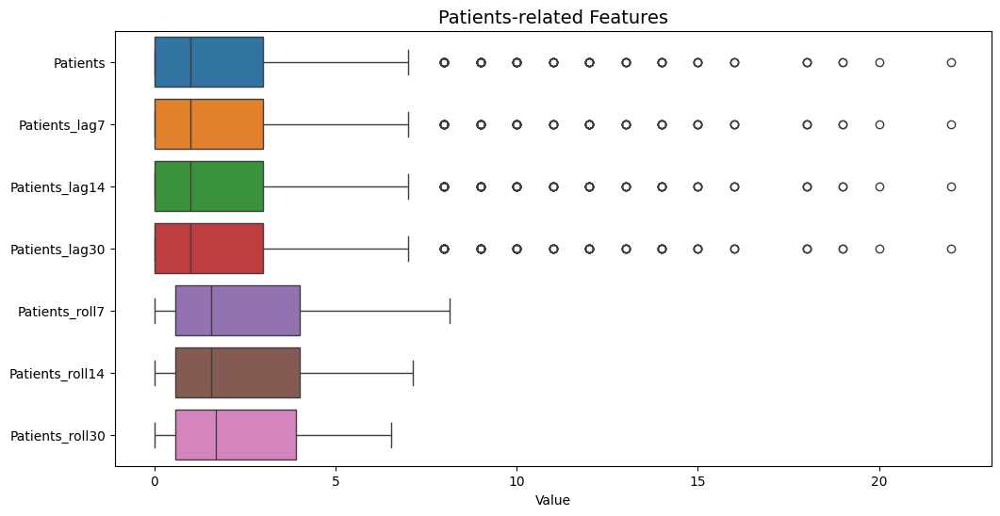

In [ ]:
temp_features = [col for col in df.columns if 'Patients' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[temp_features], orient='h')
plt.title('Patients-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

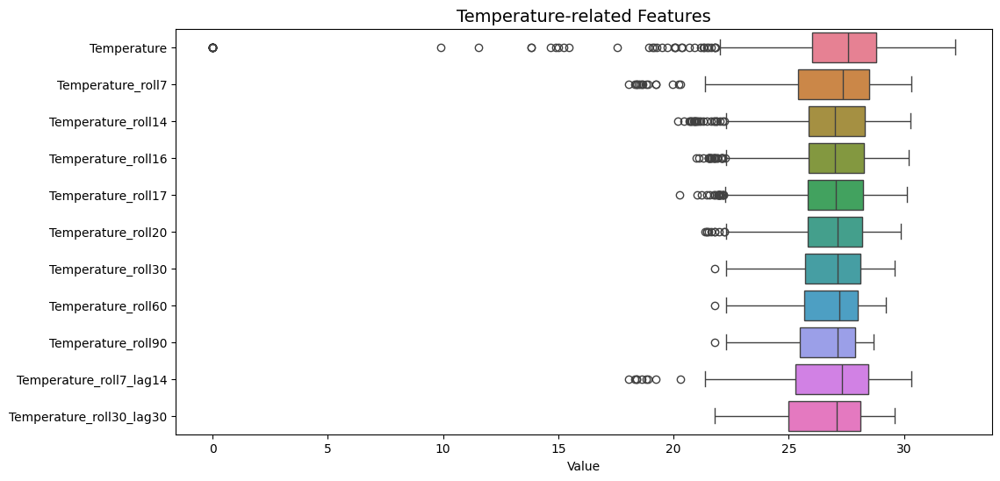

In [ ]:
temp_features = [col for col in df.columns if 'Temperature' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[temp_features], orient='h')
plt.title('Temperature-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

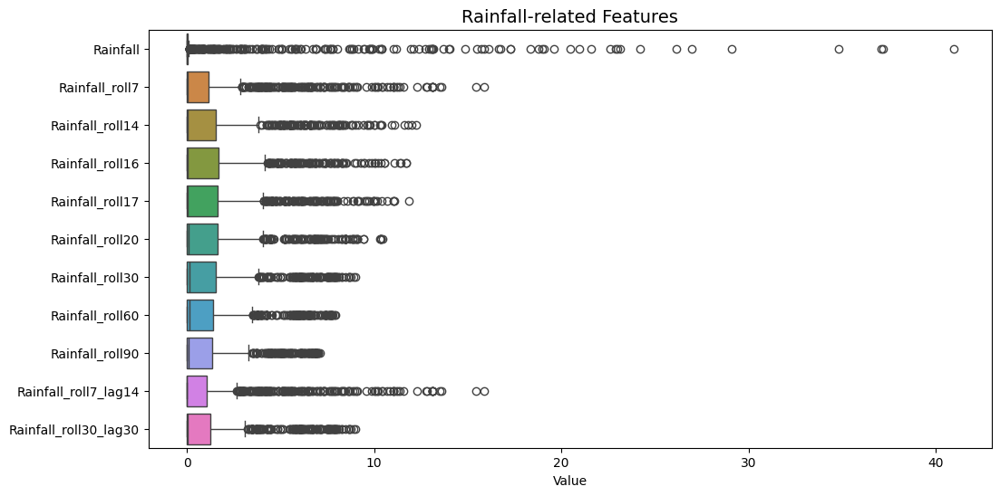

In [ ]:
rain_features = [col for col in df.columns if 'Rainfall' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[rain_features], orient='h')
plt.title('Rainfall-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

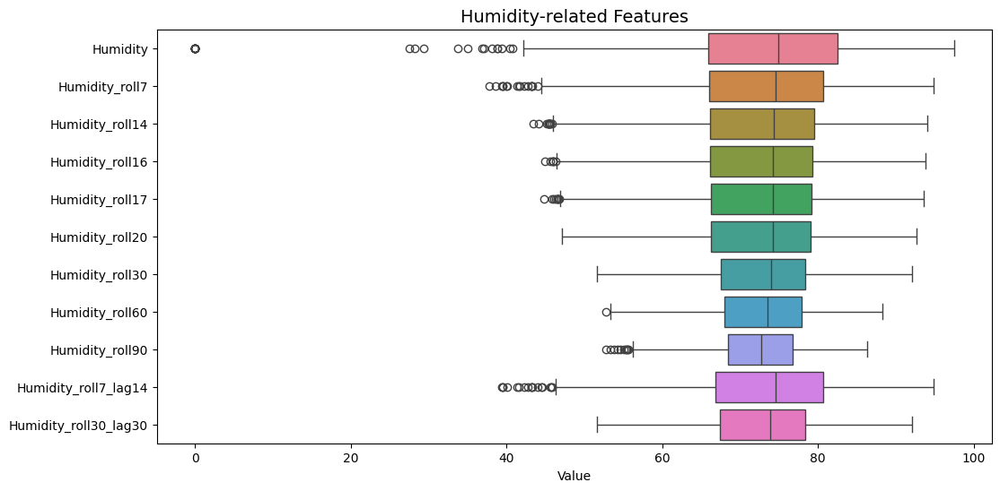

In [ ]:
humid_features = [col for col in df.columns if 'Humidity' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[humid_features], orient='h')
plt.title('Humidity-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

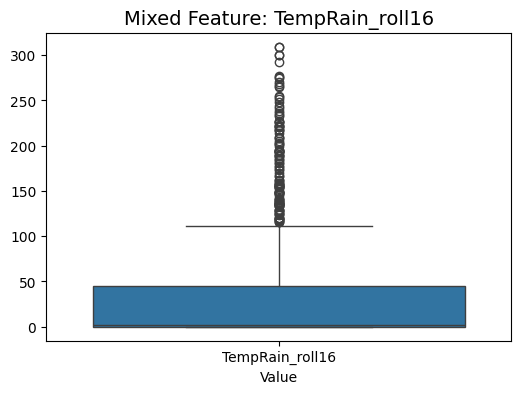

In [ ]:
plt.figure(figsize=(6, 4))
sns.boxplot(data=df[['TempRain_roll16']])
plt.title('Mixed Feature: TempRain_roll16', fontsize=14)
plt.xlabel('Value')
plt.show()

**สรุปค่า Outlier**

| Column             | Outlier (IQR) | Outlier (Z-score) |
| ------------------ | ------------- | ----------------- |
| Patients           | 0             | 0                 |
| Temperature        | **45**             | **21**                 |
| Rainfall           | **232**             | **29**                 |
| Humidity           | **26**             | **15**                 |
| Rainfall_roll7_lag14     | **186**             | **31**                 |
| Temperature_roll7_lag14     | **9**             | **8**                 |
| Humidity_roll7_lag14     | **17**             | **5**                 |
| Rainfall_roll30_lag30  | **156**             | **33**                  |
| Temperature_roll30_lag30  | 0             | 0                 |
| Humidity_roll30_lag30  | 0            | 0                 |
| Rainfall_roll7    | **180**                | **29**                 |
| Rainfall_roll14    | **130**              | **28**                  |
| Rainfall_roll16    | **129**             | **27**                  |
| Rainfall_roll17   | **133**             | **24**                  |
| Rainfall_roll20   | **123**             | **30**                  |
| Rainfall_roll30   | **130**             | **30**                  |
| Rainfall_roll60   | **137**             | **26**                  |
| Rainfall_roll90   | **130**             | **32**                  |
| Temperature_roll7   | **15**             | **15**                  |
| Temperature_roll14   | **24**             | **14**                  |
| Temperature_roll16  | **25**             | **3**                  |
| Temperature_roll17  | **21**             | **3**                  |
| Temperature_roll20  | **10**             | **4**                  |
| Temperature_roll30  | **1**             | **1**                  |
| Temperature_roll60  | **1**              | **1**               |
| Temperature_roll90  | **1**             | **1**                |
| Humidity_roll7 | **17**             | **6**                 |
| Humidity_roll14  | **12**             | 0                 |
| Humidity_roll16  | **6**             | 0                 |
|Humidity_roll17  | **9**             | 0                 |
| Humidity_roll20  | **3**             | 0                 |
| Humidity_roll30  | 0             | 0                 |
| Humidity_roll60  | 0            | 0                 |
| Humidity_roll90  | **1**             | 0                 |
| TempRain_roll16  | **10**             | 0                 |
| Temperature_roll16  | **130**             | **31**               |
          


จากการตรวจสอบค่า Outlier: พบว่า ค่า outllier ที่ตรวจพบไม่ใช่ค่าผิดพลาด จึงตัดสินใจเก็บค่า outlier ไว้ ไม่จัดการกับค่า outlier

##### ตรวจสอบ Consistency

In [ ]:
# ตรวจจำนวน record ซ้ำ
duplicates = df.groupby(["lat", "lon", "datesick"]).size().reset_index(name="count")
duplicates = duplicates[duplicates["count"] > 1]

if not duplicates.empty:
    print("พบข้อมูลซ้ำ:")
    print(duplicates)
else:
    print("ไม่พบ province+Month ซ้ำ")

ไม่พบ province+Month ซ้ำ


##### ตรวจสอบ Data Types

In [ ]:
print(df.dtypes)

datesick                    datetime64[ns]
Patients                             int64
Patients_lag7                      float64
Patients_lag14                     float64
Patients_lag30                     float64
Patients_roll7                     float64
Patients_roll14                    float64
Patients_roll30                    float64
Temperature                        float64
Rainfall                           float64
Humidity                           float64
Rainfall_roll7                     float64
Rainfall_roll14                    float64
Rainfall_roll16                    float64
Rainfall_roll17                    float64
Rainfall_roll20                    float64
Rainfall_roll30                    float64
Rainfall_roll60                    float64
Rainfall_roll90                    float64
Temperature_roll7                  float64
Temperature_roll14                 float64
Temperature_roll16                 float64
Temperature_roll17                 float64
Temperature

#### **Publishing**
เก็บข้อมูลให้อยู่ในรูปแบบที่พร้อมใช้สำหรับขั้นตอนต่อไป

In [ ]:
# บันทึกเป็นไฟล์ CSV
df.to_csv(f"{root}/dengue_ready2.csv", index=False, encoding="utf-8-sig")
print("Data พร้อมใช้แล้ว -> dengue_ready2.csv")

Data พร้อมใช้แล้ว -> dengue_ready2.csv


### Descriptive Statistics

สถิติเชิงพรรณนาของคอลัมน์ที่เป็น numerical

#### คำนวณค่า mean, median, mode, std, min, max, quartiles

In [ ]:
# เลือกคอลัมน์ที่เป็น numerical
num_cols = ['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30']

# ค่าสถิติพื้นฐาน
summary = df[num_cols].describe(percentiles=[0.25, 0.5, 0.75]).T
# เพิ่ม mode (ค่าเดียวหรือหลายค่าได้ เลยเอาอันแรก)
summary['mode'] = df[num_cols].mode().iloc[0]

# จัดรูปให้อ่านง่าย
summary = summary.rename(columns={
    'mean': 'Mean',
    '50%': 'Median',
    'std': 'Std',
    'min': 'Min',
    '25%': 'Q1',
    '75%': 'Q3',
    'max': 'Max'
})[['Mean','Median','mode','Std','Min','Q1','Q3','Max']]

display(summary)

,Mean,Median,mode,Std,Min,Q1,Q3,Max
Patients,2.319635,1.000000,0.000000,3.362081,0.000000,0.000000,3.000000,22.000000
Patients_lag7,2.318721,1.000000,0.000000,3.362576,0.000000,0.000000,3.000000,22.000000
Patients_lag14,2.316895,1.000000,0.000000,3.363564,0.000000,0.000000,3.000000,22.000000
Patients_lag30,2.300457,1.000000,0.000000,3.364802,0.000000,0.000000,3.000000,22.000000
Patients_roll7,2.319287,1.571429,0.428571,2.033637,0.000000,0.571429,4.000000,8.142857
Patients_roll14,2.319418,1.571429,0.571429,1.953064,0.000000,0.571429,4.000000,7.142857
Patients_roll30,2.318890,1.700000,0.466667,1.902669,0.000000,0.566667,3.900000,6.533333
Temperature,26.841620,27.575000,0.000000,3.842603,0.000000,26.022500,28.782857,32.210000
Rainfall,1.281859,0.000000,0.000000,4.291012,0.000000,0.000000,0.050000,40.942857
Humidity,72.711574,74.960000,0.000000,14.624345,0.000000,65.920000,82.492500,97.457143


#### คำนวณค่า skewness และ kurtosis

In [ ]:
# หาค่า skewness และ kurtosis
columns = ['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30']

for col in columns:
    print(f"Skewness ของ {col}: {df[col].skew()}")
    print(f"Kurtosis ของ {col}: {df[col].kurt()}")
    print("="*35)


Skewness ของ Patients: 0.6060879223835633
Kurtosis ของ Patients: -0.7195367427000452
Skewness ของ Patients_lag7: 0.6066659374604099
Kurtosis ของ Patients_lag7: -0.7208330018725788
Skewness ของ Patients_lag14: 0.6078318154395489
Kurtosis ของ Patients_lag14: -0.7234019982590145
Skewness ของ Patients_lag30: 0.6210835401482664
Kurtosis ของ Patients_lag30: -0.7137081904013098
Skewness ของ Patients_roll7: 0.29516302144189066
Kurtosis ของ Patients_roll7: -1.228050701198948
Skewness ของ Patients_roll14: 0.28271358460553503
Kurtosis ของ Patients_roll14: -1.2985578816129424
Skewness ของ Patients_roll30: 0.2805714899660348
Kurtosis ของ Patients_roll30: -1.358285366654837
Skewness ของ Temperature: -4.45941414807992
Kurtosis ของ Temperature: 27.04118607940087
Skewness ของ Rainfall: 4.826326758390625
Kurtosis ของ Rainfall: 27.921834948585833
Skewness ของ Humidity: -1.7123690305750896
Kurtosis ของ Humidity: 5.842586277015753
Skewness ของ Rainfall_roll7: 2.600319055513582
Kurtosis ของ Rainfall_roll7: 

| Variable | Skewness | Kurtosis | Interpretation |
|-----------|-----------|-----------|----------------|
| Patients | 0.61 | -0.72 | เบ้ขวาเล็กน้อย → ส่วนใหญ่ผู้ป่วยอยู่ค่าต่ำกว่าค่าเฉลี่ยเล็กน้อย การกระจายค่อนข้างแบน ไม่มี outlier ชัดเจน |
| Temperature | -4.46 | 27.04 | เบ้ซ้ายมาก → มีค่าต่ำสุดบางจุด อุณหภูมิกระจุกที่ค่าสูง ส่วนปลายกระจายยาว มี outlier จำนวนมาก (leptokurtic) |
| Rainfall | 4.83 | 27.92 | เบ้ขวามาก → ส่วนใหญ่ฝนตกน้อย มีบางช่วงฝนตกหนักมาก การกระจายแหลม (มี outlier สูงมาก) |
| Humidity | -1.71 | 5.84 | เบ้ซ้าย → ความชื้นส่วนใหญ่ค่าสูง มีค่าต่ำบางช่วง การกระจายแหลม (leptokurtic) |
| Rainfall_roll7_lag14 | 2.69 | 7.45 | เบ้ขวา → ส่วนใหญ่ฝนตกน้อย/ปานกลาง มีบางช่วงฝนตกมาก การกระจายแหลม มี outlier สูง |
| Temperature_roll7_lag14 | -0.84 | 0.39 | เบ้ซ้ายเล็กน้อย → อุณหภูมิค่อนข้างกระจายสมมาตร ใกล้ Normal distribution |
| Humidity_roll7_lag14 | -0.57 | 0.04 | ใกล้สมมาตร → การกระจายใกล้ Normal, ไม่มี outlier เด่นชัด |
| Rainfall_roll30_lag30 | 2.03 | 3.09 | เบ้ขวา → ฝนตกน้อยเป็นส่วนใหญ่ แต่บางช่วงมีฝนตกมาก การกระจายแหลมกว่าปกติ |
| Temperature_roll30_lag30 | -0.79 | -0.37 | เบ้ซ้ายเล็กน้อย → การกระจายค่อนข้างแบน ใกล้ Normal |
| Humidity_roll30_lag30 | -0.16 | -0.47 | ใกล้สมมาตร → การกระจายใกล้ Normal ไม่มี outlier ชัดเจน |
| Rainfall_roll7 | 2.60 | 6.94 | เบ้ขวา → ส่วนใหญ่ฝนน้อย มีบางช่วงฝนตกมาก การกระจายแหลม (leptokurtic) |
| Rainfall_roll14 | 2.21 | 4.55 | เบ้ขวา → คล้าย roll7 แต่แหลมน้อยกว่า ฝนตกมากบางช่วง |
| Rainfall_roll16 | 2.20 | 4.50 | เบ้ขวา → การกระจายคล้าย Rainfall_roll14 |
| Rainfall_roll17 | 2.18 | 4.37 | เบ้ขวา → การกระจายคล้าย Rainfall_roll16 |
| Rainfall_roll20 | 2.10 | 3.85 | เบ้ขวา → ฝนน้อยส่วนใหญ่ มีบางช่วงฝนตกมาก |
| Rainfall_roll30 | 1.93 | 2.81 | เบ้ขวา → การกระจายใกล้ Normal มากขึ้น มีค่าผิดปกติสูงน้อยลง |
| Rainfall_roll60 | 1.87 | 2.57 | เบ้ขวาเล็กน้อย → การกระจายค่อนข้างปกติ มี outlier สูงน้อย |
| Rainfall_roll90 | 1.86 | 2.50 | เบ้ขวาเล็กน้อย → การกระจายใกล้ Normal มากที่สุดในกลุ่ม Rainfall rolling |
| Temperature_roll7 | -0.98 | 1.11 | เบ้ซ้าย → อุณหภูมิค่าสูงเป็นส่วนใหญ่ การกระจายค่อนข้างแหลม |
| Temperature_roll14 | -0.85 | 0.50 | เบ้ซ้าย → ใกล้ Normal การกระจายไม่แหลมมาก |
| Temperature_roll16 | -0.79 | 0.23 | เบ้ซ้าย → การกระจายสมมาตรขึ้น ใกล้ Normal |
| Temperature_roll17 | -0.78 | 0.20 | เบ้ซ้ายเล็กน้อย → ใกล้ Normal ไม่มี outlier เด่น |
| Temperature_roll20 | -0.71 | -0.04 | เบ้ซ้ายเล็กน้อย → การกระจายแบน ใกล้ Normal |
| Temperature_roll30 | -0.61 | -0.47 | ใกล้สมมาตร → การกระจายใกล้ Normal |
| Temperature_roll60 | -0.70 | -0.48 | เบ้ซ้ายเล็กน้อย → ใกล้ Normal ไม่มี outlier |
| Temperature_roll90 | -0.69 | -0.61 | เบ้ซ้ายเล็กน้อย → การกระจายใกล้ Normal |
| Humidity_roll7 | -0.66 | 0.11 | ใกล้สมมาตร → การกระจายใกล้ Normal ไม่มี outlier |
| Humidity_roll14 | -0.56 | 0.07 | ใกล้สมมาตร → คล้าย roll7 ไม่มี outlier เด่น |
| Humidity_roll16 | -0.51 | 0.02 | ใกล้สมมาตร → การกระจายเรียบ ใกล้ Normal |
| Humidity_roll17 | -0.48 | 0.00 | ใกล้สมมาตร → ใกล้ Normal ไม่มีค่าผิดปกติ |
| Humidity_roll20 | -0.40 | -0.10 | ใกล้สมมาตร → การกระจายแบน ไม่มี outlier |
| Humidity_roll30 | -0.25 | -0.36 | ใกล้สมมาตร → การกระจายเรียบ ใกล้ Normal |
| Humidity_roll60 | -0.16 | -0.48 | ใกล้สมมาตร → การกระจายแบน ไม่มี outlier |
| Humidity_roll90 | -0.17 | -0.43 | ใกล้สมมาตร → การกระจายใกล้ Normal |
| TempRain_roll16 | 2.17 | 4.20 | เบ้ขวา → ส่วนใหญ่ค่าต่ำ มีค่าผิดปกติสูงบางช่วง การกระจายแหลม (leptokurtic) |


### Univariate Analysis

#### สถิติเบื้องต้น

In [ ]:
# เลือกคอลัมน์ที่เป็น numerical
num_cols =  ['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30']

# ค่าสถิติพื้นฐาน
summary = df[num_cols].describe(percentiles=[0.25, 0.5, 0.75]).T
# เพิ่ม mode (ค่าเดียวหรือหลายค่าได้ เลยเอาอันแรก)
summary['mode'] = df[num_cols].mode().iloc[0]

# จัดรูปให้อ่านง่าย
summary = summary.rename(columns={
    'mean': 'Mean',
    '50%': 'Median',
    'std': 'Std',
    'min': 'Min',
    '25%': 'Q1',
    '75%': 'Q3',
    'max': 'Max'
})[['Mean','Median','mode','Std','Min','Q1','Q3','Max']]

display(summary)

,Mean,Median,mode,Std,Min,Q1,Q3,Max
Patients,0.825714,0.693147,0.000000,0.823256,0.000000,0.000000,1.386294,3.135494
Patients_lag7,0.825081,0.693147,0.000000,0.823624,0.000000,0.000000,1.386294,3.135494
Patients_lag14,0.823815,0.693147,0.000000,0.824359,0.000000,0.000000,1.386294,3.135494
Patients_lag30,0.816603,0.693147,0.000000,0.825530,0.000000,0.000000,1.386294,3.135494
Patients_roll7,0.825466,0.709973,0.297063,0.562110,0.000000,0.297063,1.285342,2.095825
Patients_roll14,0.825461,0.730522,0.297063,0.545814,0.000000,0.330231,1.296373,2.001421
Patients_roll30,0.825544,0.796220,0.281185,0.535310,0.000000,0.340910,1.273125,1.936663
Temperature,0.818841,0.841214,0.000000,0.117224,0.000000,0.793853,0.878062,0.982611
Rainfall,0.007962,0.000000,0.000000,0.026652,0.000000,0.000000,0.000311,0.254303
Humidity,0.727116,0.749600,0.000000,0.146243,0.000000,0.659200,0.824925,0.974571


#### Numerical

1. `Patients` - จำนวนผู้ป่วยรายวันในแต่ละจังหวัด  
4. `Temperature` - ค่าอุณหภูมิเฉลี่ยรายวัน (องศาเซลเซียส)  
5. `Rainfall` - ปริมาณน้ำฝนรายวัน (มิลลิเมตร)  
6. `Humidity` - ความชื้นสัมพัทธ์เฉลี่ยรายวัน (%)  
7. `Rainfall_roll7_lag14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
8. `Temperature_roll7_lag14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
9. `Humidity_roll7_lag14` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
10. `Rainfall_roll30_lag30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
11. `Temperature_roll30_lag30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
12. `Humidity_roll30_lag30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
13. `Rainfall_roll7` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน  
14. `Rainfall_roll14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 14 วัน  
15. `Rainfall_roll16` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 16 วัน  
16. `Rainfall_roll17` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 17 วัน  
17. `Rainfall_roll20` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 20 วัน  
18. `Rainfall_roll30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน  
19. `Rainfall_roll60` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 60 วัน  
20. `Rainfall_roll90` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 90 วัน  
21. `Temperature_roll7` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน  
22. `Temperature_roll14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 14 วัน  
23. `Temperature_roll16` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 16 วัน  
24. `Temperature_roll17` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 17 วัน  
25. `Temperature_roll20` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 20 วัน  
26. `Temperature_roll30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน  
27. `Temperature_roll60` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 60 วัน  
28. `Temperature_roll90` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 90 วัน  
29. `Humidity_roll7` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน  
30. `Humidity_roll14` - ค่าเฉลี่ยความชื้นย้อนหลัง 14 วัน  
31. `Humidity_roll16` - ค่าเฉลี่ยความชื้นย้อนหลัง 16 วัน  
32. `Humidity_roll17` - ค่าเฉลี่ยความชื้นย้อนหลัง 17 วัน  
33. `Humidity_roll20` - ค่าเฉลี่ยความชื้นย้อนหลัง 20 วัน  
34. `Humidity_roll30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน  
35. `Humidity_roll60` - ค่าเฉลี่ยความชื้นย้อนหลัง 60 วัน  
36. `Humidity_roll90` - ค่าเฉลี่ยความชื้นย้อนหลัง 90 วัน  
37. `TempRain_roll16` - ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน เพื่อดูผลร่วมของปัจจัยสภาพอากาศ  

##### Histogram

ใช้วิเคราะห์ข้อมูลเชิงตัวเลขดูการกระจายตัวของค่า

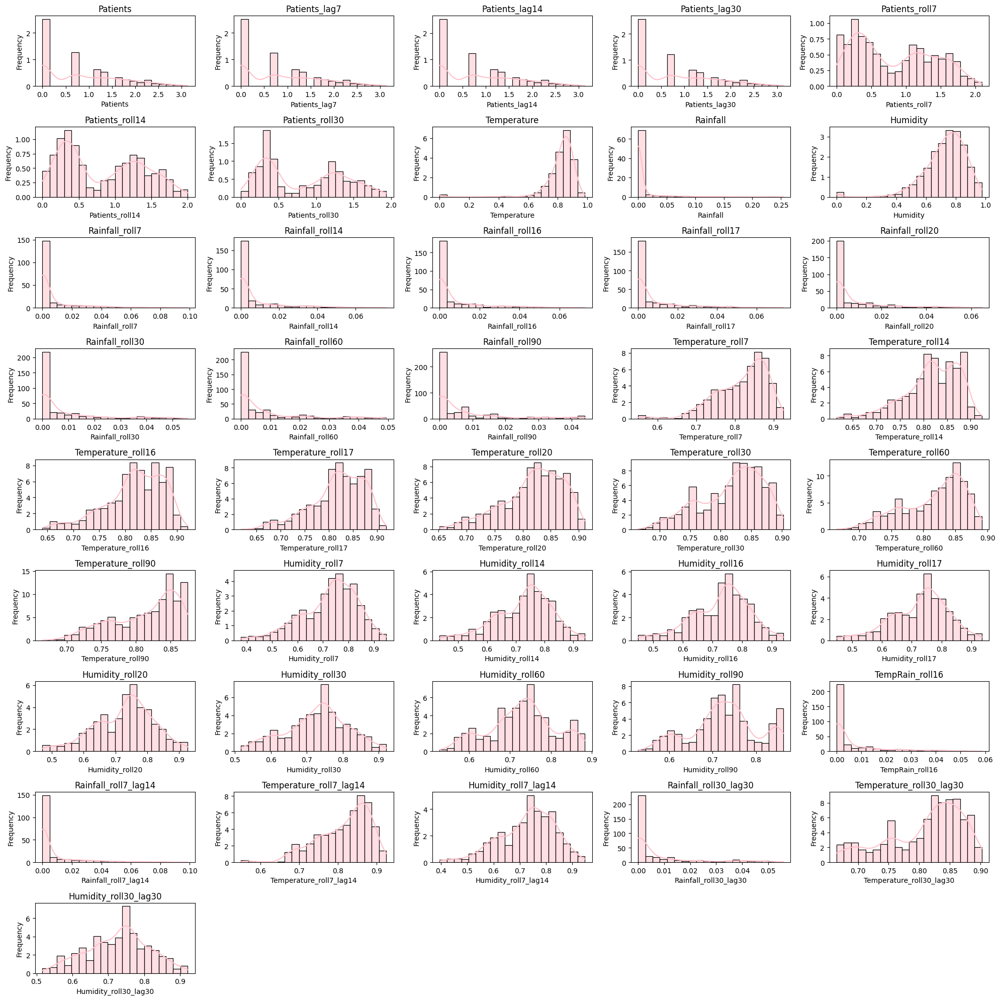

In [ ]:
cols =  [
        'Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30'
]

plt.figure(figsize=(20, 20))

for i, col in enumerate(cols, 1):
    plt.subplot(9, 5, i)
    sns.histplot(df[col], kde=True, stat="density", bins=20, color="pink")
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

**ตีความจาก Histogram graph**

| กลุ่มตัวแปร         | ลักษณะการกระจาย | ความหมายเชิงข้อมูล                           |
| ------------------- | --------------- | -------------------------------------------- |
| Patients            | เบ้ขวา          | ผู้ป่วยส่วนมากเกิดน้อย แต่มีบางช่วงระบาดหนัก |
| Rainfall            | เบ้ขวา          | ฝนตกน้อยบ่อย แต่ตกหนักเป็นบางครั้ง           |
| Temperature         | ใกล้ normal     | อุณหภูมิคงที่ ไม่มีความแปรปรวนมาก            |
| Humidity            | ใกล้ normal     | ความชื้นเสถียร ค่อนข้างสูงตลอดปี             |
| Combined (TempRain) | เบ้ขวา          | ภาวะฝน+อุณหภูมิบางช่วงอาจสัมพันธ์กับการระบาด |


##### Boxplot

ใช้วิเคราะห์ข้อมูลเชิงตัวเลขดูค่ากลาง การกระจาย และ outlier

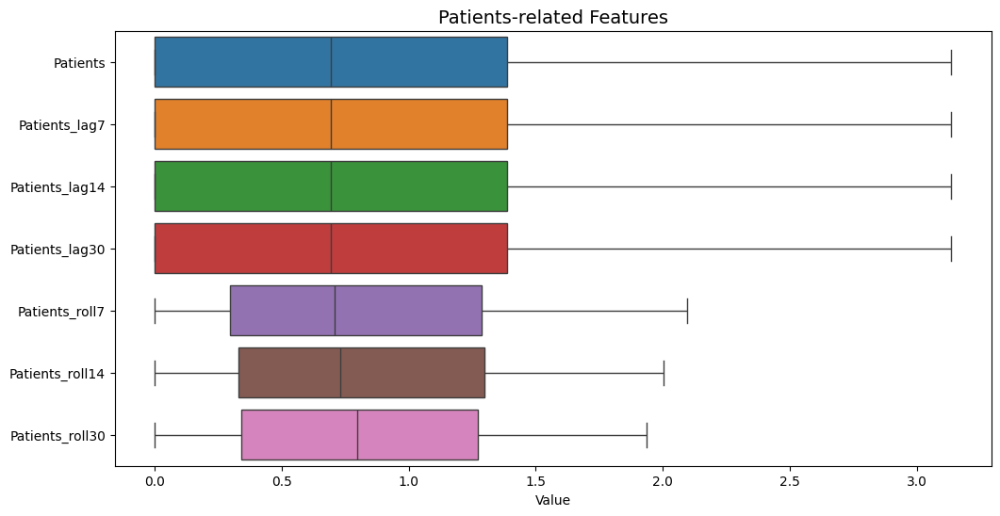

In [ ]:
patient_features = [col for col in df.columns if 'Patients' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[patient_features], orient='h')
plt.title('Patients-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

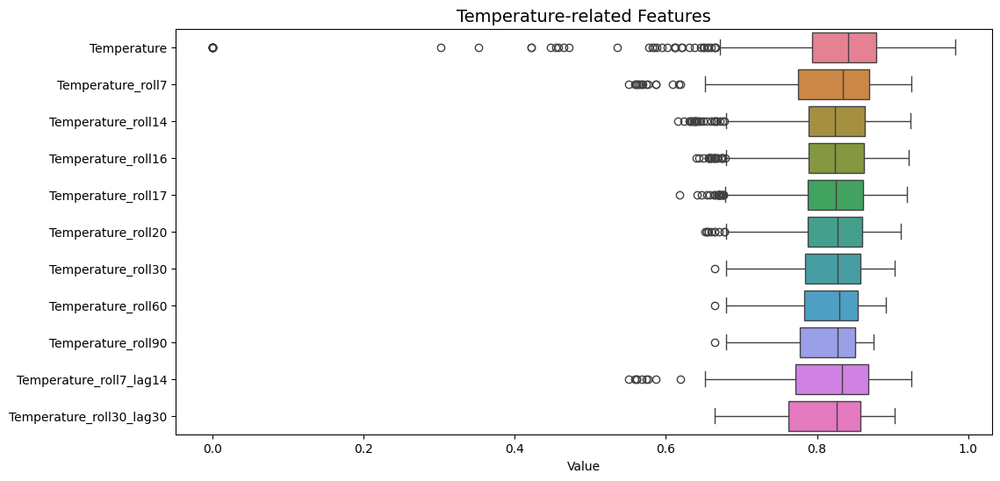

In [ ]:
temp_features = [col for col in df.columns if 'Temperature' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[temp_features], orient='h')
plt.title('Temperature-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

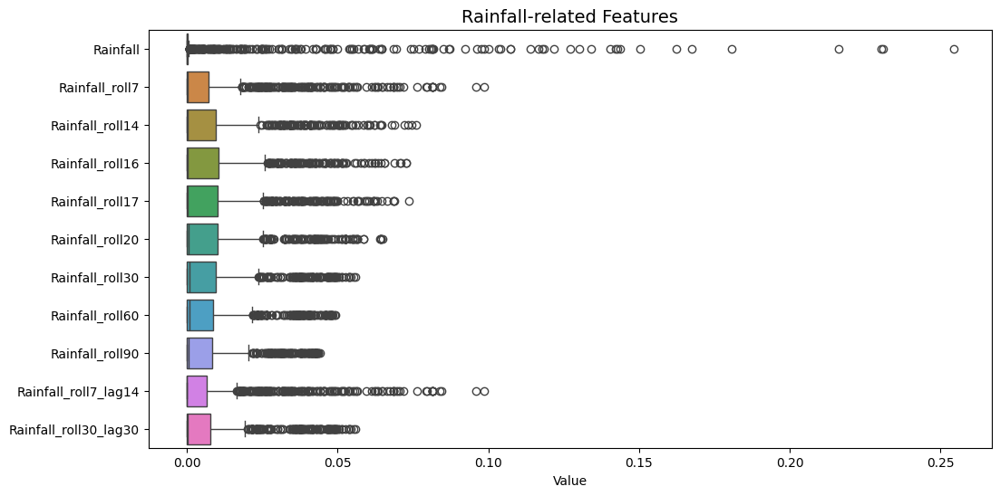

In [ ]:
rain_features = [col for col in df.columns if 'Rainfall' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[rain_features], orient='h')
plt.title('Rainfall-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

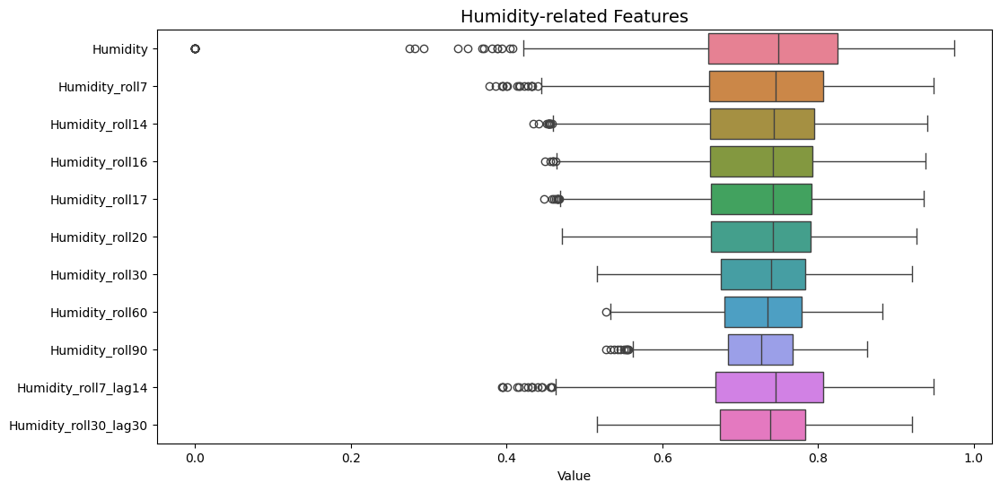

In [ ]:
humid_features = [col for col in df.columns if 'Humidity' in col]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[humid_features], orient='h')
plt.title('Humidity-related Features', fontsize=14)
plt.xlabel('Value')
plt.show()

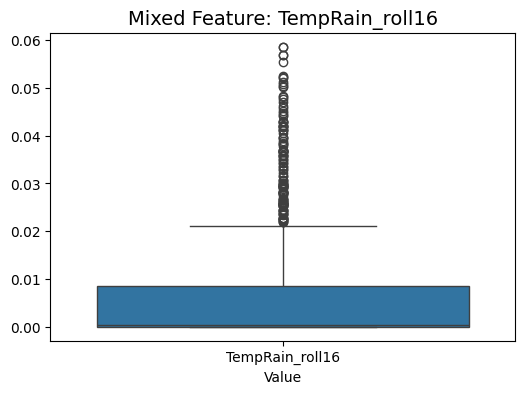

In [ ]:
plt.figure(figsize=(6, 4))
sns.boxplot(data=df[['TempRain_roll16']])
plt.title('Mixed Feature: TempRain_roll16', fontsize=14)
plt.xlabel('Value')
plt.show()

#### Catagory

Bar chart จำนวนผู้ป่วยตามเดือน

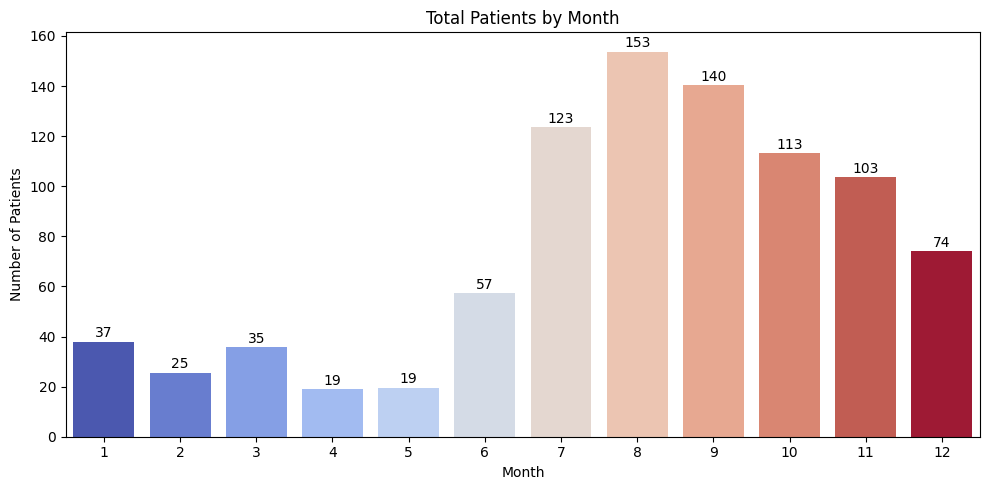

In [ ]:
# Extract month from the 'datesick' column
df['Month'] = df['datesick'].dt.month

# นับจำนวนผู้ป่วยรวมตามเดือน
month_counts = df.groupby('Month')['Patients'].sum().sort_index()
months = month_counts.index  # สร้างตัวแปร months

plt.figure(figsize=(10, 5))
ax = sns.barplot(
    x=months,
    y=month_counts.values,
    hue=months,
    palette="coolwarm",
    dodge=False,
    legend=False
)

# แสดงตัวเลขบนแต่ละแท่ง
for i, v in enumerate(month_counts.values):
    ax.text(i, v + 0.5, str(int(v)), ha='center', va='bottom')

plt.title("Total Patients by Month")
plt.xlabel("Month")
plt.ylabel("Number of Patients")
plt.tight_layout()
plt.show()


*  ผู้ป่วยสูงสุด: เดือน 7–9 (กราฟแสดงจำนวนผู้ป่วยสูงสุดที่เดือน 8 = 153)
*  ผู้ป่วยต่ำ: เดือน 1–5 (จำนวนผู้ป่วยต่ำสุดช่วงเดือน 2–5)




**สังเกตได้ว่า:** มี seasonal pattern → ช่วงฤดูฝน (ประมาณเดือน 7–9) จำนวนผู้ป่วยเพิ่มสูง

**อนุมาน:** จำนวนผู้ป่วยมี seasonal trend ตามฤดูกาล โดยเฉพาะช่วงฤดูฝนผู้ป่วยจะสูงขึ้น ส่วนช่วงหน้าแล้งผู้ป่วยจะต่ำลง

### Bivariate Analysis

#### Numerical vs Numerical

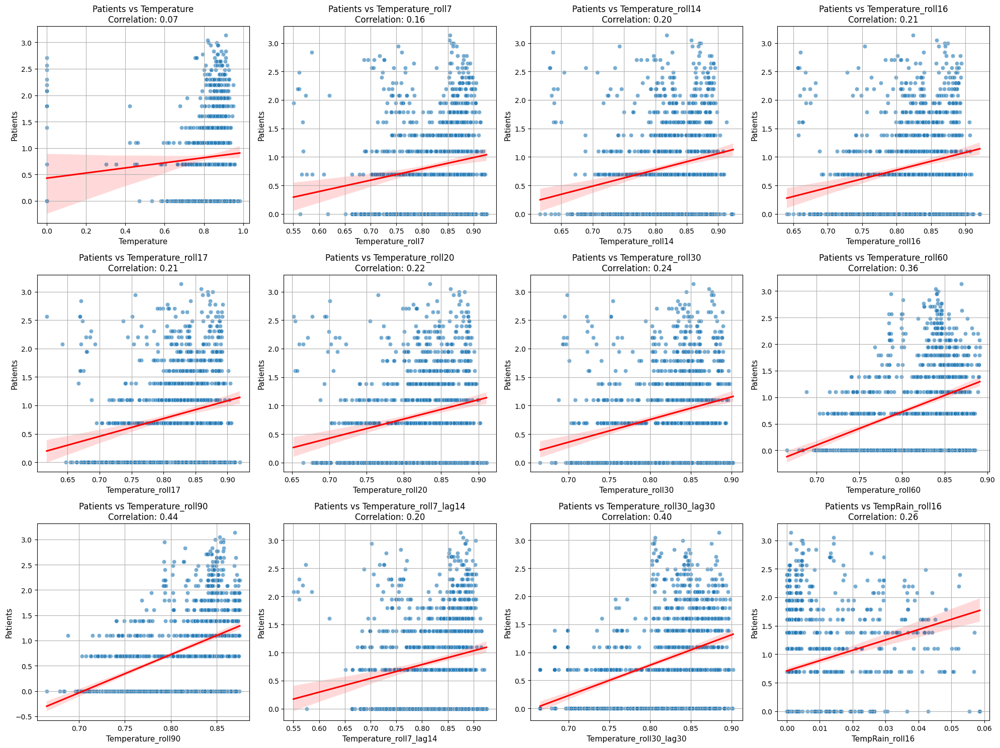

In [ ]:
# กำหนดคู่คอลัมน์ที่ต้องการวิเคราะห์
pairs = [
    ('Temperature', 'Patients'),
    ('Temperature_roll7', 'Patients'),
    ('Temperature_roll14', 'Patients'),
    ('Temperature_roll16', 'Patients'),
    ('Temperature_roll17', 'Patients'),
    ('Temperature_roll20', 'Patients'),
    ('Temperature_roll30', 'Patients'),
    ('Temperature_roll60', 'Patients'),
    ('Temperature_roll90', 'Patients'),
    ('Temperature_roll7_lag14', 'Patients'),
    ('Temperature_roll30_lag30', 'Patients'),
    ('TempRain_roll16', 'Patients')
]

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(pairs):
    ax = axes[i]
    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        alpha=0.6,
        ax=ax
    )
    sns.regplot(
        data=df,
        x=x_col,
        y=y_col,
        scatter=False,
        color='red',
        ax=ax
    )
    ax.set_xlabel(f'{x_col}', fontsize=11)
    ax.set_ylabel(f'{y_col}', fontsize=11)
    ax.set_title(f'{y_col} vs {x_col}\nCorrelation: {df[y_col].corr(df[x_col]):.2f}', fontsize=12)
    ax.grid(True)

# ปิด subplot ที่เหลือ
for j in range(len(pairs), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

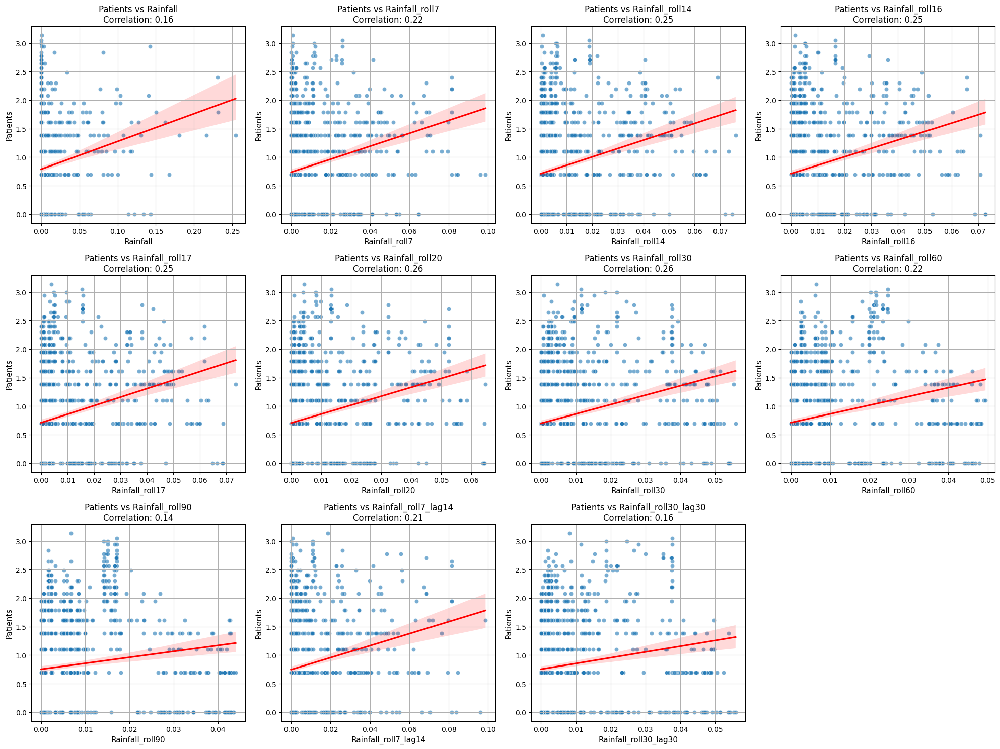

In [ ]:
# กำหนดคู่คอลัมน์ที่ต้องการวิเคราะห์
pairs = [
    ('Rainfall', 'Patients'),
    ('Rainfall_roll7', 'Patients'),
    ('Rainfall_roll14', 'Patients'),
    ('Rainfall_roll16', 'Patients'),
    ('Rainfall_roll17', 'Patients'),
    ('Rainfall_roll20', 'Patients'),
    ('Rainfall_roll30', 'Patients'),
    ('Rainfall_roll60', 'Patients'),
    ('Rainfall_roll90', 'Patients'),
    ('Rainfall_roll7_lag14', 'Patients'),
    ('Rainfall_roll30_lag30', 'Patients')
]

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(pairs):
    ax = axes[i]
    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        alpha=0.6,
        ax=ax
    )
    sns.regplot(
        data=df,
        x=x_col,
        y=y_col,
        scatter=False,
        color='red',
        ax=ax
    )
    ax.set_xlabel(f'{x_col}', fontsize=11)
    ax.set_ylabel(f'{y_col}', fontsize=11)
    ax.set_title(f'{y_col} vs {x_col}\nCorrelation: {df[y_col].corr(df[x_col]):.2f}', fontsize=12)
    ax.grid(True)

# ปิด subplot ที่เหลือ
for j in range(len(pairs), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

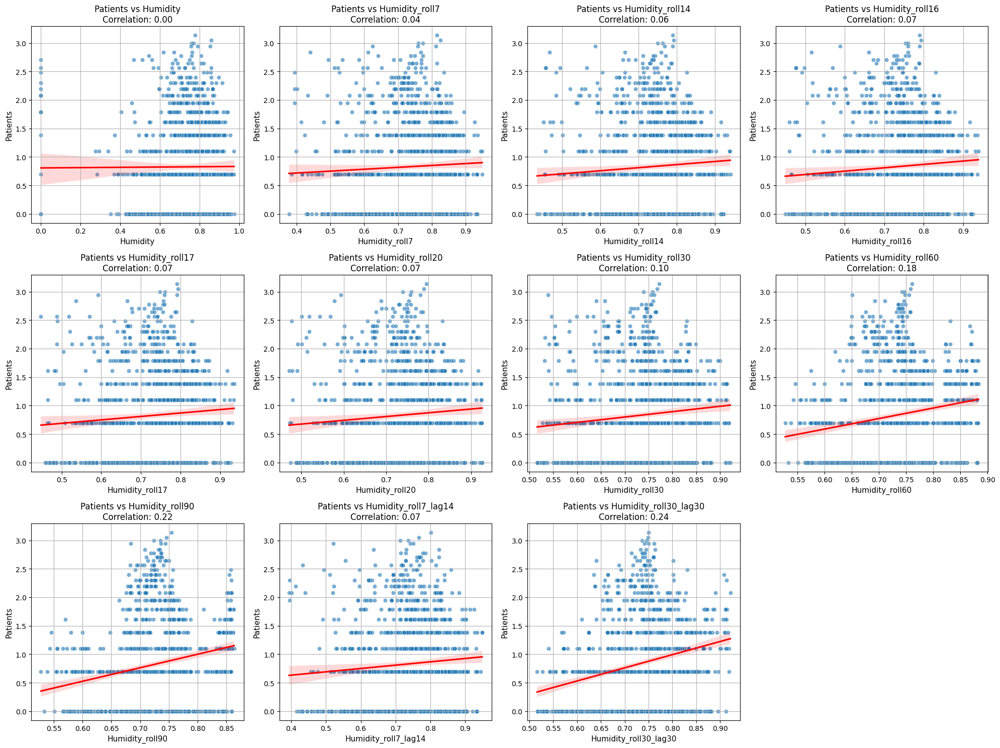

In [ ]:
# กำหนดคู่คอลัมน์ที่ต้องการวิเคราะห์
pairs = [
    ('Humidity', 'Patients'),
    ('Humidity_roll7', 'Patients'),
    ('Humidity_roll14', 'Patients'),
    ('Humidity_roll16', 'Patients'),
    ('Humidity_roll17', 'Patients'),
    ('Humidity_roll20', 'Patients'),
    ('Humidity_roll30', 'Patients'),
    ('Humidity_roll60', 'Patients'),
    ('Humidity_roll90', 'Patients'),
    ('Humidity_roll7_lag14', 'Patients'),
    ('Humidity_roll30_lag30', 'Patients')
]

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(pairs):
    ax = axes[i]
    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        alpha=0.6,
        ax=ax
    )
    sns.regplot(
        data=df,
        x=x_col,
        y=y_col,
        scatter=False,
        color='red',
        ax=ax
    )
    ax.set_xlabel(f'{x_col}', fontsize=11)
    ax.set_ylabel(f'{y_col}', fontsize=11)
    ax.set_title(f'{y_col} vs {x_col}\nCorrelation: {df[y_col].corr(df[x_col]):.2f}', fontsize=12)
    ax.grid(True)

# ปิด subplot ที่เหลือ
for j in range(len(pairs), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

---

###  Patients vs Rainfall Factor Correlation

| ตัวแปร                | ค่าสหสัมพันธ์ (r) | การตีความ                                                                                |
| --------------------- | ----------------- | ---------------------------------------------------------------------------------------- |
| Rainfall              | 0.16              | ความสัมพันธ์อ่อน — ปริมาณฝนปัจจุบันมีผลต่อจำนวนผู้ป่วยเล็กน้อย                           |
| Rainfall_roll7        | 0.22              | ค่าเฉลี่ย 7 วัน ความสัมพันธ์ดีขึ้นเล็กน้อย → ผู้ป่วยอาจตอบสนองต่อฝนในช่วงสัปดาห์ก่อนหน้า |
| Rainfall_roll14       | 0.25              | ค่าเฉลี่ย 14 วันเริ่มมีผลชัดขึ้น                                                         |
| Rainfall_roll16       | 0.25              | ใกล้เคียงกับ roll14 → ฝนสะสมช่วง 2 สัปดาห์สัมพันธ์กับผู้ป่วย                             |
| Rainfall_roll17       | 0.25              | ความสัมพันธ์คงที่ในระดับปานกลาง                                                          |
| Rainfall_roll20       | 0.26              | ค่าเฉลี่ย 20 วันให้ค่าความสัมพันธ์สูงสุดในช่วงสั้น                                       |
| Rainfall_roll30       | 0.26              | ความสัมพันธ์ระดับปานกลางคงที่ต่อเนื่อง                                                   |
| Rainfall_roll60       | 0.22              | ระยะยาว 2 เดือนลดลงเล็กน้อย                                                              |
| Rainfall_roll90       | 0.14              | ค่าเฉลี่ย 3 เดือนมีผลน้อยมาก                                                             |
| Rainfall_roll7_lag14  | 0.21              | เมื่อเลื่อนข้อมูลฝนย้อนหลัง 2 สัปดาห์ ความสัมพันธ์ดีขึ้นเล็กน้อย                         |
| Rainfall_roll30_lag30 | 0.16              | ฝนย้อนหลัง 1 เดือนยังคงมีผลแต่ไม่มาก                                                     |

---

###  Patients vs Humidity Factor Correlation

| ตัวแปร                | ค่าสหสัมพันธ์ (r) | การตีความ                                                      |
| --------------------- | ----------------- | -------------------------------------------------------------- |
| Humidity              | 0.00              | ไม่มีความสัมพันธ์เลยกับจำนวนผู้ป่วย                            |
| Humidity_roll7        | -0.04             | ความสัมพันธ์เป็นลบเล็กน้อย → ความชื้นสัปดาห์ก่อนหน้าแทบไม่มีผล |
| Humidity_roll14       | 0.06              | ความสัมพันธ์อ่อนมาก                                            |
| Humidity_roll16       | 0.07              | เริ่มดีขึ้นเล็กน้อย                                            |
| Humidity_roll17       | 0.07              | ใกล้เคียงกัน                                                   |
| Humidity_roll20       | 0.07              | ความสัมพันธ์ต่ำมาก                                             |
| Humidity_roll30       | 0.10              | ค่าเฉลี่ย 1 เดือนเริ่มมีผลเล็กน้อย                             |
| Humidity_roll60       | 0.18              | ความสัมพันธ์เริ่มชัดขึ้นเล็กน้อยในระยะ 2 เดือน                 |
| Humidity_roll90       | 0.22              | ความสัมพันธ์ปานกลางในระยะยาว (3 เดือน)                         |
| Humidity_roll7_lag14  | 0.07              | ล่าช้า 2 สัปดาห์ ความสัมพันธ์ไม่เปลี่ยน                        |
| Humidity_roll30_lag30 | 0.24              | ล่าช้า 1 เดือน ความสัมพันธ์สูงขึ้น → ความชื้นในอดีตมีผลมากกว่า |

---

###  Patients vs Temperature Factor Correlation

| ตัวแปร                   | ค่าสหสัมพันธ์ (r) | การตีความ                                                               |
| ------------------------ | ----------------- | ----------------------------------------------------------------------- |
| Temperature              | 0.07              | ความสัมพันธ์อ่อนมาก — อุณหภูมิปัจจุบันแทบไม่มีผล                        |
| Temperature_roll7        | 0.16              | ความสัมพันธ์ดีขึ้นเล็กน้อยเมื่อเฉลี่ย 7 วัน                             |
| Temperature_roll14       | 0.20              | ความสัมพันธ์เพิ่มขึ้นต่อเนื่อง                                          |
| Temperature_roll16       | 0.21              | เริ่มเห็นแนวโน้มชัดเจน                                                  |
| Temperature_roll17       | 0.21              | ใกล้เคียงกับ roll16                                                     |
| Temperature_roll20       | 0.22              | ความสัมพันธ์ระดับปานกลางในช่วง 20 วัน                                   |
| Temperature_roll30       | 0.24              | ค่าความสัมพันธ์สูงขึ้นต่อเนื่อง                                         |
| Temperature_roll60       | 0.36              | ระยะยาว 2 เดือน ความสัมพันธ์ชัดเจนมากขึ้น                               |
| Temperature_roll90       | 0.44              | ความสัมพันธ์ค่อนข้างดี → แนวโน้มอุณหภูมิ 3 เดือนมีผลต่อผู้ป่วย          |
| Temperature_roll7_lag14  | 0.20              | ล่าช้า 2 สัปดาห์ ความสัมพันธ์คงที่                                      |
| Temperature_roll30_lag30 | 0.40              | ล่าช้า 1 เดือน ความสัมพันธ์สูงมาก → อุณหภูมิย้อนหลังมีอิทธิพลต่อผู้ป่วย |
| TempRain_roll16          | 0.26              | เมื่อรวมอุณหภูมิกับฝน (16 วัน) ความสัมพันธ์สูงขึ้น                      |

---

###  ความสัมพันธ์ระหว่างปัจจัยอากาศ (Pair Correlation)

| คู่ตัวแปร            | ค่าสหสัมพันธ์โดยประมาณ | การตีความ                                              |
| -------------------- | ---------------------- | ------------------------------------------------------ |
| Rainfall vs Humidity | ≈ 0.75                 | ความสัมพันธ์สูง — มีแนวโน้มว่าฝนตกจะมาพร้อมความชื้นสูง |

---


#### Numerical vs Categorical

##### Patients vs Month

Text(0, 0.5, 'Number of Patients')

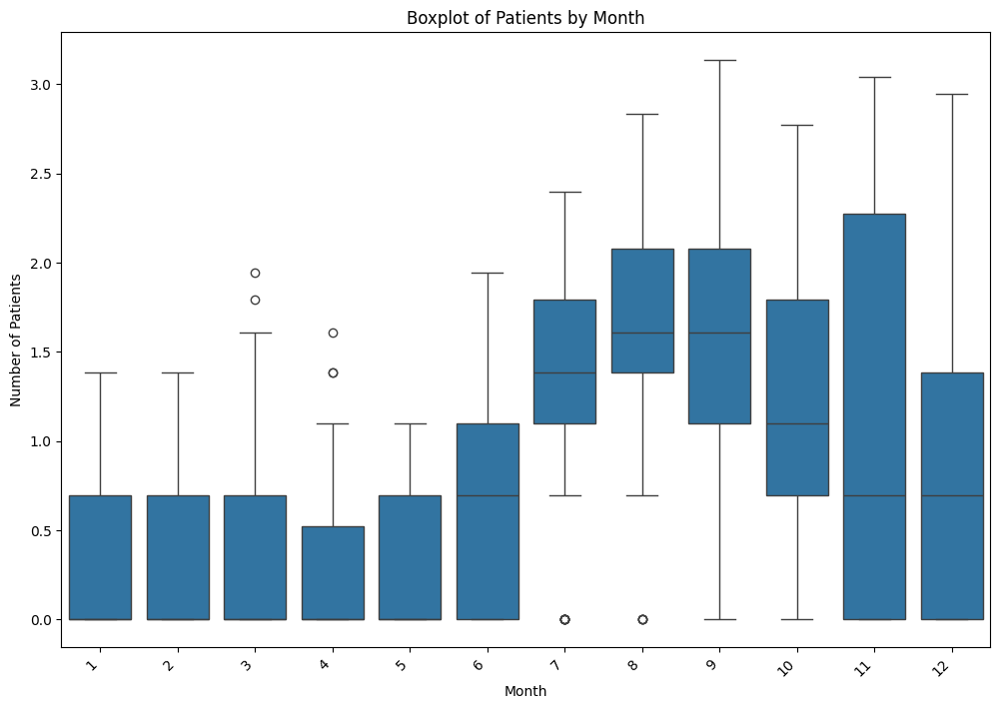

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='Month', y='Patients', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Boxplot of Patients by Month")
plt.xlabel("Month")
plt.ylabel("Number of Patients")

Text(0.5, 1.0, 'Violin Plot of Patients by Month')

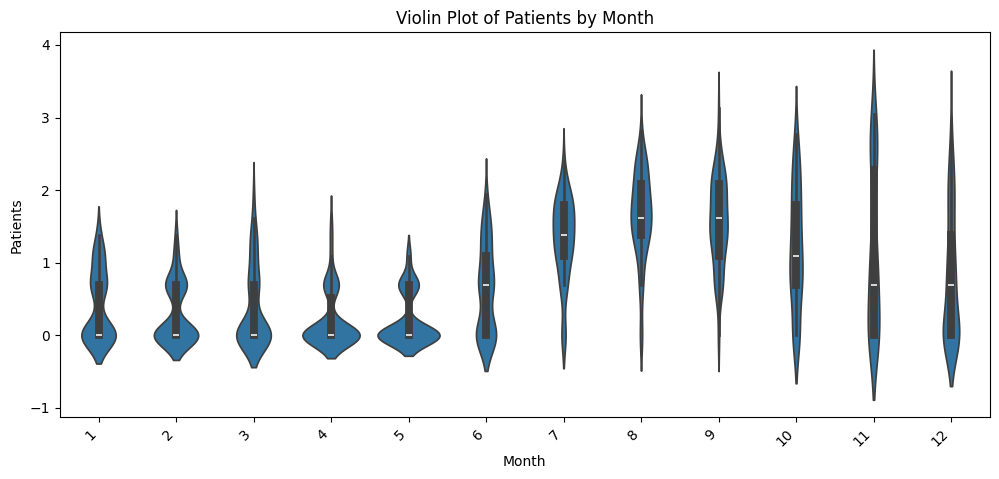

In [ ]:
plt.figure(figsize=(12, 5))
sns.violinplot(x='Month', y='Patients', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Violin Plot of Patients by Month")

การกระจายของจำนวนผู้ป่วยแต่ละเดือน (Distribution per Month)




* ช่วงเดือนต้นปี (ม.ค. - มิ.ย.) จากทั้ง Boxplot และ Violin Plot จะเห็นว่าจำนวนผู้ป่วยส่วนใหญ่มีค่า ต่ำ หรือ ใกล้ศูนย์

    * ใน Boxplot ค่ามัธยฐาน (เส้นกลางกล่อง) และควอไทล์ที่ 3 (ขอบบนกล่อง) ของเดือน 1-5 มีค่าประมาณ 0.75 หรือ ต่ำกว่า และกล่องสั้น มีค่า Outliers (จุดวงกลม) ซึ่งบ่งชี้ว่ามีบางวันที่จำนวนผู้ป่วยสูงกว่าค่าทั่วไปของเดือนนั้น ๆ อย่างมาก
    * ใน Violin Plot รูปทรงจะแคบและส่วนใหญ่จะกระจุกตัวบริเวณค่าต่ำ ๆ ความแปรปรวน (Variance) ของจำนวนผู้ป่วยในแต่ละวันในช่วงนี้ ไม่สูงมาก และมีผู้ป่วยจำนวนน้อยเป็นส่วนใหญ่เดือน 3 และ 4
* ช่วงเดือนกลางและปลายปี (ก.ค. - ธ.ค.) ตั้งแต่ ก.ค. เป็นต้นไป โดยเฉพาะ ส.ค. - พ.ย.
    * ใน Boxplot กล่องจะยาวขึ้นอย่างเห็นได้ชัด และระยะห่างระหว่างควอไทล์ที่ 1 ถึงควอไทล์ที่ 3 กว้างมาก (เช่น เดือน 8, 9, 11)
    * ใน Violin Plot รูปทรงจะ กว้างขึ้น และ สูงขึ้นมาก

แสดงว่าจำนวนผู้ป่วยในเดือนเหล่านี้มี ความผันผวนสูง (High Volatility) หรือ ความแปรปรวนสูง มีทั้งวันที่จำนวนผู้ป่วยต่ำและวันที่จำนวนผู้ป่วย สูงมาก (ค่าสูงสุดในเดือนเหล่านี้สูงถึงเกือบ 3 ถึง 4 จากแกน Y) แนวโน้มผู้ป่วยตามฤดูกาล (Seasonality) เดือน ก.ค. - ต.ค.ค่ามัธยฐาน (Median) และ ค่าเฉลี่ย ของ patients สูงกว่า ช่วงต้นปีอย่างชัดเจนใน Boxplot ค่ามัธยฐานของเดือน 8 และ 9 สูงสุดที่ประมาณ 1.6 สะท้อนว่ามี ฤดูกาลที่ผู้ป่วยมากขึ้น

##### Rainfall vs Month

Text(0, 0.5, 'Rainfall')

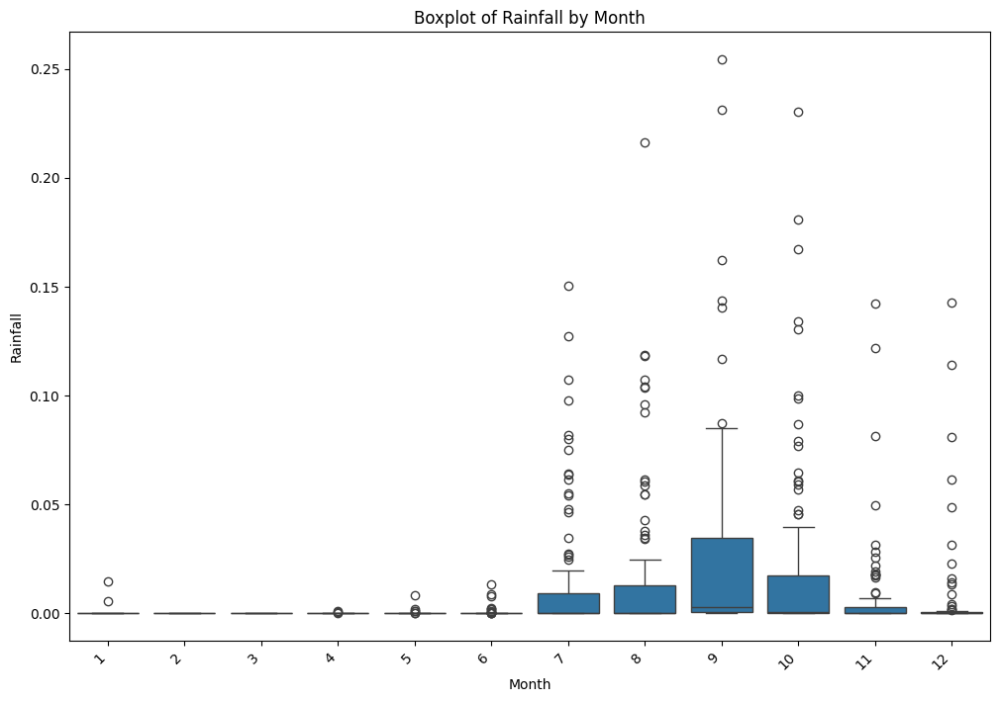

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='Month', y='Rainfall', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Boxplot of Rainfall by Month")
plt.xlabel("Month")
plt.ylabel("Rainfall")

Text(0.5, 1.0, 'Violin Plot of Rainfall by Month')

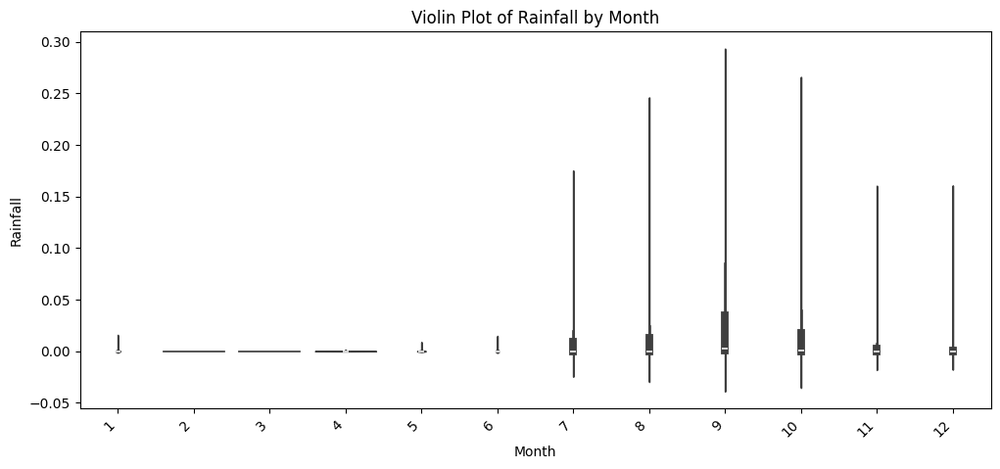

In [ ]:
plt.figure(figsize=(12, 5))
sns.violinplot(x='Month', y='Rainfall', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Violin Plot of Rainfall by Month")



 ช่วงต้นปี (ม.ค. – มิ.ย.)
* ค่า rainfall อยู่ที่ 0 เกือบทั้งหมด การกระจายตัวแคบมาก$\implies$ แสดงว่าเป็น ฤดูแล้ง ที่แทบจะไม่มีฝนตกในแต่ละวัน

 ช่วงฝนตกชุก (ก.ค. – ต.ค.)
* การกระจายของ rainfall กว้างและสูงขึ้นอย่างชัดเจนค่ามัธยฐาน (เส้นกลางกล่อง/ไวโอลิน) สูงกว่าช่วงต้นปีโดยเฉพาะ ก.ย. – ต.ค. มีการกระจายตัวสูงที่สุด (สูงถึงเกือบ $0.30$) และมี outliers จำนวนมาก แสดงว่าเป็น ฤดูฝนหลัก มีทั้งวันที่ฝนตกน้อยและวันที่ ตกหนักมาก

 ช่วงปลายปี (พ.ย. – ธ.ค.)ปริมาณฝน เริ่มลดลงชัดเจน
 * และการกระจายตัวแคบลงค่ามัธยฐานและช่วงควอไทล์ส่วนใหญ่กลับมาใกล้ 0 อีกครั้ง เข้าสู่ช่วง ปลายฝนต้นหนาว ที่ปริมาณน้ำฝนในแต่ละวันลดลงอย่างรวดเร็ว

##### Temperature vs Month

Text(0, 0.5, 'Temperature')

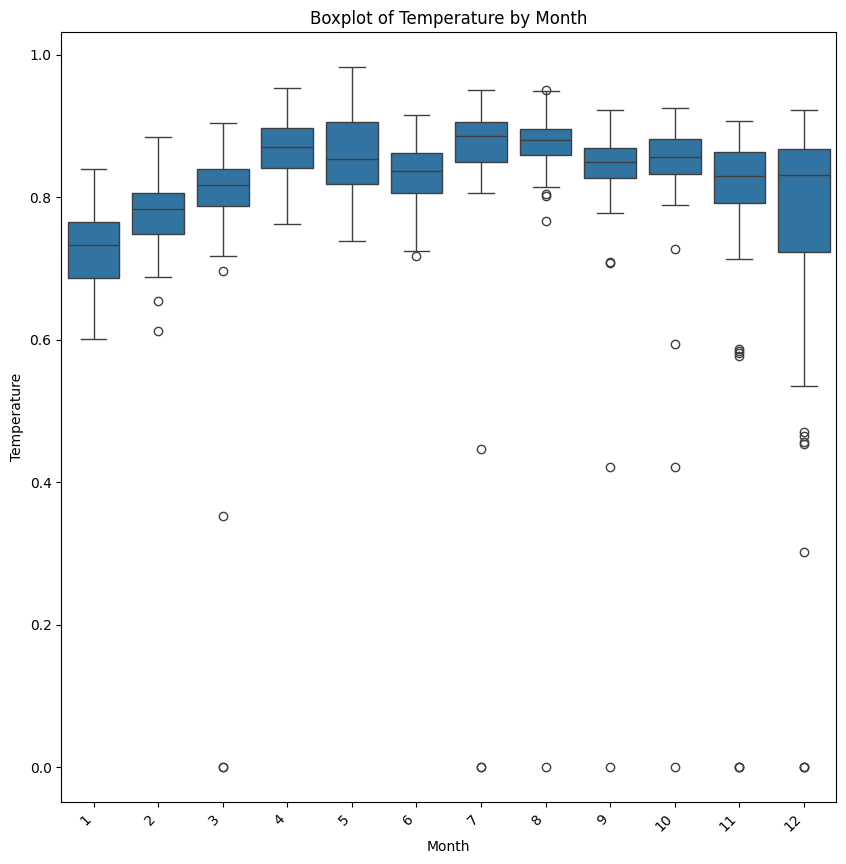

In [ ]:
plt.figure(figsize=(10, 10))
sns.boxplot(x='Month', y='Temperature', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Boxplot of Temperature by Month")
plt.xlabel("Month")
plt.ylabel("Temperature")

Text(0.5, 1.0, 'Violin Plot of Temperature by Month')

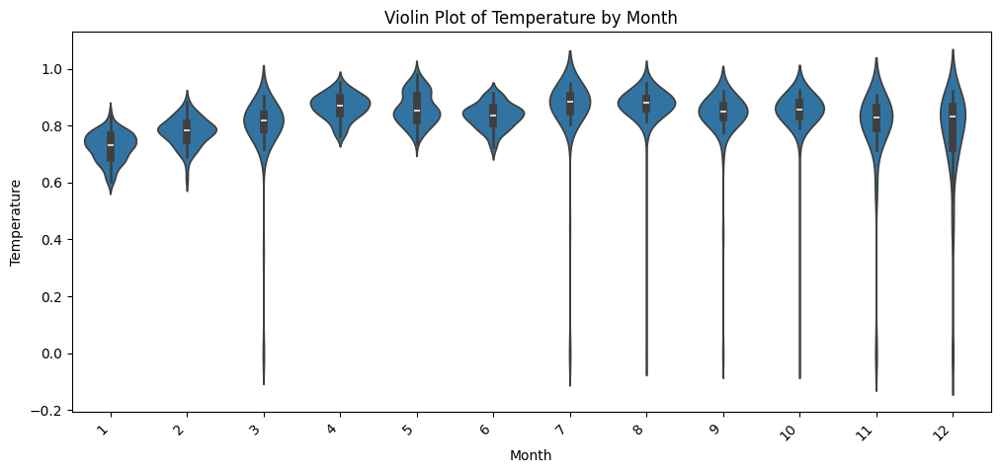

In [ ]:
plt.figure(figsize=(12, 5))
sns.violinplot(x='Month', y='Temperature', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Violin Plot of Temperature by Month")

ช่วงต้นปี (ม.ค. – มี.ค.)
* อุณหภูมิโดยรวม ต่ำที่สุด ของปี โดยเฉพาะเดือน 1 ที่มีค่ามัธยฐานประมาณ 0.7 แสดงถึงช่วง อากาศเย็น หรือช่วงเปลี่ยนผ่านเข้าสู่ความร้อน

ช่วงร้อนที่สุด (เม.ย. – ส.ค.)
* อุณหภูมิ อยู่ในระดับสูงสุด ของปี โดยมีค่ามัธยฐานเกือบ 0.9 หรือสูงกว่าโดยเฉพาะเดือน ส.ค. (8) มีค่ามัธยฐานสูงสุด แสดงถึงช่วง ฤดูร้อน หรืออุณหภูมิสูงสุดของปี

ช่วงปลายปี (ก.ย. – ธ.ค.)
* อุณหภูมิ ทรงตัวอยู่ในระดับสูง จนถึงเดือน 11 ก่อนจะเริ่มลดลงในเดือน 12 เดือน ธ.ค. (12) มีการกระจายตัวกว้างที่สุดและมีค่า outliers ต่ำมาก ที่สุด แสดงถึงช่วง เริ่มเย็นตัวลง และเป็นเดือนที่มีโอกาสเกิดวันที่ อากาศเย็นจัดผิดปกติ ได้มากที่สุด

##### Humidity vs Month

Text(0, 0.5, 'Humidity')

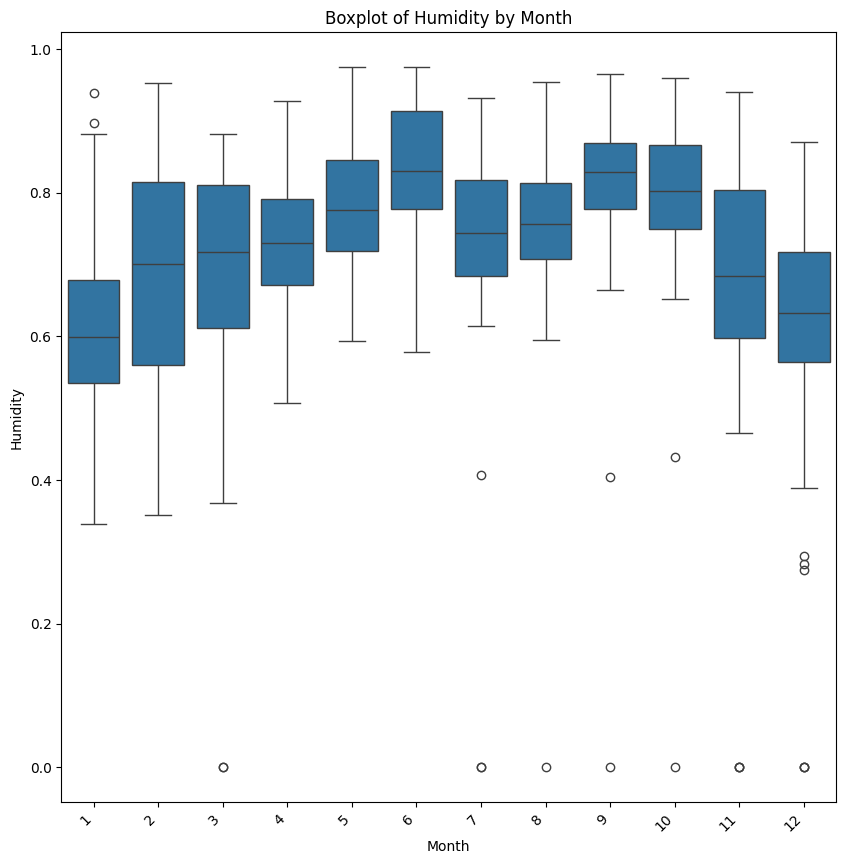

In [ ]:
plt.figure(figsize=(10, 10))
sns.boxplot(x='Month', y='Humidity', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Boxplot of Humidity by Month")
plt.xlabel("Month")
plt.ylabel("Humidity")

Text(0.5, 1.0, 'Violin Plot of Humidity by Month')

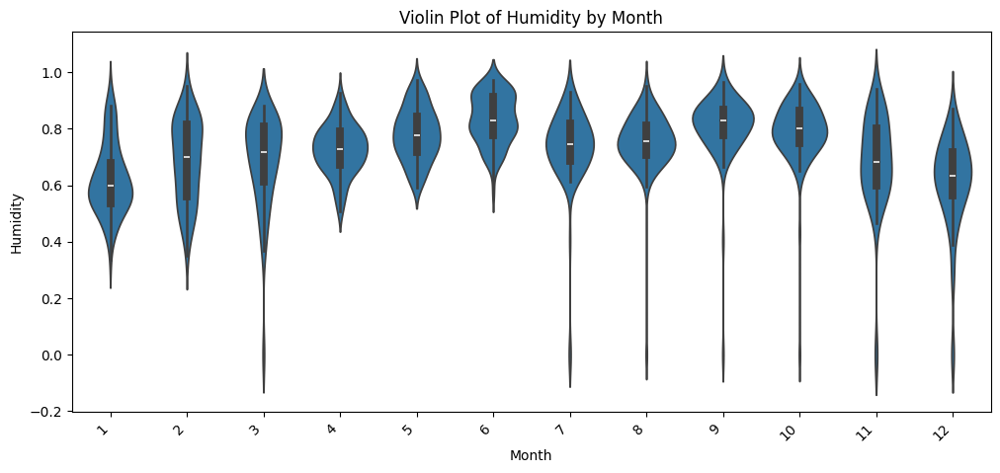

In [ ]:
plt.figure(figsize=(12, 5))
sns.violinplot(x='Month', y='Humidity', data=df)
plt.xticks(rotation=45, ha='right')
plt.title("Violin Plot of Humidity by Month")

ช่วงความชื้นต่ำที่สุด (ม.ค. - ก.พ.)
* เป็นช่วงที่ ค่ามัธยฐานและค่าเฉลี่ยของความชื้นต่ำที่สุด ของปีใน Boxplot เดือน 1 มีค่ามัธยฐานอยู่ที่ประมาณ 0.6 และช่วงการกระจายตัวต่ำกว่าเดือนอื่นอย่างชัดเจน สอดคล้องกับช่วง ฤดูแล้ง หรืออากาศเย็น/แห้ง

ช่วงความชื้นสูงสุด (มิ.ย. - ต.ค.)
* เป็นช่วงที่ ความชื้นอยู่ในระดับสูงสุดและคงที่ที่สุด ของปีเดือน มิ.ย. (6) มีค่ามัธยฐานสูงสุด (เกือบ 0.9)การกระจายตัว (รูปร่างของ Violin Plot และความยาวของกล่อง) ค่อนข้างแคบและกระจุกตัวที่ค่าสูง (ประมาณ 0.7 ถึง 0.9) สอดคล้องกับช่วง ฤดูฝนหลัก ซึ่งมีความชื้นในอากาศสูง

ช่วงเปลี่ยนผ่าน (มี.ค. - พ.ค.)
* ความชื้น เริ่มเพิ่มขึ้น อย่างต่อเนื่องจากเดือนต่ำสุด (ม.ค.) ไปสู่เดือนสูงสุด (มิ.ย.)

ช่วงปลายปี (พ.ย. - ธ.ค.)
* ความชื้น เริ่มลดลงชัดเจน ตั้งแต่เดือน 11 และ 12 เดือน 12 ใน Boxplot มีค่า outliers (จุดวงกลม) ที่ ต่ำมาก ($\approx$ 0) แสดงถึงการเข้าสู่ช่วง ปลายฝนต้นหนาว ที่มีความแห้งแล้งกลับมาอีกครั้ง

### Multivariate Analysis

In [ ]:
import pandas as pd
pd.set_option('display.max_rows', None)   # แสดงทุกแถว
pd.set_option('display.max_columns', None)  # (ถ้าเป็น DataFrame)

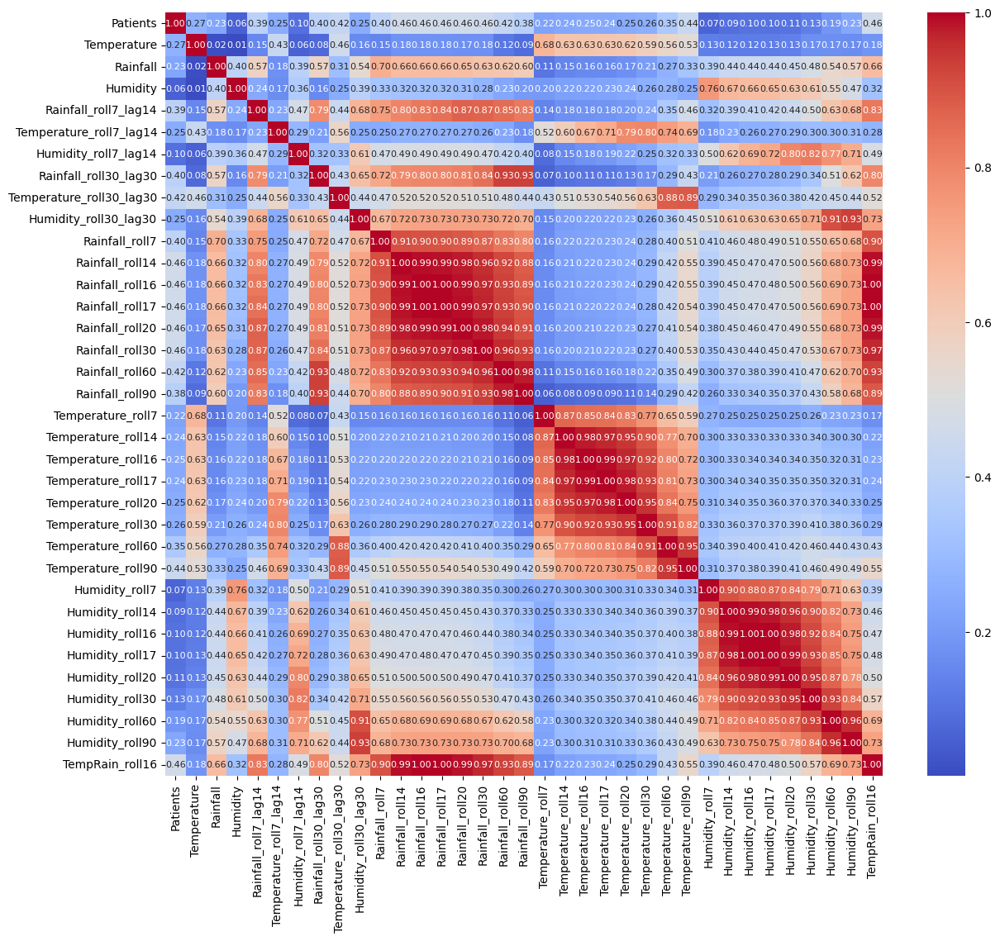

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients"].sort_values(ascending=False))

Patients                    1.000000
TempRain_roll16             0.463742
Rainfall_roll16             0.461740
Rainfall_roll14             0.461615
Rainfall_roll17             0.460908
Rainfall_roll20             0.460724
Rainfall_roll30             0.455009
Temperature_roll90          0.441300
Rainfall_roll60             0.422358
Temperature_roll30_lag30    0.421628
Rainfall_roll7              0.404186
Rainfall_roll30_lag30       0.395360
Rainfall_roll7_lag14        0.394324
Rainfall_roll90             0.380603
Temperature_roll60          0.352957
Temperature                 0.269232
Temperature_roll30          0.258595
Temperature_roll7_lag14     0.252057
Temperature_roll20          0.251214
Humidity_roll30_lag30       0.249380
Temperature_roll16          0.245245
Temperature_roll17          0.244083
Temperature_roll14          0.237355
Humidity_roll90             0.233966
Rainfall                    0.232268
Temperature_roll7           0.224078
Humidity_roll60             0.188039
H

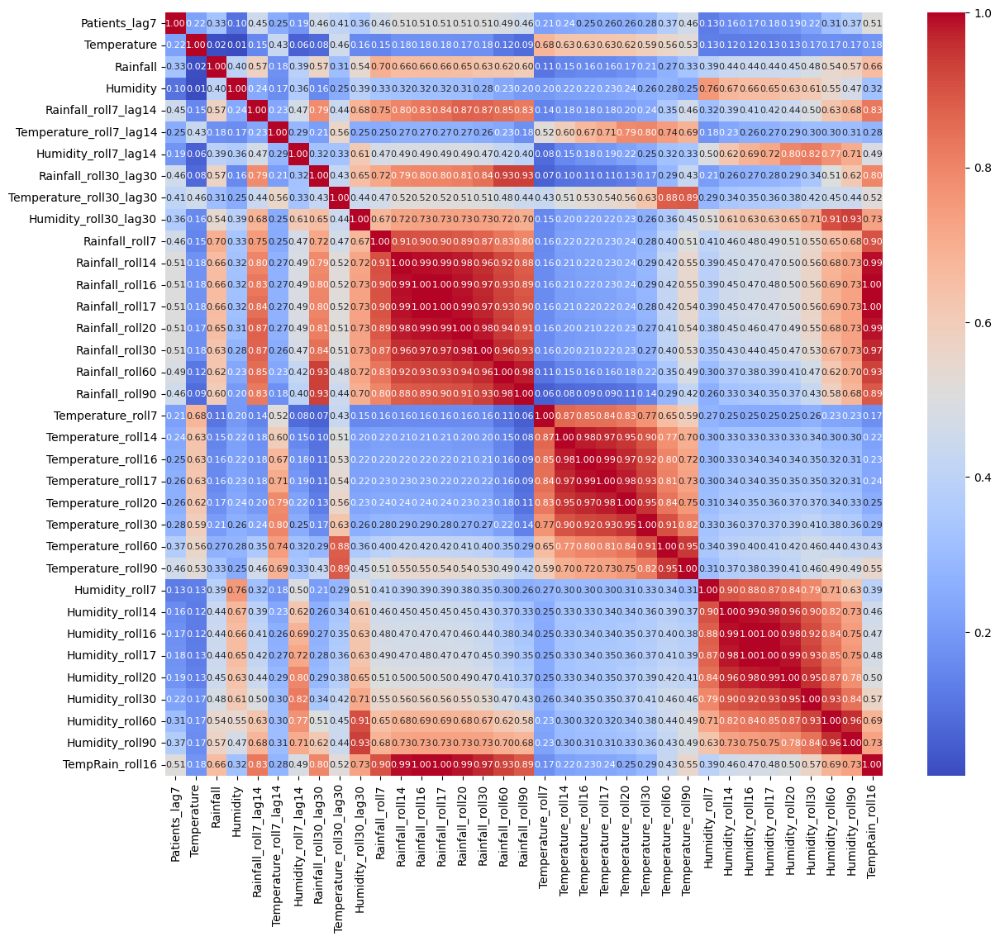

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_lag7', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_lag7"].sort_values(ascending=False))

Patients_lag7               1.000000
TempRain_roll16             0.511802
Rainfall_roll17             0.510846
Rainfall_roll20             0.510493
Rainfall_roll16             0.509459
Rainfall_roll30             0.509342
Rainfall_roll14             0.507471
Rainfall_roll60             0.485759
Rainfall_roll7              0.462896
Temperature_roll90          0.461730
Rainfall_roll30_lag30       0.459480
Rainfall_roll90             0.457149
Rainfall_roll7_lag14        0.452410
Temperature_roll30_lag30    0.410188
Temperature_roll60          0.373569
Humidity_roll90             0.372343
Humidity_roll30_lag30       0.362748
Rainfall                    0.328857
Humidity_roll60             0.310121
Temperature_roll30          0.283120
Temperature_roll20          0.260663
Temperature_roll17          0.258559
Temperature_roll7_lag14     0.252043
Temperature_roll16          0.251124
Temperature_roll14          0.240291
Humidity_roll30             0.222720
Temperature                 0.219509
T

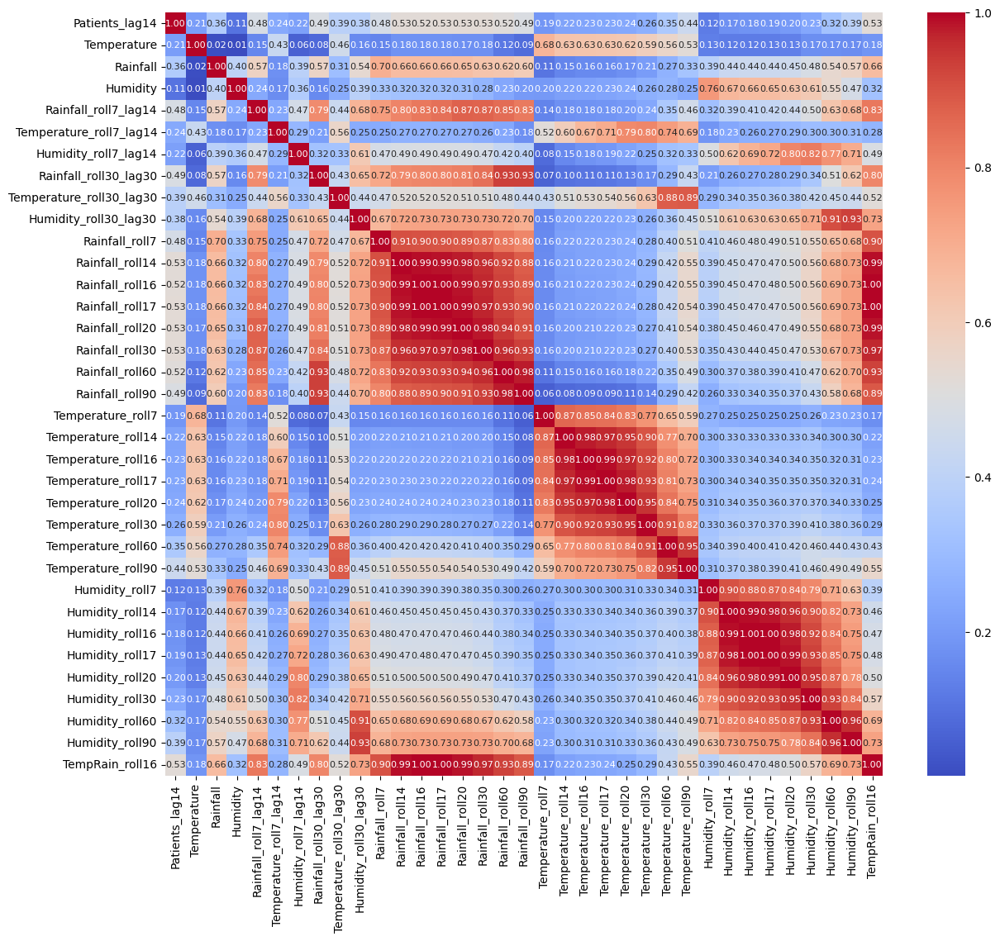

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_lag14', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_lag14"].sort_values(ascending=False))

Patients_lag14              1.000000
Rainfall_roll30             0.530001
Rainfall_roll20             0.529881
Rainfall_roll17             0.527507
TempRain_roll16             0.526400
Rainfall_roll14             0.525431
Rainfall_roll16             0.524294
Rainfall_roll60             0.516503
Rainfall_roll90             0.493317
Rainfall_roll30_lag30       0.491097
Rainfall_roll7_lag14        0.481457
Rainfall_roll7              0.475938
Temperature_roll90          0.443563
Humidity_roll90             0.390695
Temperature_roll30_lag30    0.390570
Humidity_roll30_lag30       0.384177
Rainfall                    0.362724
Temperature_roll60          0.351931
Humidity_roll60             0.324312
Temperature_roll30          0.261694
Temperature_roll7_lag14     0.242569
Temperature_roll20          0.240992
Humidity_roll30             0.234683
Temperature_roll17          0.233109
Temperature_roll16          0.229291
Temperature_roll14          0.224821
Humidity_roll7_lag14        0.217189
T

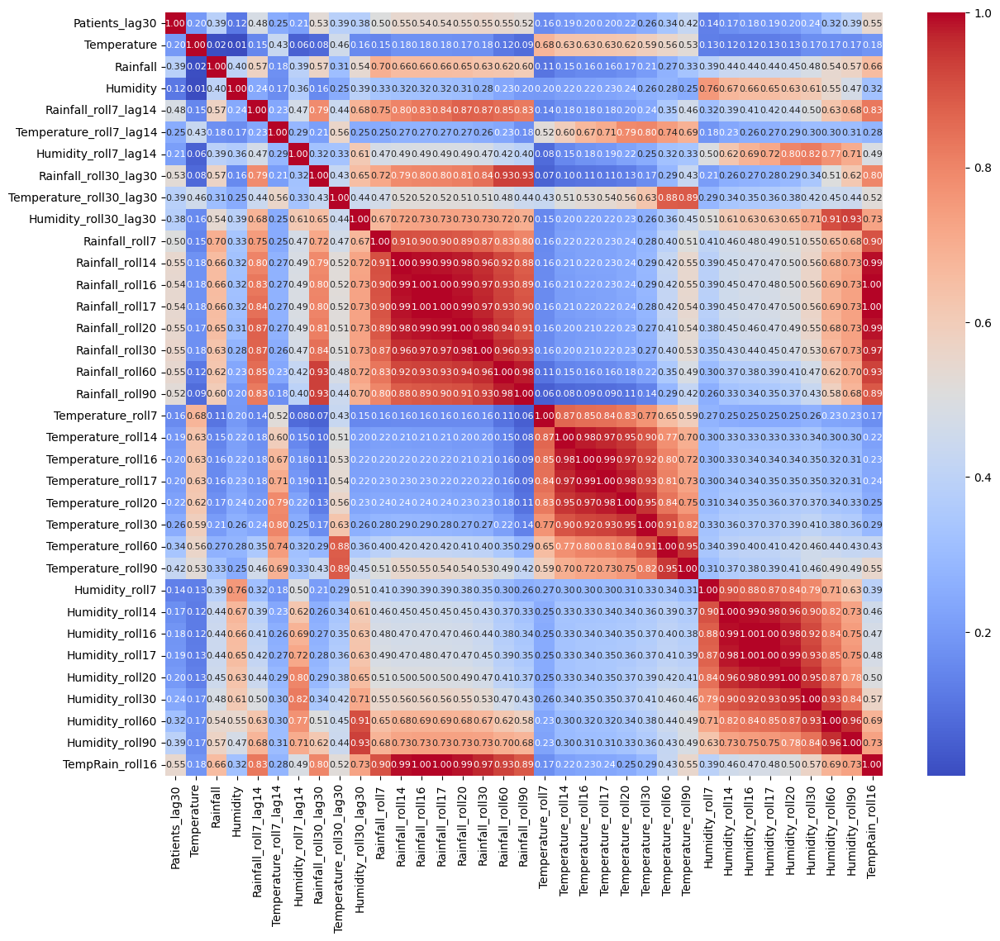

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_lag30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_lag30"].sort_values(ascending=False))

Patients_lag30              1.000000
Rainfall_roll30             0.554843
Rainfall_roll20             0.547251
Rainfall_roll14             0.547018
TempRain_roll16             0.546146
Rainfall_roll60             0.545411
Rainfall_roll17             0.544371
Rainfall_roll16             0.543933
Rainfall_roll30_lag30       0.527282
Rainfall_roll90             0.524509
Rainfall_roll7              0.503909
Rainfall_roll7_lag14        0.483784
Temperature_roll90          0.424814
Humidity_roll90             0.392615
Temperature_roll30_lag30    0.386448
Rainfall                    0.386061
Humidity_roll30_lag30       0.377863
Temperature_roll60          0.335670
Humidity_roll60             0.321396
Temperature_roll30          0.255563
Temperature_roll7_lag14     0.251924
Humidity_roll30             0.238542
Temperature_roll20          0.220237
Humidity_roll7_lag14        0.211577
Temperature_roll17          0.204484
Temperature_roll16          0.203090
Humidity_roll20             0.199338
T

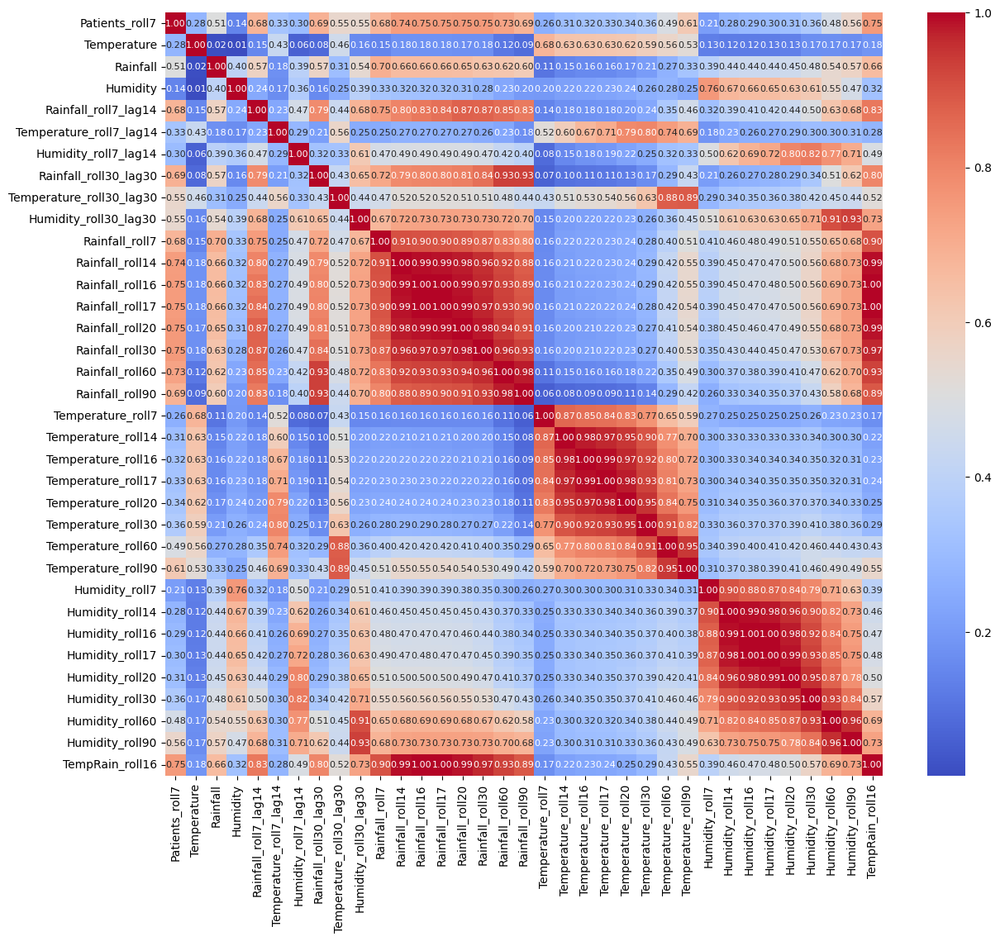

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_roll7', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_roll7"].sort_values(ascending=False))

Patients_roll7              1.000000
Rainfall_roll20             0.751680
Rainfall_roll30             0.751462
TempRain_roll16             0.751331
Rainfall_roll17             0.749116
Rainfall_roll16             0.748682
Rainfall_roll14             0.743498
Rainfall_roll60             0.729938
Rainfall_roll30_lag30       0.691590
Rainfall_roll90             0.686866
Rainfall_roll7_lag14        0.682116
Rainfall_roll7              0.679079
Temperature_roll90          0.614877
Humidity_roll90             0.556595
Temperature_roll30_lag30    0.550533
Humidity_roll30_lag30       0.548022
Rainfall                    0.506255
Temperature_roll60          0.489404
Humidity_roll60             0.476128
Temperature_roll30          0.362742
Humidity_roll30             0.355741
Temperature_roll20          0.338399
Temperature_roll7_lag14     0.333102
Temperature_roll17          0.326528
Temperature_roll16          0.322394
Humidity_roll20             0.312101
Temperature_roll14          0.307275
H

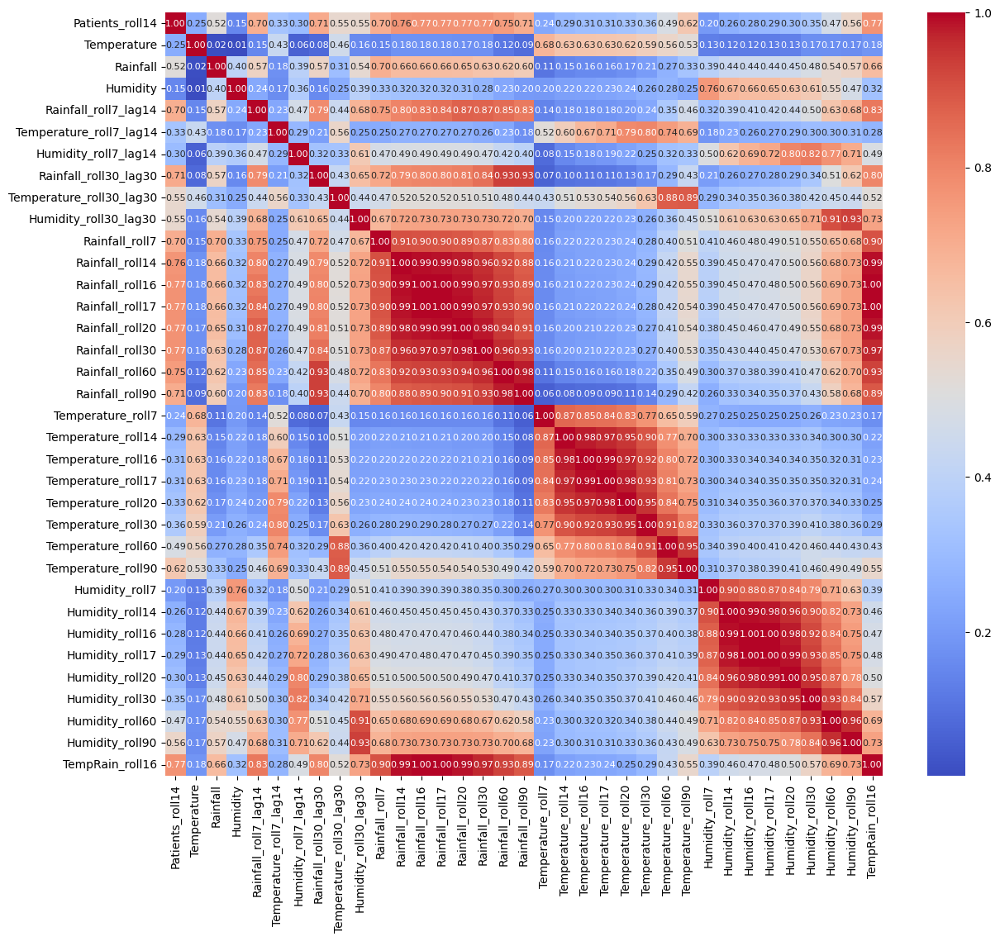

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_roll14', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_roll14"].sort_values(ascending=False))

Patients_roll14             1.000000
TempRain_roll16             0.772580
Rainfall_roll20             0.771818
Rainfall_roll30             0.771176
Rainfall_roll17             0.770277
Rainfall_roll16             0.769805
Rainfall_roll14             0.764490
Rainfall_roll60             0.748831
Rainfall_roll30_lag30       0.707473
Rainfall_roll90             0.706843
Rainfall_roll7              0.703222
Rainfall_roll7_lag14        0.699187
Temperature_roll90          0.619998
Humidity_roll90             0.558306
Humidity_roll30_lag30       0.548163
Temperature_roll30_lag30    0.547049
Rainfall                    0.516499
Temperature_roll60          0.487359
Humidity_roll60             0.471415
Temperature_roll30          0.357430
Humidity_roll30             0.345227
Temperature_roll7_lag14     0.331698
Temperature_roll20          0.329784
Temperature_roll17          0.313681
Temperature_roll16          0.307688
Humidity_roll20             0.304290
Humidity_roll7_lag14        0.301577
T

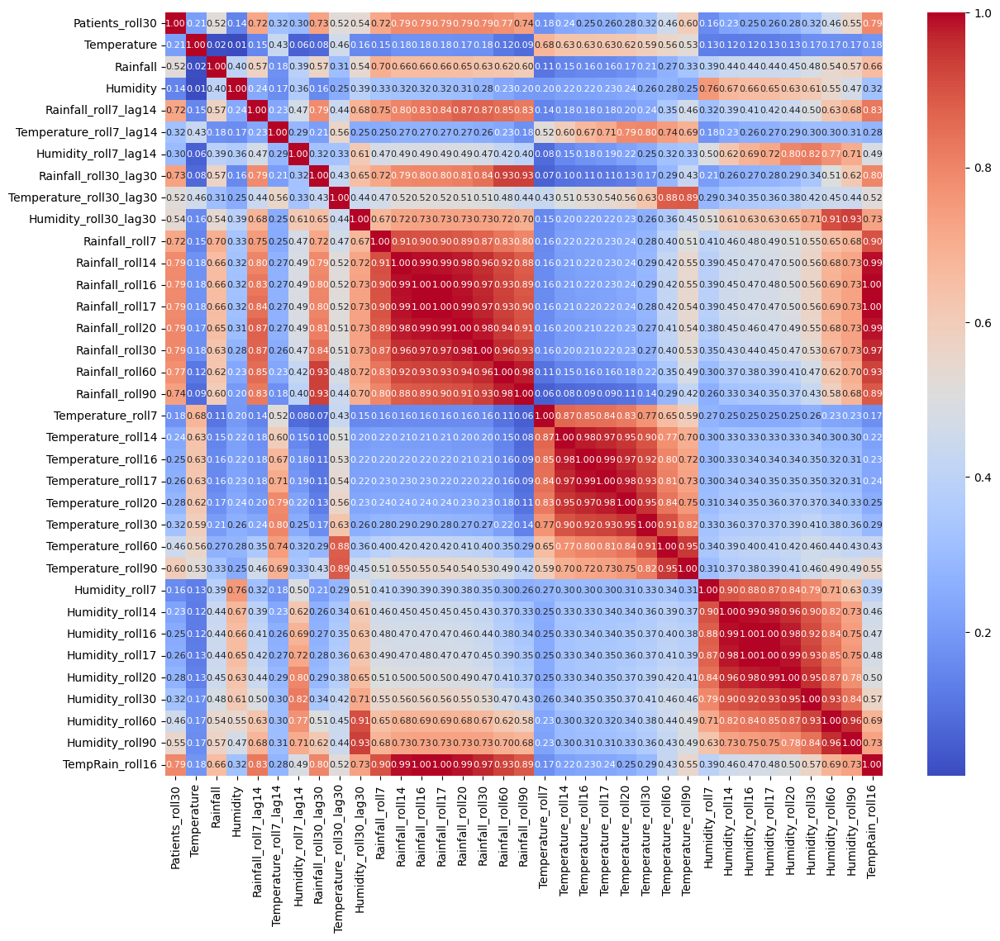

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'Rainfall_roll7',
       'Rainfall_roll14', 'Rainfall_roll16', 'Rainfall_roll17',
       'Rainfall_roll20', 'Rainfall_roll30', 'Rainfall_roll60',
       'Rainfall_roll90', 'Temperature_roll7', 'Temperature_roll14',
       'Temperature_roll16', 'Temperature_roll17', 'Temperature_roll20',
       'Temperature_roll30', 'Temperature_roll60', 'Temperature_roll90',
       'Humidity_roll7', 'Humidity_roll14', 'Humidity_roll16',
       'Humidity_roll17', 'Humidity_roll20', 'Humidity_roll30',
       'Humidity_roll60', 'Humidity_roll90', 'TempRain_roll16'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":8})
plt.show()

In [ ]:
print(corr["Patients_roll30"].sort_values(ascending=False))

Patients_roll30             1.000000
Rainfall_roll20             0.793291
Rainfall_roll30             0.793097
TempRain_roll16             0.792664
Rainfall_roll17             0.791154
Rainfall_roll16             0.790399
Rainfall_roll14             0.787104
Rainfall_roll60             0.773433
Rainfall_roll90             0.737488
Rainfall_roll30_lag30       0.733107
Rainfall_roll7_lag14        0.719807
Rainfall_roll7              0.718189
Temperature_roll90          0.602334
Humidity_roll90             0.549549
Humidity_roll30_lag30       0.536088
Rainfall                    0.522193
Temperature_roll30_lag30    0.520571
Temperature_roll60          0.455529
Humidity_roll60             0.455116
Temperature_roll30          0.322714
Humidity_roll30             0.322357
Temperature_roll7_lag14     0.321978
Humidity_roll7_lag14        0.298315
Temperature_roll20          0.280882
Humidity_roll20             0.275910
Temperature_roll17          0.261642
Humidity_roll17             0.256044
T

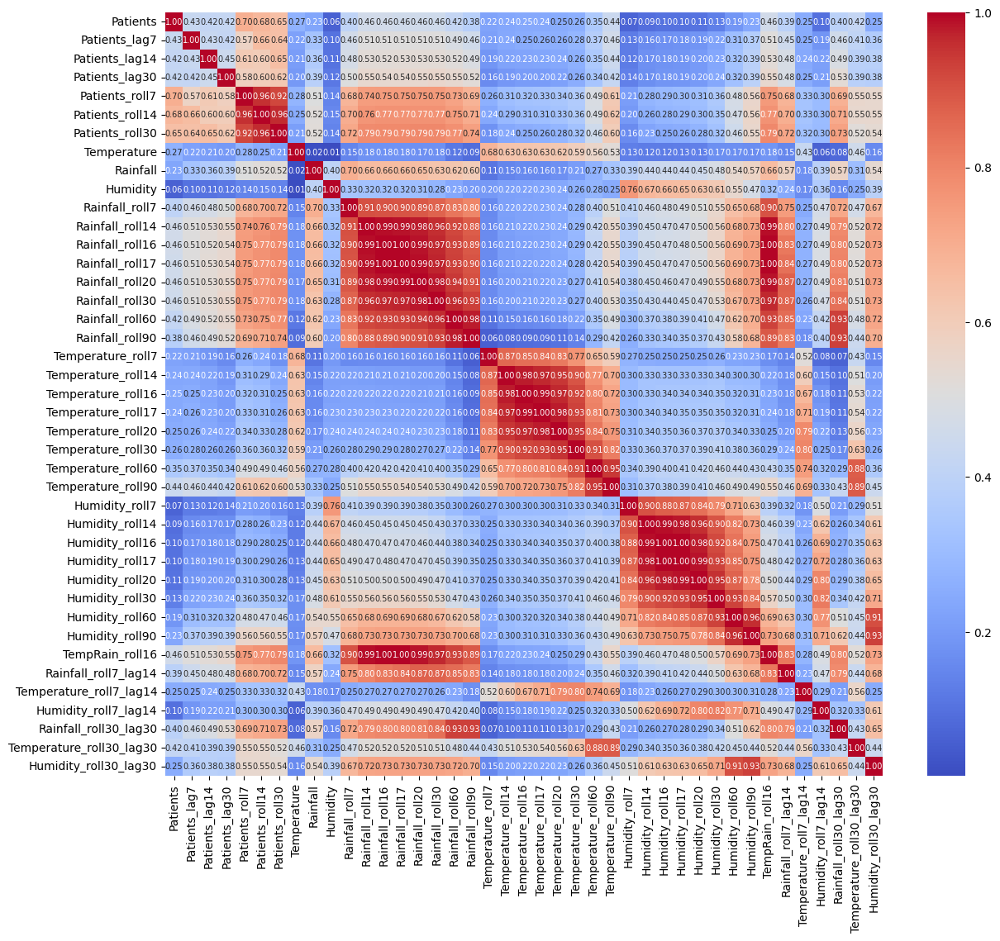

In [ ]:
plt.figure(figsize=(14, 12))
corr = df[['Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30'
           ]].corr(method="spearman")

sns.heatmap(corr,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            cbar=True,
            annot_kws={"size":7})
plt.show()

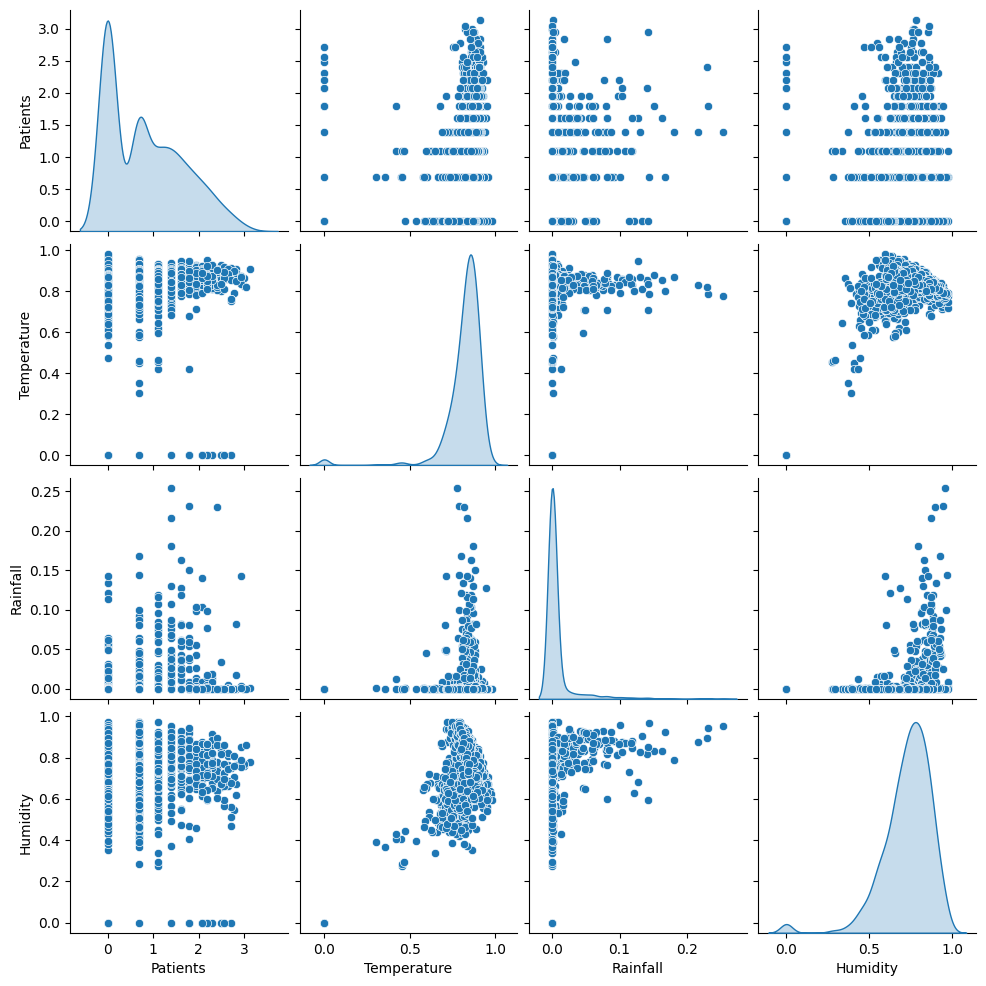

In [ ]:
sns.pairplot(df[['Patients', 'Temperature', 'Rainfall', 'Humidity' ]], diag_kind='kde')
plt.show()

| กลุ่มตัวแปร                  | ระดับอิทธิพลต่อผู้ป่วย | แนวโน้ม                                                 |
| ---------------------------- | ---------------------- | ------------------------------------------------------- |
| ฝน (Rainfall)             | สูง                    | มีผลชัด โดยเฉพาะค่า rolling 14–30 วัน                   |
| อุณหภูมิ (Temperature)    | ปานกลาง                | ส่งผลแบบคงที่ระยะยาว                                    |
| ความชื้น (Humidity)       | ต่ำ                    | ไม่เด่นชัดเมื่อพิจารณาเดี่ยว ๆ                          |

* จำนวนผู้ป่วยไข้เลือดออกมีแนวโน้มเพิ่มขึ้นตามปริมาณฝนสะสมในช่วง 2–4 สัปดาห์ก่อนหน้า โดยเฉพาะเมื่ออุณหภูมิอยู่ในช่วงเหมาะสม (อบอุ่น–ร้อน)
* ความชื้นไม่ใช่ตัวขับหลัก แต่ช่วยรักษาสภาพแวดล้อมให้ยุงเพาะพันธุ์ต่อเนื่อง

### Pattern & Trend Detection

#### Time Series Analysis

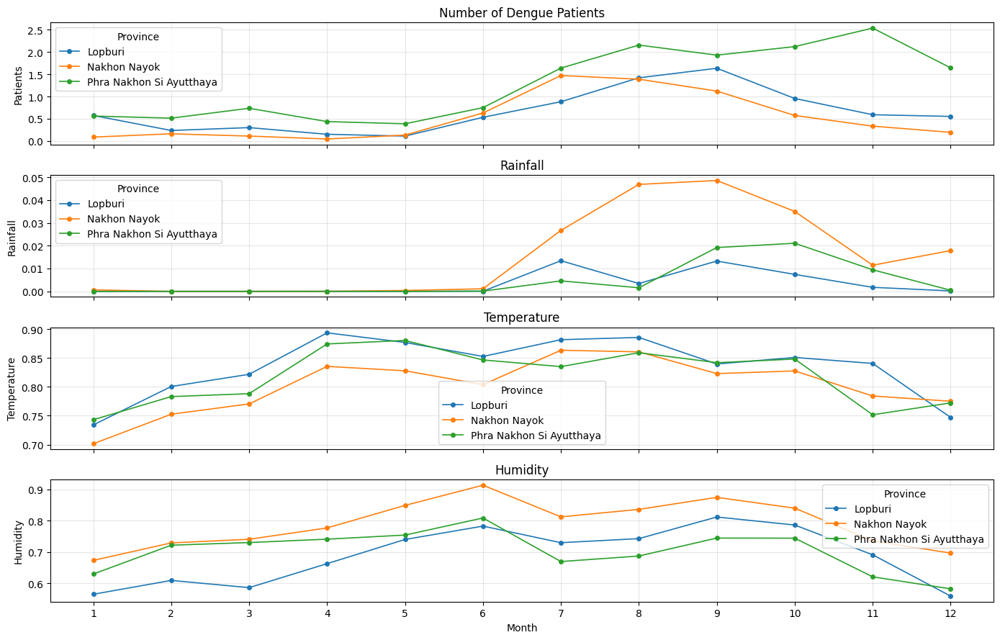

In [ ]:
# dict จังหวัด → lat, lon (จำเป็นต้องใช้ในการแยก province)
province_coords = {
    "Nakhon Nayok": (14.2061, 101.2130),
    "Phra Nakhon Si Ayutthaya": (14.3532, 100.5689),
    "Lopburi": (14.7995, 100.6534),
}

# สร้างคอลัมน์ Province ตาม lat/lon อีกครั้งเพื่อใช้ในการ Group by
def get_province(lat, lon):
    for province, (p_lat, p_lon) in province_coords.items():
        if lat == p_lat and lon == p_lon:
            return province
    return "Other"

df['Province'] = df.apply(lambda row: get_province(row['lat'], row['lon']), axis=1)
df['datesick'] = pd.to_datetime(df['datesick'], errors='coerce')
df['Month'] = df['datesick'].dt.month

variables = ['Patients', 'Rainfall', 'Temperature', 'Humidity']
titles = ['Number of Dengue Patients', 'Rainfall', 'Temperature', 'Humidity']

df_group = df.groupby(['Province', 'Month'])[variables].mean().reset_index()

fig, axes = plt.subplots(4, 1, figsize=(14, 9), sharex=True)

for ax, var, title in zip(axes, variables, titles):
    for province, data in df_group.groupby('Province'):
        ax.plot(data['Month'], data[var],
                marker='o', markersize=4, linewidth=1.2,
                label=province)
    ax.set_title(title)
    ax.set_ylabel(var)
    ax.grid(True, alpha=0.3)
    ax.legend(title='Province')

axes[-1].set_xlabel('Month')
axes[-1].set_xticks(range(1, 13))

plt.tight_layout()
plt.show()

* **Patient vs Month** - จากกราฟ จะเห็น Pattern ที่ชัดเจนที่สุดในเส้นสีเขียว (พระนครศรีอยุธยา) โดยจำนวนผู้ป่วยจะอยู่ในระดับต่ำในช่วงต้นปี และเริ่มพุ่งสูงขึ้นเป็นช่วงๆ อย่างชัดเจนในเดือน 7, 8 และ 10 ซึ่งสอดคล้องกับช่วงกลางปีและปลายฤดูฝน

* **Rainfall vs Month** - มี Pattern ตามฤดูกาลที่ชัดเจน โดยปริมาณน้ำฝนจะน้อยมากในช่วง 6 เดือนแรกของปี (มกราคม-มิถุนายน) และมีปริมาณฝนที่พุ่งสูงขึ้นเป็นครั้งคราวอย่างชัดเจนในช่วงครึ่งหลังของปี (เช่น เดือน 7, 8 และ 10)

* **Temperature vs Month** - อุณหภูมิมีแนวโน้มค่อนข้างคงที่ในระดับสูงเกือบตลอดทั้งปี โดยจะไต่ระดับสูงสุดในช่วงเดือน 4-5 และจะเห็นการลดลงอย่างชัดเจนในเดือน 12 (ธันวาคม) ซึ่งเป็นช่วงปลายปี

* **Humidity vs Month** - มี Pattern ตามฤดูกาลที่ชัดเจนมาก โดยความชื้นจะอยู่ในระดับต่ำในช่วง 3 เดือนแรก จากนั้นจะเพิ่มสูงขึ้นอย่างรวดเร็วและคงที่ในระดับสูงตลอดช่วงเดือน 5 ถึง 10 ก่อนที่จะลดต่ำลงอีกครั้งในช่วงปลายปี (เดือน 11-12)

## สรุป Insight จากการสำรวจข้อมูล

จากกระบวนการสำรวจข้อมูล (EDA) และการวิเคราะห์เบื้องต้น ได้ข้อสรุป Insight ที่สำคัญดังนี้:

1.  **แนวโน้มผู้ป่วยไข้เลือดออกตามฤดูกาล:**
    *   จำนวนผู้ป่วยไข้เลือดออกในพื้นที่ศึกษา (นครนายก, พระนครศรีอยุธยา, ลพบุรี) ในปี 2566 มีรูปแบบตามฤดูกาลที่ชัดเจน
    *   จำนวนผู้ป่วยเริ่มเพิ่มขึ้นในช่วงกลางปี (ประมาณเดือนมิถุนายน) และพุ่งสูงที่สุดในช่วงเดือนกรกฎาคมถึงตุลาคม ซึ่งเป็นช่วงฤดูฝนในประเทศไทย ก่อนจะลดลงในช่วงปลายปี
    *   จังหวัดพระนครศรีอยุธยา (เส้นสีเขียวในกราฟ Time Series) แสดงรูปแบบการระบาดที่ชัดเจนที่สุด โดยมีช่วงพีคในเดือนกรกฎาคม, สิงหาคม, และตุลาคม

2.  **ความสัมพันธ์ระหว่างปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วย:**
    *   ปัจจัยสิ่งแวดล้อมมีความสัมพันธ์กับจำนวนผู้ป่วยไข้เลือดออก โดยเฉพาะค่าที่คำนวณแบบ Lag และ Rolling Average ซึ่งบ่งชี้ว่าสภาพอากาศในอดีตมีผลกระทบสะสมต่อการระบาด
    *   **ปริมาณฝน (Rainfall):** มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วย โดยเฉพาะค่าเฉลี่ยปริมาณฝนสะสมในช่วง 2-4 สัปดาห์ก่อนหน้า (Rainfall\_roll14 ถึง Rainfall\_roll30) และค่า Rolling Average ที่มีการ Lag (Rainfall\_roll7\_lag14 และ Rainfall\_roll30\_lag30) แสดงว่าฝนเป็นปัจจัยสำคัญที่ส่งผลต่อการเพิ่มขึ้นของผู้ป่วย
    *   **อุณหภูมิ (Temperature):** มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วยเช่นกัน แต่เด่นชัดในค่าเฉลี่ยระยะยาว (Temperature\_roll60, Temperature\_roll90) และค่า Lag (Temperature\_roll30\_lag30) ซึ่งอาจหมายถึงแนวโน้มอุณหภูมิที่คงที่ในระยะยาวมีผลต่อการเพาะพันธุ์ยุง
    *   **ความชื้น (Humidity):** เมื่อพิจารณาเดี่ยวๆ ความชื้นมีความสัมพันธ์กับจำนวนผู้ป่วยค่อนข้างต่ำในระยะสั้น แต่เริ่มเห็นความสัมพันธ์เชิงบวกในค่าเฉลี่ยระยะยาว (Humidity\_roll60, Humidity\_roll90) และค่า Lag (Humidity\_roll30\_lag30) แสดงว่าความชื้นที่คงที่ในระยะยาวอาจมีส่วนสนับสนุนการระบาด
    *   **ปัจจัยผสม (TempRain\_roll16):** ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วยค่อนข้างสูง บ่งชี้ว่าสภาพอากาศที่มีทั้งฝนตกและอุณหภูมิที่เหมาะสมเป็นช่วงเวลาที่เสี่ยงต่อการระบาด

3.  **คุณภาพข้อมูล:**
    *   ข้อมูลผู้ป่วย: มี Missing Values ในบางคอลัมน์ (occupation, germ, complications, district) และ Duplicate Rows ซึ่งได้ดำเนินการแก้ไขแล้ว Outliers ในคอลัมน์อายุถูกพิจารณาแล้วว่าเป็นค่าที่เป็นไปได้จึงคงไว้
    *   ข้อมูลสภาพอากาศ: มีคอลัมน์ว่าง (Unnamed: 10) ซึ่งได้ลบออกแล้ว ไม่พบ Duplicate Rows Outliers ในข้อมูลสภาพอากาศถูกพิจารณาแล้วว่าไม่ใช่ความผิดพลาดและคงไว้

4.  **การกระจายตัวของข้อมูล:**
    *   ข้อมูลจำนวนผู้ป่วย ปริมาณฝน และค่า Rolling Average/Lag ของปริมาณฝน มีการกระจายตัวแบบเบ้ขวา (Skewed Right) ซึ่งสะท้อนว่าส่วนใหญ่มักมีค่าต่ำ แต่มีบางวันที่/ช่วงเวลาที่มีค่าสูงมาก (เช่น ช่วงระบาด)
    *   ข้อมูลอุณหภูมิและความชื้น (โดยเฉพาะค่า Rolling Average/Lag) มีการกระจายตัวใกล้เคียง Normal Distribution มากกว่า


## **Summary project progress**

โครงการนี้มีเป้าหมายเพื่อคาดการณ์จำนวนผู้ป่วยไข้เลือดออกในประเทศไทยจากข้อมูลสิ่งแวดล้อม โดยได้ดำเนินการตามขั้นตอนดังนี้

**การรวบรวมข้อมูล (Data Acquisition):**
*   รวบรวมข้อมูลหลัก 2 ชุด ได้แก่
    *   ข้อมูลผู้ป่วยไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566 จากกรมควบคุมโรค ครอบคลุม 8 จังหวัด
    *   ข้อมูลสภาพอากาศรายวันปี 2566 (อุณหภูมิ, ฝน, ความชื้น, ความกด, ความเร็วลม, ลมกระโชก) จากสถานีตรวจวัดโทรมาตรใน 3 จังหวัด (นครนายก, พระนครศรีอยุธยา, ลพบุรี) ที่อยู่ในเขตสุขภาพที่ 4

### **Data Wrangling**
*   ดำเนินการจัดการ Missing Values และ Duplicate Rows ในข้อมูลผู้ป่วยตามที่ได้ตรวจสอบในขั้นตอน EDA
*   ลบคอลัมน์ว่างในข้อมูลสภาพอากาศ
*   แปลงชนิดข้อมูลของคอลัมน์วันที่และคอลัมน์หมวดหมู่ในข้อมูลผู้ป่วยให้เหมาะสม
*   กรองข้อมูลผู้ป่วยให้เหลือเฉพาะจังหวัดที่ข้อมูลสภาพอากาศรองรับ
*   ลบคอลัมน์ที่ไม่จำเป็นออกจากข้อมูลผู้ป่วย
*   แปลงปีพุทธศักราชในข้อมูลสภาพอากาศเป็นปีคริสต์ศักราชและแปลงคอลัมน์เวลาเป็น datetime
*   ปรับขนาด (Scale) คอลัมน์อุณหภูมิ ปริมาณฝน และความชื้นในข้อมูลสภาพอากาศด้วย MinMaxScaler
*   เปลี่ยนชื่อคอลัมน์สภาพอากาศเป็นภาษาอังกฤษเพื่อให้เข้าใจง่ายขึ้น
*   รวม (Aggregate) ข้อมูลสภาพอากาศรายวันโดยเฉลี่ยตามจังหวัด
*   รวม (Aggregate) ข้อมูลผู้ป่วยรายวันโดยนับจำนวนตามจังหวัดและวันที่ พร้อมเติมค่า 0 ในวันที่ไม่มีผู้ป่วย
*   สร้าง Feature ใหม่จากข้อมูลสภาพอากาศโดยคำนวณค่า Lag และ Rolling Average ในช่วงเวลาต่างๆ ที่สัมพันธ์กับวงจรชีวิตยุงและระยะฟักตัวของโรค
*   รวมตารางข้อมูลผู้ป่วยที่นับจำนวนแล้วกับข้อมูลสภาพอากาศที่สร้าง Feature ใหม่เข้าด้วยกัน โดยใช้จังหวัดและวันที่เป็นคีย์หลัก
*   เพิ่มคอลัมน์ละติจูดและลองจิจูดตามจังหวัดให้กับ DataFrame ที่รวมแล้ว
*   ลบคอลัมน์ 'province' ที่ไม่จำเป็นหลังจากรวมข้อมูล
*   ทำการ Log Transformation กับคอลัมน์ 'Patients' เพื่อลดความเบ้ของข้อมูล
*   ตรวจสอบ Missing Values และ Outlier อีกครั้งใน DataFrame ที่ผ่านการ Wrangling แล้ว เพื่อยืนยันความพร้อมของข้อมูล
*   บันทึก DataFrame สุดท้ายที่ผ่านการเตรียมข้อมูลครบถ้วนแล้วลงในไฟล์ CSV ชื่อ `dengue_ready.csv`

### **Explore Data Analysis**
*   **Data Overview:** ตรวจสอบขนาดข้อมูล ชื่อคอลัมน์ จำนวนแถว/คอลัมน์ และดูตัวอย่างข้อมูลของทั้งสองชุด เพื่อทำความเข้าใจโครงสร้างเบื้องต้น
*   **Data Quality Check:**
    *   ตรวจสอบและสรุปจำนวน Missing Values ในข้อมูลผู้ป่วยและสภาพอากาศ รวมถึงระบุคอลัมน์ที่ได้รับผลกระทบ
    *   ตรวจสอบและสรุปจำนวน Duplicate Rows ในข้อมูลผู้ป่วยและสภาพอากาศ
    *   ตรวจสอบและสรุปค่า Outlier ในคอลัมน์ข้อมูลเชิงปริมาณของทั้งสองชุดข้อมูล โดยใช้วิธี IQR และ Z-score พร้อมแสดงตัวอย่างและ Boxplot ประกอบ
*   **Descriptive Statistics:** คำนวณและแสดงค่าสถิติพื้นฐาน (Mean, Median, Mode, Std, Min, Max, Q1, Q3) รวมถึง Skewness และ Kurtosis สำหรับคอลัมน์เชิงปริมาณทั้งหมดใน DataFrame ที่รวมข้อมูลแล้ว พร้อมการตีความเบื้องต้นเกี่ยวกับลักษณะการกระจายตัว
*   **Univariate Analysis:** วิเคราะห์การกระจายตัวของแต่ละคอลัมน์เชิงปริมาณด้วย Histogram และ Boxplot/Violin Plot เพื่อดูรูปร่างการกระจายและค่า Outlier
*   **Bivariate Analysis:** วิเคราะห์ความสัมพันธ์ระหว่างคู่ตัวแปรเชิงปริมาณ โดยเฉพาะปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วย ด้วย Scatter Plot, Regression Plot และ Correlation (Spearman) พร้อมสรุปการตีความความสัมพันธ์ วิเคราะห์ความสัมพันธ์ระหว่างตัวแปรเชิงปริมาณกับเดือนด้วย Boxplot/Violin Plot เพื่อดูแนวโน้มตามฤดูกาล
*   **Multivariate Analysis:** วิเคราะห์ความสัมพันธ์ระหว่างหลายตัวแปรพร้อมกันด้วย Heatmap และ Pair Plot เพื่อระบุความสัมพันธ์ที่ซับซ้อนขึ้น
*   **Pattern & Trend Detection (Time Series Analysis):** เริ่มต้นวิเคราะห์แนวโน้มของจำนวนผู้ป่วย ปริมาณฝน อุณหภูมิ และความชื้น เทียบกับเวลา (เดือน) ในแต่ละจังหวัด เพื่อดูรูปแบบตามฤดูกาลและแนวโน้ม


## **Summary**

### โมเดลไหนดีที่สุด

จากผลการประเมินประสิทธิภาพของโมเดลทั้งหมดที่ได้ทดลองสร้างขึ้น **Elastic Net Regression with Polynomial Features** ถือเป็นโมเดลที่ให้ประสิทธิภาพดีที่สุดบนชุดข้อมูลทดสอบ (Test Set) โดยมีค่า R² (Coefficient of Determination) สูงที่สุด (0.51) และมีค่าความผิดพลาดเฉลี่ย (Mean Squared Error - MSE, Root Mean Squared Error - RMSE, และ Mean Absolute Error - MAE) ต่ำที่สุดเมื่อเทียบกับโมเดลอื่นๆ ในขณะที่โมเดล Linear Regression แบบธรรมดาให้ R² ที่ 0.33 เท่านั้น

**ตารางสรุปประสิทธิภาพโมเดลบน Test Set:**

| โมเดล                               | R² (Test) | MSE (Test) | RMSE (Test) | MAE (Test) |
| :---------------------------------- | :-------- | :--------- | :---------- | :--------- |
| Linear Regression                   | 0.33      | 6.70       | 2.59        | 1.74       |
| Ridge Regression (ไม่ใช้ Polynomial) | 0.31      | 6.91       | 2.63        | 1.76       |
| Ridge Regression (ใช้ Polynomial)   | 0.44      | 5.65       | 2.38        | 1.63       |
| Lasso Regression (ไม่ใช้ Polynomial) | 0.32      | 6.82       | 2.61        | 1.75       |
| Lasso Regression (ใช้ Polynomial)   | 0.47      | 5.28       | 2.30        | 1.56       |
| Elastic Net (ไม่ใช้ Polynomial)     | 0.32      | 6.82       | 2.61        | 1.75       |
| **Elastic Net (ใช้ Polynomial)**    | **0.51**  | **4.92**   | **2.22**    | **1.48**   |

### สิ่งที่ได้จากการวิเคราะห์

จากการสำรวจและวิเคราะห์ข้อมูล (EDA) รวมถึงการสร้างแบบจำลอง เราได้ insight ที่สำคัญดังนี้:

*   **แนวโน้มผู้ป่วยไข้เลือดออกตามฤดูกาล**: จำนวนผู้ป่วยไข้เลือดออกในจังหวัดนครนายก, พระนครศรีอยุธยา, และลพบุรี ในปี 2566 มีรูปแบบตามฤดูกาลที่ชัดเจน โดยจะเริ่มเพิ่มขึ้นในช่วงกลางปี (ประมาณเดือนมิถุนายน) และพุ่งสูงสุดในช่วงกรกฎาคมถึงตุลาคม ซึ่งสอดคล้องกับช่วงฤดูฝนในประเทศไทย
*   **ความสัมพันธ์ของปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วย**: ปริมาณฝน อุณหภูมิ และความชื้นมีความสัมพันธ์กับจำนวนผู้ป่วย โดยเฉพาะค่าเฉลี่ยแบบถ่วงน้ำหนัก (Rolling Average) และค่าล่าช้า (Lagged Features) ของปัจจัยเหล่านี้ ซึ่งชี้ให้เห็นว่าสภาพอากาศในอดีตมีผลกระทบสะสมต่อการระบาดของไข้เลือดออก
    *   **ปริมาณฝน**: มีความสัมพันธ์เชิงบวกที่แข็งแกร่งที่สุด โดยเฉพาะค่าเฉลี่ยฝนสะสมในช่วง 2-4 สัปดาห์ก่อนหน้า (Rainfall_roll16, Rainfall_roll30) และค่าผสม (TempRain_roll16) แสดงว่าฝนเป็นปัจจัยสำคัญที่กระตุ้นการเพิ่มขึ้นของผู้ป่วย ซึ่งอาจเกี่ยวข้องกับการเพิ่มขึ้นของแหล่งเพาะพันธุ์ยุง
    *   **อุณหภูมิ**: มีความสัมพันธ์เชิงบวกที่ดีในค่าเฉลี่ยระยะยาว (Temperature_roll60, Temperature_roll90) และค่า Lag (Temperature_roll30_lag30) แสดงว่าอุณหภูมิที่คงที่ในระยะยาวส่งผลต่อวงจรชีวิตของยุงและเชื้อไวรัส
    *   **ความชื้น**: มีความสัมพันธ์เชิงบวกแต่ไม่เด่นชัดเท่าฝนและอุณหภูมิในระยะสั้น แต่มีความสัมพันธ์ที่ดีขึ้นในระยะยาว (Humidity_roll60, Humidity_roll90) และค่า Lag (Humidity_roll30_lag30) ซึ่งอาจสนับสนุนการอยู่รอดและแพร่พันธุ์ของยุง
*   **ความสัมพันธ์ไม่ใช่เชิงเส้นตรง**: การใช้ Polynomial Features ช่วยเพิ่มประสิทธิภาพของโมเดลอย่างมีนัยสำคัญ แสดงว่าความสัมพันธ์ระหว่างปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วยมีความซับซ้อนมากกว่าความสัมพันธ์เชิงเส้นตรง

### การแก้ปัญหาเป็นไปตามวัตถุประสงค์หรือไม่

การแก้ปัญหานี้เป็นไปตามวัตถุประสงค์หลักของโครงการ คือ **

การคาดการณ์จำนวนผู้ป่วยไข้เลือดออกในไทยจากข้อมูลสิ่งแวดล้อม

## สรุป Insight จากการสำรวจข้อมูล

จากกระบวนการสำรวจข้อมูล (EDA) และการวิเคราะห์เบื้องต้น ได้ข้อสรุป Insight ที่สำคัญดังนี้:

1.  **แนวโน้มผู้ป่วยไข้เลือดออกตามฤดูกาล:**
    *   จำนวนผู้ป่วยไข้เลือดออกในพื้นที่ศึกษา (นครนายก, พระนครศรีอยุธยา, ลพบุรี) ในปี 2566 มีรูปแบบตามฤดูกาลที่ชัดเจน
    *   จำนวนผู้ป่วยเริ่มเพิ่มขึ้นในช่วงกลางปี (ประมาณเดือนมิถุนายน) และพุ่งสูงที่สุดในช่วงเดือนกรกฎาคมถึงตุลาคม ซึ่งเป็นช่วงฤดูฝนในประเทศไทย ก่อนจะลดลงในช่วงปลายปี
    *   จังหวัดพระนครศรีอยุธยา (เส้นสีเขียวในกราฟ Time Series) แสดงรูปแบบการระบาดที่ชัดเจนที่สุด โดยมีช่วงพีคในเดือนกรกฎาคม, สิงหาคม, และตุลาคม

2.  **ความสัมพันธ์ระหว่างปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วย:**
    *   ปัจจัยสิ่งแวดล้อมมีความสัมพันธ์กับจำนวนผู้ป่วยไข้เลือดออก โดยเฉพาะค่าที่คำนวณแบบ Lag และ Rolling Average ซึ่งบ่งชี้ว่าสภาพอากาศในอดีตมีผลกระทบสะสมต่อการระบาด
    *   **ปริมาณฝน (Rainfall):** มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วย โดยเฉพาะค่าเฉลี่ยปริมาณฝนสะสมในช่วง 2-4 สัปดาห์ก่อนหน้า (Rainfall\_roll14 ถึง Rainfall\_roll30) และค่า Rolling Average ที่มีการ Lag (Rainfall\_roll7\_lag14 และ Rainfall\_roll30\_lag30) แสดงว่าฝนเป็นปัจจัยสำคัญที่ส่งผลต่อการเพิ่มขึ้นของผู้ป่วย
    *   **อุณหภูมิ (Temperature):** มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วยเช่นกัน แต่เด่นชัดในค่าเฉลี่ยระยะยาว (Temperature\_roll60, Temperature\_roll90) และค่า Lag (Temperature\_roll30\_lag30) ซึ่งอาจหมายถึงแนวโน้มอุณหภูมิที่คงที่ในระยะยาวมีผลต่อการเพาะพันธุ์ยุง
    *   **ความชื้น (Humidity):** เมื่อพิจารณาเดี่ยวๆ ความชื้นมีความสัมพันธ์กับจำนวนผู้ป่วยค่อนข้างต่ำในระยะสั้น แต่เริ่มเห็นความสัมพันธ์เชิงบวกในค่าเฉลี่ยระยะยาว (Humidity\_roll60, Humidity\_roll90) และค่า Lag (Humidity\_roll30\_lag30) แสดงว่าความชื้นที่คงที่ในระยะยาวอาจมีส่วนสนับสนุนการระบาด
    *   **ปัจจัยผสม (TempRain\_roll16):** ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน มีความสัมพันธ์เชิงบวกกับจำนวนผู้ป่วยค่อนข้างสูง บ่งชี้ว่าสภาพอากาศที่มีทั้งฝนตกและอุณหภูมิที่เหมาะสมเป็นช่วงเวลาที่เสี่ยงต่อการระบาด

3.  **คุณภาพข้อมูล:**
    *   ข้อมูลผู้ป่วย: มี Missing Values ในบางคอลัมน์ (occupation, germ, complications, district) และ Duplicate Rows ซึ่งได้ดำเนินการแก้ไขแล้ว Outliers ในคอลัมน์อายุถูกพิจารณาแล้วว่าเป็นค่าที่เป็นไปได้จึงคงไว้
    *   ข้อมูลสภาพอากาศ: มีคอลัมน์ว่าง (Unnamed: 10) ซึ่งได้ลบออกแล้ว ไม่พบ Duplicate Rows Outliers ในข้อมูลสภาพอากาศถูกพิจารณาแล้วว่าไม่ใช่ความผิดพลาดและคงไว้

4.  **การกระจายตัวของข้อมูล:**
    *   ข้อมูลจำนวนผู้ป่วย ปริมาณฝน และค่า Rolling Average/Lag ของปริมาณฝน มีการกระจายตัวแบบเบ้ขวา (Skewed Right) ซึ่งสะท้อนว่าส่วนใหญ่มักมีค่าต่ำ แต่มีบางวันที่/ช่วงเวลาที่มีค่าสูงมาก (เช่น ช่วงระบาด)
    *   ข้อมูลอุณหภูมิและความชื้น (โดยเฉพาะค่า Rolling Average/Lag) มีการกระจายตัวใกล้เคียง Normal Distribution มากกว่า

## **Summary project progress**

โครงการนี้มีเป้าหมายเพื่อคาดการณ์จำนวนผู้ป่วยไข้เลือดออกในประเทศไทยจากข้อมูลสิ่งแวดล้อม โดยได้ดำเนินการตามขั้นตอนดังนี้

**การรวบรวมข้อมูล (Data Acquisition):**
*   รวบรวมข้อมูลหลัก 2 ชุด ได้แก่
    *   ข้อมูลผู้ป่วยไข้เลือดออกในเขตสุขภาพที่ 4 ปี 2566 จากกรมควบคุมโรค ครอบคลุม 8 จังหวัด
    *   ข้อมูลสภาพอากาศรายวันปี 2566 (อุณหภูมิ, ฝน, ความชื้น, ความกด, ความเร็วลม, ลมกระโชก) จากสถานีตรวจวัดโทรมาตรใน 3 จังหวัด (นครนายก, พระนครศรีอยุธยา, ลพบุรี) ที่อยู่ในเขตสุขภาพที่ 4

### **Data Wrangling**
*   ดำเนินการจัดการ Missing Values และ Duplicate Rows ในข้อมูลผู้ป่วยตามที่ได้ตรวจสอบในขั้นตอน EDA
*   ลบคอลัมน์ว่างในข้อมูลสภาพอากาศ
*   แปลงชนิดข้อมูลของคอลัมน์วันที่และคอลัมน์หมวดหมู่ในข้อมูลผู้ป่วยให้เหมาะสม
*   กรองข้อมูลผู้ป่วยให้เหลือเฉพาะจังหวัดที่ข้อมูลสภาพอากาศรองรับ
*   ลบคอลัมน์ที่ไม่จำเป็นออกจากข้อมูลผู้ป่วย
*   แปลงปีพุทธศักราชในข้อมูลสภาพอากาศเป็นปีคริสต์ศักราชและแปลงคอลัมน์เวลาเป็น datetime
*   ปรับขนาด (Scale) คอลัมน์อุณหภูมิ ปริมาณฝน และความชื้นในข้อมูลสภาพอากาศด้วย MinMaxScaler
*   เปลี่ยนชื่อคอลัมน์สภาพอากาศเป็นภาษาอังกฤษเพื่อให้เข้าใจง่ายขึ้น
*   รวม (Aggregate) ข้อมูลสภาพอากาศรายวันโดยเฉลี่ยตามจังหวัด
*   รวม (Aggregate) ข้อมูลผู้ป่วยรายวันโดยนับจำนวนตามจังหวัดและวันที่ พร้อมเติมค่า 0 ในวันที่ไม่มีผู้ป่วย
*   สร้าง Feature ใหม่จากข้อมูลสภาพอากาศโดยคำนวณค่า Lag และ Rolling Average ในช่วงเวลาต่างๆ ที่สัมพันธ์กับวงจรชีวิตยุงและระยะฟักตัวของโรค
*   รวมตารางข้อมูลผู้ป่วยที่นับจำนวนแล้วกับข้อมูลสภาพอากาศที่สร้าง Feature ใหม่เข้าด้วยกัน โดยใช้จังหวัดและวันที่เป็นคีย์หลัก
*   เพิ่มคอลัมน์ละติจูดและลองจิจูดตามจังหวัดให้กับ DataFrame ที่รวมแล้ว
*   ลบคอลัมน์ 'province' ที่ไม่จำเป็นหลังจากรวมข้อมูล
*   ทำการ Log Transformation กับคอลัมน์ 'Patients' เพื่อลดความเบ้ของข้อมูล
*   ตรวจสอบ Missing Values และ Outlier อีกครั้งใน DataFrame ที่ผ่านการ Wrangling แล้ว เพื่อยืนยันความพร้อมของข้อมูล
*   บันทึก DataFrame สุดท้ายที่ผ่านการเตรียมข้อมูลครบถ้วนแล้วลงในไฟล์ CSV ชื่อ `dengue_ready.csv`

### **Explore Data Analysis**
*   **Data Overview:** ตรวจสอบขนาดข้อมูล ชื่อคอลัมน์ จำนวนแถว/คอลัมน์ และดูตัวอย่างข้อมูลของทั้งสองชุด เพื่อทำความเข้าใจโครงสร้างเบื้องต้น
*   **Data Quality Check:**
    *   ตรวจสอบและสรุปจำนวน Missing Values ในข้อมูลผู้ป่วยและสภาพอากาศ รวมถึงระบุคอลัมน์ที่ได้รับผลกระทบ
    *   ตรวจสอบและสรุปจำนวน Duplicate Rows ในข้อมูลผู้ป่วยและสภาพอากาศ
    *   ตรวจสอบและสรุปค่า Outlier ในคอลัมน์ข้อมูลเชิงปริมาณของทั้งสองชุดข้อมูล โดยใช้วิธี IQR และ Z-score พร้อมแสดงตัวอย่างและ Boxplot ประกอบ
*   **Descriptive Statistics:** คำนวณและแสดงค่าสถิติพื้นฐาน (Mean, Median, Mode, Std, Min, Max, Q1, Q3) รวมถึง Skewness และ Kurtosis สำหรับคอลัมน์เชิงปริมาณทั้งหมดใน DataFrame ที่รวมข้อมูลแล้ว พร้อมการตีความเบื้องต้นเกี่ยวกับลักษณะการกระจายตัว
*   **Univariate Analysis:** วิเคราะห์การกระจายตัวของแต่ละคอลัมน์เชิงปริมาณด้วย Histogram และ Boxplot/Violin Plot เพื่อดูรูปร่างการกระจายและค่า Outlier
*   **Bivariate Analysis:** วิเคราะห์ความสัมพันธ์ระหว่างคู่ตัวแปรเชิงปริมาณ โดยเฉพาะปัจจัยสิ่งแวดล้อมกับจำนวนผู้ป่วย ด้วย Scatter Plot, Regression Plot และ Correlation (Spearman) พร้อมสรุปการตีความความสัมพันธ์ วิเคราะห์ความสัมพันธ์ระหว่างตัวแปรเชิงปริมาณกับเดือนด้วย Boxplot/Violin Plot เพื่อดูแนวโน้มตามฤดูกาล
*   **Multivariate Analysis:** วิเคราะห์ความสัมพันธ์ระหว่างหลายตัวแปรพร้อมกันด้วย Heatmap และ Pair Plot เพื่อระบุความสัมพันธ์ที่ซับซ้อนขึ้น
*   **Pattern & Trend Detection (Time Series Analysis):** เริ่มต้นวิเคราะห์แนวโน้มของจำนวนผู้ป่วย ปริมาณฝน อุณหภูมิ และความชื้น เทียบกับเวลา (เดือน) ในแต่ละจังหวัด เพื่อดูรูปแบบตามฤดูกาลและแนวโน้ม



### **คำถามสำหรับการสำรวจข้อมูล**

1. แนวโน้มจำนวนผู้ป่วยในปี 2566 ของจังหวัดนครนายก, พระนครศรีอยุธยา, และลพบุรี จากข้อมูลปี 2566 ในเขตสุขภาพที่ 4
   * พบ Pattern ตามฤดูกาลที่ชัดเจน โดยจำนวนผู้ป่วยจะเริ่มเพิ่มขึ้นในช่วงกลางปี (ประมาณเดือนมิถุนายน) และพุ่งสูงที่สุดในช่วงเดือนกรกฎาคมถึงตุลาคม ก่อนจะลดลงในช่วงปลายปี ซึ่งสอดคล้องกับช่วงฤดูฝนในประเทศไทย
2. ความสัมพันธ์ระหว่างตัวแปรสิ่งแวดล้อม (ฝน, อุณหภูมิ, ความชื้น) กับจำนวนผู้ป่วย
   * มีความสัมพันธ์ระหว่างตัวแปรสิ่งแวดล้อมกับจำนวนผู้ป่วย โดยเฉพาะอย่างยิ่งปัจจัยที่คำนวณแบบ Lag และ Rolling Average ซึ่งสะท้อนถึงผลกระทบสะสมของสภาพอากาศในอดีตต่อการระบาด
3. มี Missing Values หรือค่าผิดปกติในข้อมูลผู้ป่วยและสภาพอากาศมั้ย
   * ข้อมูลผู้ป่วย: พบ Missing Values ในคอลัมน์ occupation, germ, complications, และ district ซึ่งได้ดำเนินการจัดการ (เติมค่า) ไปแล้ว พบ Duplicate Rows 1 รายการ ซึ่งได้ลบออกแล้ว พบ Outlier ในคอลัมน์ agey แต่พิจารณาแล้วว่าเป็นค่าที่เป็นไปได้จึงคงไว้
   * ข้อมูลสภาพอากาศ: พบ Missing Values ในคอลัมน์ Unnamed: 10 ซึ่งเป็นคอลัมน์ว่าง ได้ดำเนินการลบออกแล้ว ไม่พบ Duplicate Rows พบ Outlier ในคอลัมน์ อุณหภูมิ และ ฝน (รวมถึง lag และ rolling features ของฝน) แต่พิจารณาแล้วว่าเป็นค่าที่เป็นไปได้จึงคงไว้
4. ตัวแปรสิ่งแวดล้อมไหนเป็น Feature สำคัญในการทำนายจำนวนผู้ป่วย
   * จากการวิเคราะห์ Correlation (Spearman)  และให้ทุกตัวแปรสภาพอากาศมีบทบาทในการทำนายจำนวนผู้ป่วย จึงเลือก feature มาได้ 10 ตัว ได้แก่

| ลำดับ | กลุ่ม    | Feature                  | ค่า correlation | เหตุผลที่เลือก                         |
| ----- | -------- | ------------------------ | --------------- | -------------------------------------- |
| 1     | ฝน       | Rainfall_roll16          | 0.461740        | ตัวที่สัมพันธ์สูงสุด                   |
| 2     | ฝน       | Rainfall_roll30          | 0.455009        | ตัวแทนสะสมระยะกลาง                     |
| 3     | ฝน       | Rainfall_roll7_lag14     | 0.394324        | ผล lag ของฝน                           |
| 4     | ฝน       | Rainfall                 | 0.232268        | ฝนรายวัน                               |
| 5     | อุณหภูมิ | Temperature_roll90       | 0.441300        | ระยะยาว                                |
| 6     | อุณหภูมิ | Temperature_roll60       | 0.352957        | ระยะกลาง                               |
| 7     | อุณหภูมิ | Temperature_roll30_lag30 | 0.421628        | lag effect ของอุณหภูมิ                 |
| 8     | อุณหภูมิ | Temperature              | 0.269232        | ค่าเฉลี่ยรายวันจริง                    |
| 9     | ความชื้น | Humidity_roll30_lag30    | 0.249380        | ตัวแทนความชื้น lag                     |
| 10    | ตัวผสม   | TempRain_roll16          | 0.463742        | รวมฝน + อุณหภูมิ มี correlation สูงสุด |


# **ᯓᰔ Post-midterm**

## **Data pre-processing**


### Step 1 - Load data file

In [ ]:
df = pd.read_csv(f"{root}/dengue_ready2.csv")

df.head()

,datesick,Patients,Patients_lag7,Patients_lag14,Patients_lag30,Patients_roll7,Patients_roll14,Patients_roll30,Temperature,Rainfall,...,Humidity_roll90,TempRain_roll16,Rainfall_roll7_lag14,Temperature_roll7_lag14,Humidity_roll7_lag14,Rainfall_roll30_lag30,Temperature_roll30_lag30,Humidity_roll30_lag30,lat,lon
0,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,21.800000,0.0,...,67.477143,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143,14.2061,101.2130
1,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,22.385000,0.0,...,57.200000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000,14.7995,100.6534
2,2023-01-01,0,0.0,0.0,0.0,0.0,0.0,0.0,22.910000,0.0,...,62.510000,0.0,0.0,22.910,62.510000,0.0,22.910,62.510000,14.3532,100.5689
3,2023-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,22.731429,0.0,...,61.225000,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143,14.2061,101.2130
4,2023-01-02,0,0.0,0.0,0.0,0.0,0.0,0.0,22.460000,0.0,...,55.110000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000,14.7995,100.6534


In [ ]:
#check จำนวนข้อมูล
df.shape

(1095, 44)

In [ ]:
#check  missing data
df.isnull().any()

,0
datesick,False
Patients,False
Patients_lag7,False
Patients_lag14,False
Patients_lag30,False
Patients_roll7,False
Patients_roll14,False
Patients_roll30,False
Temperature,False
Rainfall,False


In [ ]:
df.columns

Index(['datesick', 'Patients', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30', 'Temperature', 'Rainfall', 'Humidity',
       'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
       'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
       'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
       'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
       'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
       'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
       'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
       'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
       'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
       'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
       'Temperature_roll30_lag30', 'Humidity_roll30_lag30', 'lat', 'lon'],
      dtype='object')

**คำอธิบายคอลัมน์**

1. `datesick` - วันที่บันทึกข้อมูลหรือวันที่เริ่มป่วย  
3. `Patients` - จำนวนผู้ป่วยรายวันในแต่ละจังหวัด  
3. `Patients_lag7` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 7 วัน (ค่า 7 วันก่อนหน้า) ใช้เพื่อดูผลกระทบจากผู้ป่วยในสัปดาห์ก่อน  
3. `Patients_lag14` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 14 วัน (สองสัปดาห์ก่อน)  
3. `Patients_lag30` - จำนวนผู้ป่วยรายวัน ย้อนหลัง 30 วัน (หนึ่งเดือนก่อน)  
3. `Patients_roll7` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 7 วัน (7-day rolling average) เพื่อเรียบแนวโน้มรายวันและลดความผันผวน  
3. `Patients_roll14` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 14 วัน (14-day rolling average) เพื่อจับแนวโน้มระยะกลาง  
3. `Patients_roll30` - ค่าเฉลี่ยจำนวนผู้ป่วยย้อนหลัง 30 วัน (30-day rolling average) เพื่อดูแนวโน้มระยะยาวและความสัมพันธ์กับสภาพอากาศชัดเจนขึ้น  
4. `Temperature` - ค่าอุณหภูมิเฉลี่ยรายวัน (องศาเซลเซียส)  
5. `Rainfall` - ปริมาณน้ำฝนรายวัน (มิลลิเมตร)  
6. `Humidity` - ความชื้นสัมพัทธ์เฉลี่ยรายวัน (%)  
7. `Rainfall_roll7_lag14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
8. `Temperature_roll7_lag14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
9. `Humidity_roll7_lag14` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน โดยเลื่อนเวลาออกไป 14 วัน  
10. `Rainfall_roll30_lag30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
11. `Temperature_roll30_lag30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
12. `Humidity_roll30_lag30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน โดยเลื่อนเวลาออกไป 30 วัน  
13. `Rainfall_roll7` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 7 วัน  
14. `Rainfall_roll14` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 14 วัน  
15. `Rainfall_roll16` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 16 วัน  
16. `Rainfall_roll17` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 17 วัน  
17. `Rainfall_roll20` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 20 วัน  
18. `Rainfall_roll30` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 30 วัน  
19. `Rainfall_roll60` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 60 วัน  
20. `Rainfall_roll90` - ค่าเฉลี่ยปริมาณน้ำฝนย้อนหลัง 90 วัน  
21. `Temperature_roll7` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 7 วัน  
22. `Temperature_roll14` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 14 วัน  
23. `Temperature_roll16` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 16 วัน  
24. `Temperature_roll17` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 17 วัน  
25. `Temperature_roll20` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 20 วัน  
26. `Temperature_roll30` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 30 วัน  
27. `Temperature_roll60` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 60 วัน  
28. `Temperature_roll90` - ค่าเฉลี่ยอุณหภูมิย้อนหลัง 90 วัน  
29. `Humidity_roll7` - ค่าเฉลี่ยความชื้นย้อนหลัง 7 วัน  
30. `Humidity_roll14` - ค่าเฉลี่ยความชื้นย้อนหลัง 14 วัน  
31. `Humidity_roll16` - ค่าเฉลี่ยความชื้นย้อนหลัง 16 วัน  
32. `Humidity_roll17` - ค่าเฉลี่ยความชื้นย้อนหลัง 17 วัน  
33. `Humidity_roll20` - ค่าเฉลี่ยความชื้นย้อนหลัง 20 วัน  
34. `Humidity_roll30` - ค่าเฉลี่ยความชื้นย้อนหลัง 30 วัน  
35. `Humidity_roll60` - ค่าเฉลี่ยความชื้นย้อนหลัง 60 วัน  
36. `Humidity_roll90` - ค่าเฉลี่ยความชื้นย้อนหลัง 90 วัน  
37. `TempRain_roll16` - ค่าเฉลี่ยรวมของอุณหภูมิและปริมาณน้ำฝนย้อนหลัง 16 วัน เพื่อดูผลร่วมของปัจจัยสภาพอากาศ  
38. `lat` - ละติจูดของพื้นที่หรือจังหวัด  
39. `lon` - ลองจิจูดของพื้นที่หรือจังหวัด  



### Step 2 - Feature engineering

Feature selection

In [ ]:
df = df.drop(['lat', 'lon', 'datesick', 'Patients_lag7', 'Patients_lag14',
       'Patients_lag30', 'Patients_roll7', 'Patients_roll14',
       'Patients_roll30'], axis=1)

In [ ]:
df.head()

,Patients,Temperature,Rainfall,Humidity,Rainfall_roll7,Rainfall_roll14,Rainfall_roll16,Rainfall_roll17,Rainfall_roll20,Rainfall_roll30,...,Humidity_roll30,Humidity_roll60,Humidity_roll90,TempRain_roll16,Rainfall_roll7_lag14,Temperature_roll7_lag14,Humidity_roll7_lag14,Rainfall_roll30_lag30,Temperature_roll30_lag30,Humidity_roll30_lag30
0,0,21.800000,0.0,67.477143,0.0,0.0,0.0,0.0,0.0,0.0,...,67.477143,67.477143,67.477143,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143
1,0,22.385000,0.0,57.200000,0.0,0.0,0.0,0.0,0.0,0.0,...,57.200000,57.200000,57.200000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000
2,0,22.910000,0.0,62.510000,0.0,0.0,0.0,0.0,0.0,0.0,...,62.510000,62.510000,62.510000,0.0,0.0,22.910,62.510000,0.0,22.910,62.510000
3,0,22.731429,0.0,54.972857,0.0,0.0,0.0,0.0,0.0,0.0,...,61.225000,61.225000,61.225000,0.0,0.0,21.800,67.477143,0.0,21.800,67.477143
4,0,22.460000,0.0,53.020000,0.0,0.0,0.0,0.0,0.0,0.0,...,55.110000,55.110000,55.110000,0.0,0.0,22.385,57.200000,0.0,22.385,57.200000


In [ ]:
df.shape

(1095, 35)

### Step 3 - Train/test split

In [ ]:
# Define the X (Feature) variables
X = df.copy()
X = X.drop(['Patients'], axis=1)

# Define the y (target/Label) variable
y = df['Patients']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
print('X_train shape:', X_train.shape)
print('y_train shape:', y_train.shape)
print('X_test shape:', X_test.shape)
print('y_test shape:', y_test.shape)

X_train shape: (821, 34)
y_train shape: (821,)
X_test shape: (274, 34)
y_test shape: (274,)


### Step 4 - Create ColumnTransformer

In [ ]:
numeric_cols = [
    'Temperature', 'Rainfall', 'Humidity',
    'Rainfall_roll7', 'Rainfall_roll14', 'Rainfall_roll16',
    'Rainfall_roll17', 'Rainfall_roll20', 'Rainfall_roll30',
    'Rainfall_roll60', 'Rainfall_roll90', 'Temperature_roll7',
    'Temperature_roll14', 'Temperature_roll16', 'Temperature_roll17',
    'Temperature_roll20', 'Temperature_roll30', 'Temperature_roll60',
    'Temperature_roll90', 'Humidity_roll7', 'Humidity_roll14',
    'Humidity_roll16', 'Humidity_roll17', 'Humidity_roll20',
    'Humidity_roll30', 'Humidity_roll60', 'Humidity_roll90',
    'TempRain_roll16', 'Rainfall_roll7_lag14', 'Temperature_roll7_lag14',
    'Humidity_roll7_lag14', 'Rainfall_roll30_lag30',
    'Temperature_roll30_lag30', 'Humidity_roll30_lag30'
]

Numeric pipeline (with polynomial)

In [ ]:
numeric_pipeline_poly = Pipeline([
    ('poly', PolynomialFeatures(include_bias=False)),
    ('scaler', RobustScaler())
])

column_transformer_poly = ColumnTransformer([
    ('num_poly', numeric_pipeline_poly, numeric_cols)
])

Numeric pipeline (no polynomial)

In [ ]:
numeric_pipeline_no_poly = Pipeline([
    ('scaler', RobustScaler())
])

column_transformer_no_poly = ColumnTransformer([
    ('num', numeric_pipeline_no_poly, numeric_cols)
])

## **Build Machine Learning Model**

### ❀˖° Linear Regression

Model name: `Linear Regression`

In [ ]:
X_train_linreg = X_train
X_test_linreg = X_test

In [ ]:
pipeline_lin = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('model', LinearRegression())
])

pipeline_lin.fit(X_train_linreg, y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   RobustScaler())]),
                                                  ['Temperature', 'Rainfall',
                                                   'Humidity', 'Rainfall_roll7',
                                                   'Rainfall_roll14',
                                                   'Rainfall_roll16',
                                                   'Rainfall_roll17',
                                                   'Rainfall_roll20',
                                                   'Rainfall_roll30',
                                                   'Rainfall_roll60',
                                                   'Rainfall_roll90',
                                                   'Temperature_roll7',
                                                   'Temperature_roll14',
                                                   'Temperature_ro...
                                                   'Temperature_roll17',
                                                   'Temperature_roll20',
                                                   'Temperature_roll30',
                                                   'Temperature_roll60',
                                                   'Temperature_roll90',
                                                   'Humidity_roll7',
                                                   'Humidity_roll14',
                                                   'Humidity_roll16',
                                                   'Humidity_roll17',
                                                   'Humidity_roll20',
                                                   'Humidity_roll30',
                                                   'Humidity_roll60',
                                                   'Humidity_roll90',
                                                   'TempRain_roll16',
                                                   'Rainfall_roll7_lag14',
                                                   'Temperature_roll7_lag14', ...])])),
                ('model', LinearRegression())])

Evaluate Model

In [ ]:
y_pred_train = pipeline_lin.predict(X_train_linreg)
y_pred_test  = pipeline_lin.predict(X_test_linreg)

print(f"Training set score: {r2_score(y_train, y_pred_train):.2f}")
print(f"Test set score: {r2_score(y_test,  y_pred_test):.2f}")

# The mean squared error
mse_test_lr= mean_squared_error(y_test, y_pred_test)
print("Mean squared error: %.2f" % mse_test_lr)

# Root Mean Squared Error
rmse_test_lr = np.sqrt(mse_test_lr)
print("Root Mean Squared Error: %.2f" % rmse_test_lr)

# Mean Absolute Error
mae_test_lr = np.mean(np.abs(y_pred_test - y_test))
print("Mean Absolute Error: %.2f" % mae_test_lr)

Training set score: 0.35
Test set score: 0.33
Mean squared error: 6.70
Root Mean Squared Error: 2.59
Mean Absolute Error: 1.74


**โมเดลนี้เกิดภาวะ Underfit**

เหตุผล ค่า R-squared Score ต่ำมากทั้งคู่

* Training Score อยู่ที่ 0.35
* Test Score อยู่ที่ 0.33

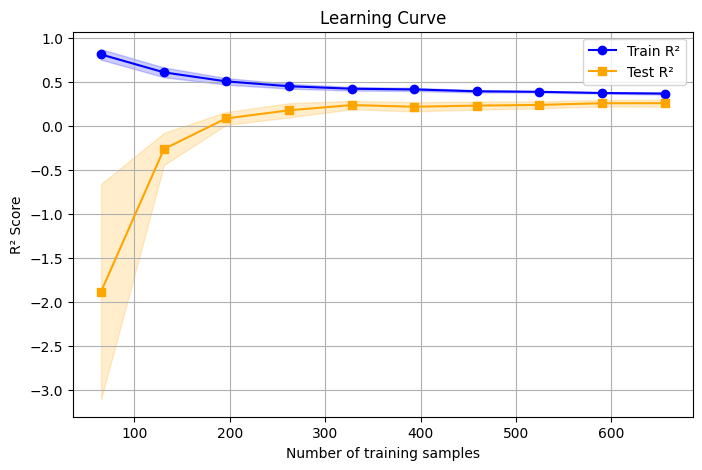

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_lin,
    X=X_train_linreg,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

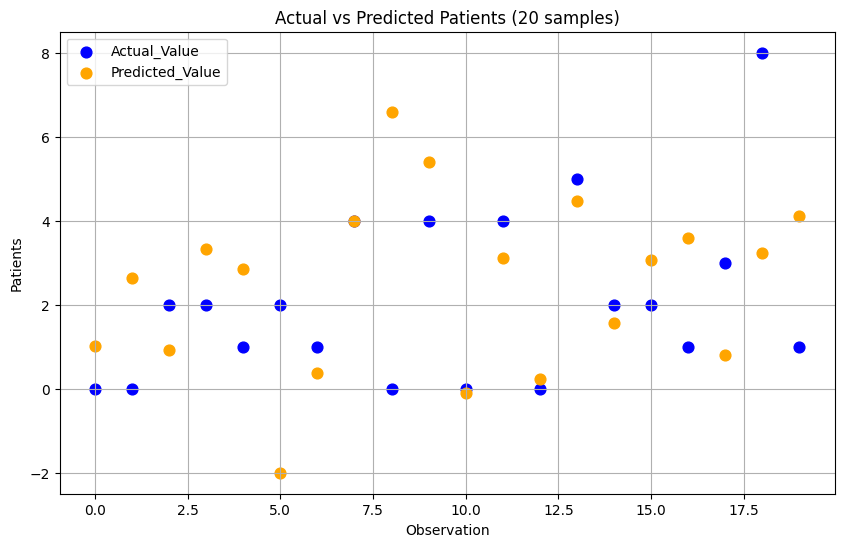

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_pred_test[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ความแม่นยำ โมเดลทำนายได้ใกล้เคียงในบางจุด (จุดที่ 14, 15) แต่ในหลายจุดยัง มีความคลาดเคลื่อนสูง

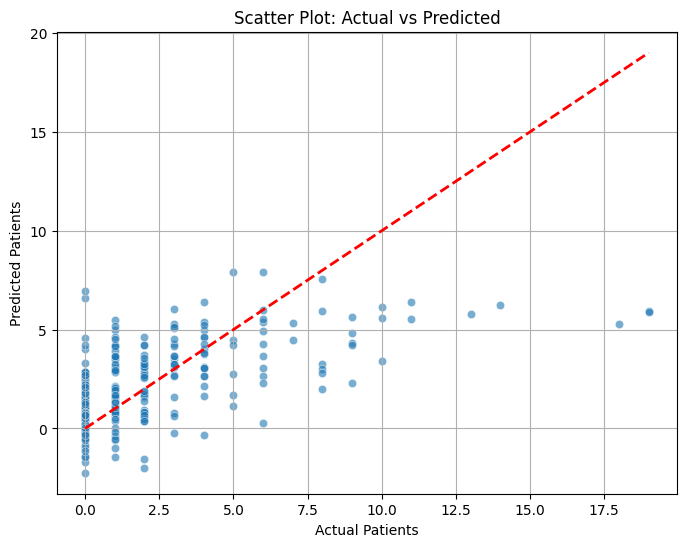

In [ ]:
y_pred = pipeline_lin.predict(X_test_linreg)  # หรือ grid_search.predict(X_test_linreg)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

สังเกตที่ฝั่งขวาของกราฟ (ค่าจริง 15-20) จุดข้อมูลอยู่ ใต้ เส้นสีแดงห่างมาก แปลว่า เมื่อผู้ป่วยจริงมีจำนวนมาก โมเดลกลับทำนายได้ต่ำมาก (ค่าจริงเกือบ 20 แต่ทำนายได้แค่ 5-6)

### ❀˖° Ridge Regression

Model name: `Ridge Regression`

In [ ]:
X_train_rd = X_train
X_test_rd = X_test

In [ ]:
X_train_rd_2 = X_train
X_test_rd_2 = X_test

#### Without Polynomial Feature

##### Step 1 - Scaling

In [ ]:
# scaling
scaler = RobustScaler()
X_train_rd_scaled = scaler.fit_transform(X_train_rd)
X_test_rd_scaled = scaler.transform(X_test_rd)

##### Step 2 - Build, train and test model

In [ ]:
# train
RR = Ridge(alpha=1.0)
RR = RR.fit(X_train_rd_scaled, y_train)

#test
y_predict = RR.predict(X_test_rd_scaled)

In [ ]:
print("Training set score: {:.2f}".format(RR.score(X_train_rd_scaled, y_train)))
print("Test set score: {:.2f}".format(RR.score(X_test_rd_scaled, y_test)))

# The mean squared error
mse_test_rd= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_rd)

Training set score: 0.35
Test set score: 0.32
Mean squared error: 6.78


##### Step 3 - Grid-Search with Cross-Validation

In [ ]:
# ตั้งค่าให้แสดงทศนิยม 3 ตำแหน่ง และ ไม่ใช้รูปแบบวิทยาศาสตร์
np.set_printoptions(suppress=True, precision=3)

สร้าง Pipeline เพื่อให้ใช้กับ GridsearchCV ได้สะดวก

In [ ]:
pipeline = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('ridge', Ridge())
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'ridge', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num', 'transformer__num__memory', 'transformer__num__steps', 'transformer__num__transform_input', 'transformer__num__verbose', 'transformer__num__scaler', 'transformer__num__scaler__copy', 'transformer__num__scaler__quantile_range', 'transformer__num__scaler__unit_variance', 'transformer__num__scaler__with_centering', 'transformer__num__scaler__with_scaling', 'ridge__alpha', 'ridge__copy_X', 'ridge__fit_intercept', 'ridge__max_iter', 'ridge__positive', 'ridge__random_state', 'ridge__solver', 'ridge__tol'])

Hyperparameter tuning (GridsearchCV)

In [ ]:
# Define the parameter grid to search
param_grid = {
    'ridge__alpha': np.logspace(-3, 3, 13)
}

# Set up the GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', return_train_score=True, n_jobs=1)

# Fit the grid search
grid_search.fit(X_train_rd, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          RobustScaler())]),
                                                                         ['Temperature',
                                                                          'Rainfall',
                                                                          'Humidity',
                                                                          'Rainfall_roll7',
                                                                          'Rainfall_roll14',
                                                                          'Rainfall_roll16',
                                                                          'Rainfall_roll17',
                                                                          'Rainfall_roll20',
                                                                          'Rainfall_roll30',
                                                                          'Rainfall_roll60',
                                                                          'Rainfall_roll90',
                                                                          'Temperature_roll7',
                                                                          'Tempera...
                                                                          'Humidity_roll16',
                                                                          'Humidity_roll17',
                                                                          'Humidity_roll20',
                                                                          'Humidity_roll30',
                                                                          'Humidity_roll60',
                                                                          'Humidity_roll90',
                                                                          'TempRain_roll16',
                                                                          'Rainfall_roll7_lag14',
                                                                          'Temperature_roll7_lag14', ...])])),
                                       ('ridge', Ridge())]),
             n_jobs=1,
             param_grid={'ridge__alpha': array([   0.001,    0.003,    0.01 ,    0.032,    0.1  ,    0.316,
          1.   ,    3.162,   10.   ,   31.623,  100.   ,  316.228,
       1000.   ])},
             return_train_score=True, scoring='r2')

In [ ]:
print(param_grid)

{'ridge__alpha': array([   0.001,    0.003,    0.01 ,    0.032,    0.1  ,    0.316,
          1.   ,    3.162,   10.   ,   31.623,  100.   ,  316.228,
       1000.   ])}


In [ ]:
# Get the best parameters and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'ridge__alpha': np.float64(3.1622776601683795)}
0.27041818875639445


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ GridSearchCV
best_alpha = grid_search.best_params_['ridge__alpha']

# Create a new pipeline with the best parameters
pipeline_rd = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('ridge', Ridge(alpha=best_alpha))
])

# Fit ridge model with best degree and best alpha on the training data and evaluate on the test data
pipeline_rd.fit(X_train_rd, y_train)
test_score = pipeline_rd.score(X_test_rd, y_test)

# Print test score
print("Test score (R²) with best degree and best alpha:", test_score)

Test score (R²) with best degree and best alpha: 0.3115622947877664


ผลลัพธ์ทั้งหมดที่ได้จาก GridSearchCV

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ridge__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.012855,0.000616,0.024343,0.039057,0.001000,{'ridge__alpha': 0.001},0.271118,0.199783,0.311200,0.224875,...,0.255031,0.038855,9,0.358317,0.384189,0.350027,0.370525,0.359265,0.364465,0.011824
1,0.013396,0.000879,0.007753,0.003930,0.003162,{'ridge__alpha': 0.0031622776601683794},0.271140,0.199775,0.311233,0.225116,...,0.255112,0.038839,8,0.358316,0.384187,0.350023,0.370523,0.359261,0.364462,0.011825
2,0.013277,0.000960,0.004667,0.000085,0.010000,{'ridge__alpha': 0.01},0.271212,0.199773,0.311322,0.225880,...,0.255349,0.038772,7,0.358306,0.384174,0.350001,0.370512,0.359237,0.364446,0.011828
3,0.012557,0.000126,0.004766,0.000125,0.031623,{'ridge__alpha': 0.03162277660168379},0.271457,0.199890,0.311553,0.228231,...,0.256031,0.038508,6,0.358261,0.384127,0.349918,0.370440,0.359142,0.364378,0.011838
4,0.012927,0.000802,0.004746,0.000160,0.100000,{'ridge__alpha': 0.1},0.272136,0.200652,0.312104,0.234623,...,0.257844,0.037681,5,0.358074,0.383995,0.349687,0.370062,0.358888,0.364141,0.011854
5,0.012306,0.000031,0.004668,0.000136,0.316228,{'ridge__alpha': 0.31622776601683794},0.273531,0.203723,0.312879,0.247521,...,0.261605,0.035768,4,0.357339,0.383432,0.348947,0.368323,0.358070,0.363222,0.011827
6,0.012536,0.000248,0.004670,0.000058,1.000000,{'ridge__alpha': 1.0},0.275918,0.212490,0.312710,0.263640,...,0.266955,0.032127,2,0.354989,0.380953,0.346806,0.363179,0.355635,0.360313,0.011549
7,0.012517,0.000116,0.004669,0.000066,3.162278,{'ridge__alpha': 3.1622776601683795},0.277530,0.228192,0.306353,0.272422,...,0.270418,0.025048,1,0.347994,0.372032,0.340719,0.352262,0.349127,0.352427,0.010507
8,0.012436,0.000056,0.004715,0.000054,10.000000,{'ridge__alpha': 10.0},0.269164,0.240123,0.282415,0.258889,...,0.261755,0.013933,3,0.327471,0.345387,0.322984,0.329280,0.330047,0.331034,0.007584
9,0.012365,0.000123,0.004623,0.000064,31.622777,{'ridge__alpha': 31.622776601683793},0.238468,0.230415,0.237993,0.216166,...,0.230592,0.008067,10,0.284217,0.291694,0.284679,0.288368,0.287605,0.287313,0.002717


ดู 10 ตัวแรกที่ได้ mean test score

In [ ]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results[['param_ridge__alpha', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_ridge__alpha,mean_test_score
7,3.162278,0.270418
6,1.000000,0.266955
8,10.000000,0.261755
5,0.316228,0.261605
4,0.100000,0.257844
3,0.031623,0.256031
2,0.010000,0.255349
1,0.003162,0.255112
0,0.001000,0.255031
9,31.622777,0.230592


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_rd.score(X_train_rd, y_train)))
print("Test set score: {:.2f}".format(pipeline_rd.score(X_test_rd, y_test)))

#test
y_predict = pipeline_rd.predict(X_test_rd)

# The mean squared error
mse_test_rd= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_rd)

# Root Mean Squared Error
rmse_test_rd = np.sqrt(mse_test_rd)
print("Root Mean Squared Error: %.2f" % rmse_test_rd)

# Mean Absolute Error
mae_test_rd = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_rd)

Training set score: 0.35
Test set score: 0.31
Mean squared error: 6.91
Root Mean Squared Error: 2.63
Mean Absolute Error: 1.76


**โมเดลนี้เกิดภาวะ Underfit**

เหตุผล ค่า R-squared Score ต่ำมากทั้งคู่

* Training Score อยู่ที่ 0.35
* Test Score อยู่ที่ 0.31

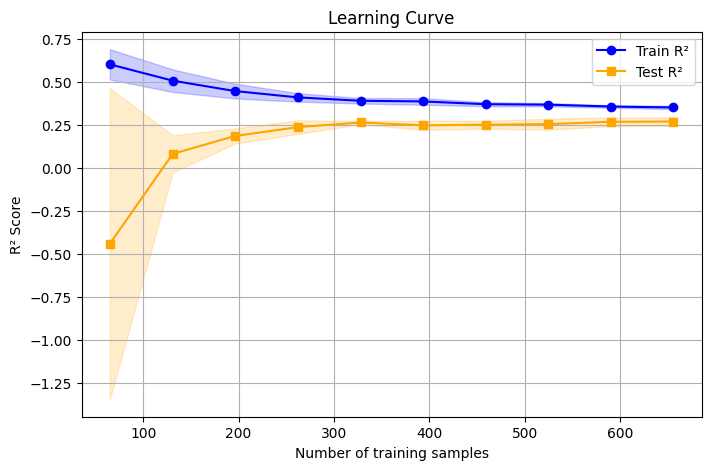

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_rd,
    X=X_train_rd,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

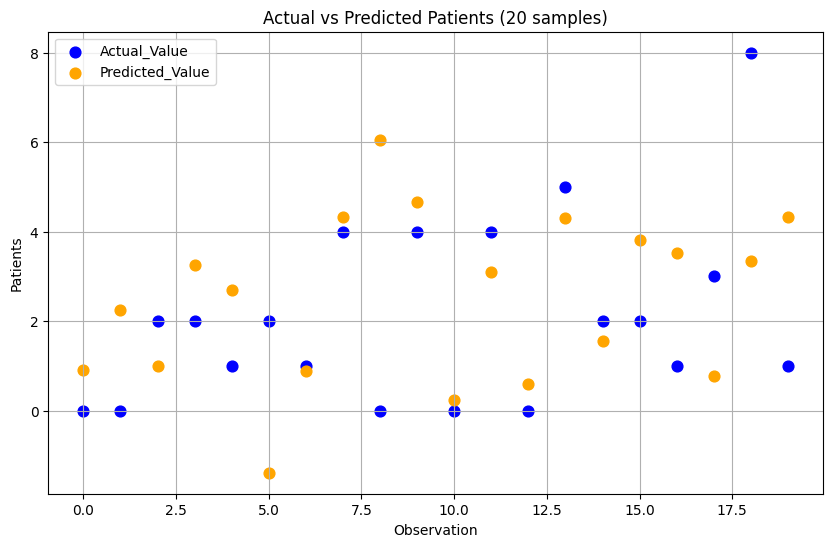

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ความแม่นยำ โมเดลทำนายได้ใกล้เคียงในบางจุด แต่ในหลายจุดยัง มีความคลาดเคลื่อนสูง

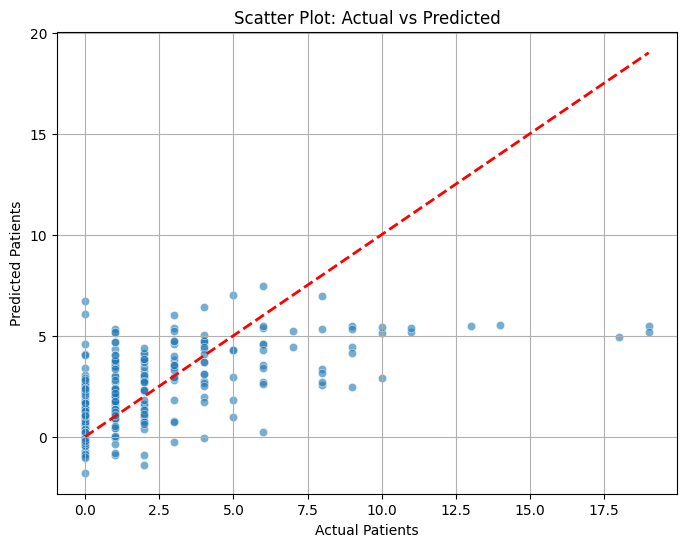

In [ ]:
y_pred = pipeline_rd.predict(X_test_rd)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

โมเดล สอบตก ที่ค่าสูง ค่าจริงสูงมาก แต่โมเดลทำนายได้แค่ประมาณ 5 เท่านั้น (จุดข้อมูลอยู่ต่ำกว่าเส้นประสีแดงมาก) โมเดลเกิดการ อิ่มตัว หรือไม่สามารถเรียนรู้ pattern ของข้อมูลที่มีค่าสูง ๆ ได้

#### With Polynomial Feature

##### Step 1 - Polynomial feature

In [ ]:
# create polynomial features
polyFeat = PolynomialFeatures(degree=2)

X_train_rd_poly = polyFeat.fit_transform(X_train_rd_2)
X_test_rd_poly = polyFeat.transform(X_test_rd_2)

print(X_train_rd_poly.shape)
print(X_test_rd_poly.shape)

(821, 630)
(274, 630)


##### Step 2 - Scaling

In [ ]:
scaler = RobustScaler()
X_train_rd_scaled = scaler.fit_transform(X_train_rd_poly)
X_test_rd_scaled = scaler.transform(X_test_rd_poly)

##### Step 3 - Build, train and test model

In [ ]:
# train
RR = Ridge(alpha=1.0)
RR = RR.fit(X_train_rd_scaled, y_train)

#test
y_predict = RR.predict(X_test_rd_scaled)

In [ ]:
print("Training set score: {:.2f}".format(RR.score(X_train_rd_scaled, y_train)))
print("Test set score: {:.2f}".format(RR.score(X_test_rd_scaled, y_test)))

# The mean squared error
mse_test_rd= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_rd)

Training set score: 0.72
Test set score: 0.50
Mean squared error: 5.02


##### Step 4 - Grid-Search with Cross-Validation

In [ ]:
# ตั้งค่าให้แสดงทศนิยม 3 ตำแหน่ง และ ไม่ใช้รูปแบบวิทยาศาสตร์
np.set_printoptions(suppress=True, precision=3)

สร้าง Pipeline เพื่อให้ใช้กับ GridsearchCV ได้สะดวก

In [ ]:
pipeline = Pipeline([
    ('transformer', column_transformer_poly),
    ('ridge', Ridge(alpha=1.0))
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'ridge', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num_poly', 'transformer__num_poly__memory', 'transformer__num_poly__steps', 'transformer__num_poly__transform_input', 'transformer__num_poly__verbose', 'transformer__num_poly__poly', 'transformer__num_poly__scaler', 'transformer__num_poly__poly__degree', 'transformer__num_poly__poly__include_bias', 'transformer__num_poly__poly__interaction_only', 'transformer__num_poly__poly__order', 'transformer__num_poly__scaler__copy', 'transformer__num_poly__scaler__quantile_range', 'transformer__num_poly__scaler__unit_variance', 'transformer__num_poly__scaler__with_centering', 'transformer__num_poly__scaler__with_scaling', 'ridge__alpha', 'ridge__copy_

Hyperparameter tuning (GridsearchCV)

In [ ]:
# Define the parameter grid to search
param_grid = {
    'transformer__num_poly__poly__degree': [1, 2, 3],
    'ridge__alpha': np.logspace(-3, 3, 13)
}

# Set up the GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', return_train_score=True, n_jobs=1)

# Fit the grid search
grid_search.fit(X_train_rd, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_ridge.py:254:

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('num_poly',
                                                                         Pipeline(steps=[('poly',
                                                                                          PolynomialFeatures(include_bias=False)),
                                                                                         ('scaler',
                                                                                          RobustScaler())]),
                                                                         ['Temperature',
                                                                          'Rainfall',
                                                                          'Humidity',
                                                                          'Rainfall_roll7',
                                                                          'Rainfall_roll14',
                                                                          'Rainfall_roll16',
                                                                          'Rainfall_roll17',
                                                                          'Rainfall_roll20',
                                                                          'Rainfall_roll30',
                                                                          'Rainfall_r...
                                                                          'Humidity_roll30',
                                                                          'Humidity_roll60',
                                                                          'Humidity_roll90',
                                                                          'TempRain_roll16',
                                                                          'Rainfall_roll7_lag14',
                                                                          'Temperature_roll7_lag14', ...])])),
                                       ('ridge', Ridge())]),
             n_jobs=1,
             param_grid={'ridge__alpha': array([   0.001,    0.003,    0.01 ,    0.032,    0.1  ,    0.316,
          1.   ,    3.162,   10.   ,   31.623,  100.   ,  316.228,
       1000.   ]),
                         'transformer__num_poly__poly__degree': [1, 2, 3]},
             return_train_score=True, scoring='r2')

In [ ]:
print(param_grid)

{'transformer__num_poly__poly__degree': [1, 2, 3], 'ridge__alpha': array([   0.001,    0.003,    0.01 ,    0.032,    0.1  ,    0.316,
          1.   ,    3.162,   10.   ,   31.623,  100.   ,  316.228,
       1000.   ])}


In [ ]:
# Get the best parameters and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'ridge__alpha': np.float64(31.622776601683793), 'transformer__num_poly__poly__degree': 2}
0.4047236232414194


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ GridSearchCV
best_degree = grid_search.best_params_['transformer__num_poly__poly__degree']
best_alpha = grid_search.best_params_['ridge__alpha']

# Create a new pipeline with the best parameters
pipeline_rd = Pipeline([
    ('transformer', ColumnTransformer([
        ('num_poly', Pipeline([
            ('poly', PolynomialFeatures(include_bias=False, degree=best_degree)),
            ('scaler', RobustScaler())
        ]), numeric_cols)
    ])),
    ('ridge', Ridge(alpha=best_alpha))
])

# Fit ridge model with best degree and best alpha on the training data and evaluate on the test data
pipeline_rd.fit(X_train_rd, y_train)
test_score = pipeline_rd.score(X_test_rd, y_test)

# Print test score
print("Test score (R²) with best degree and best alpha:", test_score)

Test score (R²) with best degree and best alpha: 0.43698900592228196


ผลลัพธ์ทั้งหมดที่ได้จาก GridSearchCV

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ridge__alpha,param_transformer__num_poly__poly__degree,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.013738,0.001380,0.005160,0.000097,0.001000,1,"{'ridge__alpha': 0.001, 'transformer__num_poly...",0.271118,0.199783,0.311200,...,0.255031,0.038855,17,0.358317,0.384189,0.350027,0.370525,0.359265,0.364465,0.011824
1,0.220182,0.041176,0.018701,0.008913,0.001000,2,"{'ridge__alpha': 0.001, 'transformer__num_poly...",-2.503962,-0.242440,-1.176911,...,-1.352288,0.824165,26,0.899313,0.911923,0.905372,0.910933,0.923392,0.910187,0.007992
2,1.557323,0.315320,0.043704,0.011441,0.001000,3,"{'ridge__alpha': 0.001, 'transformer__num_poly...",-99.097054,-242.404381,-1021.521880,...,-3345.055244,3605.807328,36,0.830299,0.661771,0.799970,0.849473,0.140389,0.656380,0.266243
3,0.014106,0.000923,0.005266,0.000270,0.003162,1,"{'ridge__alpha': 0.0031622776601683794, 'trans...",0.271140,0.199775,0.311233,...,0.255112,0.038839,16,0.358316,0.384187,0.350023,0.370523,0.359261,0.364462,0.011825
4,0.190495,0.047622,0.007479,0.000210,0.003162,2,"{'ridge__alpha': 0.0031622776601683794, 'trans...",-1.722088,-0.040184,-0.620153,...,-0.773045,0.604294,25,0.874593,0.890177,0.885607,0.886813,0.901346,0.887707,0.008594
5,1.651947,0.316601,0.034158,0.015081,0.003162,3,"{'ridge__alpha': 0.0031622776601683794, 'trans...",-139.542104,-158.708209,-1036.826037,...,-2562.370656,3224.373443,32,0.773378,0.708035,0.784783,0.849157,0.560235,0.735118,0.098237
6,0.016011,0.003961,0.006454,0.001687,0.010000,1,"{'ridge__alpha': 0.01, 'transformer__num_poly_...",0.271212,0.199773,0.311322,...,0.255349,0.038772,15,0.358306,0.384174,0.350001,0.370512,0.359237,0.364446,0.011828
7,0.167352,0.025717,0.007373,0.000168,0.010000,2,"{'ridge__alpha': 0.01, 'transformer__num_poly_...",-0.835148,0.104361,-0.164327,...,-0.302338,0.361547,24,0.847522,0.866932,0.861270,0.858540,0.874627,0.861778,0.009007
8,1.560183,0.399456,0.033802,0.020567,0.010000,3,"{'ridge__alpha': 0.01, 'transformer__num_poly_...",-96.986335,-24009.644590,-967.592081,...,-7598.828411,8838.672088,38,0.828623,0.920191,0.838612,0.832930,0.431120,0.770295,0.172917
9,0.031618,0.008666,0.008288,0.000943,0.031623,1,"{'ridge__alpha': 0.03162277660168379, 'transfo...",0.271457,0.199890,0.311553,...,0.256031,0.038508,14,0.358261,0.384127,0.349918,0.370440,0.359142,0.364378,0.011838


ดู 10 ตัวแรกที่ได้ mean test score

In [ ]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results[['param_transformer__num_poly__poly__degree', 'param_ridge__alpha', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_transformer__num_poly__poly__degree,param_ridge__alpha,mean_test_score
28,2,31.622777,0.404724
25,2,10.000000,0.400564
31,2,100.000000,0.389451
22,2,3.162278,0.377207
34,2,316.227766,0.369050
19,2,1.000000,0.345395
37,2,1000.000000,0.344300
16,2,0.316228,0.294030
21,1,3.162278,0.270418
18,1,1.000000,0.266955


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_rd.score(X_train_rd, y_train)))
print("Test set score: {:.2f}".format(pipeline_rd.score(X_test_rd, y_test)))

#test
y_predict = pipeline_rd.predict(X_test_rd)

# The mean squared error
mse_test_rd= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_rd)

# Root Mean Squared Error
rmse_test_rd = np.sqrt(mse_test_rd)
print("Root Mean Squared Error: %.2f" % rmse_test_rd)

# Mean Absolute Error
mae_test_rd = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_rd)

Training set score: 0.59
Test set score: 0.44
Mean squared error: 5.65
Root Mean Squared Error: 2.38
Mean Absolute Error: 1.63


**โมเดลนี้เกิดภาวะ Overfit**

เหตุผล Training Score (0.59) สูงกว่า
Test Score (0.44) มีช่องว่าง 0.15

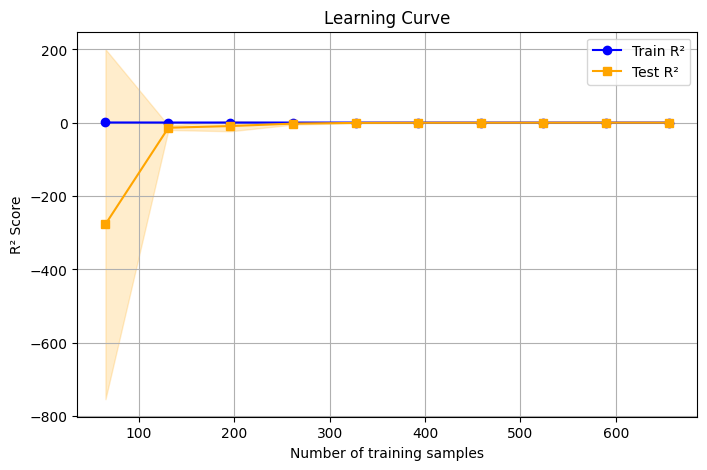

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_rd,
    X=X_train_rd,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

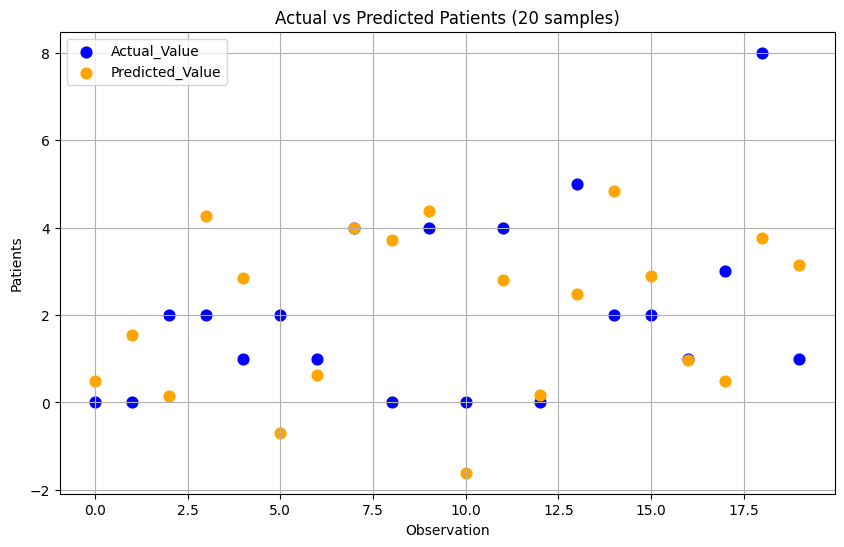

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ความแม่นยำ โมเดลทำนายได้ใกล้เคียงในบางจุด แต่ในหลายจุดยัง มีความคลาดเคลื่อนสูง

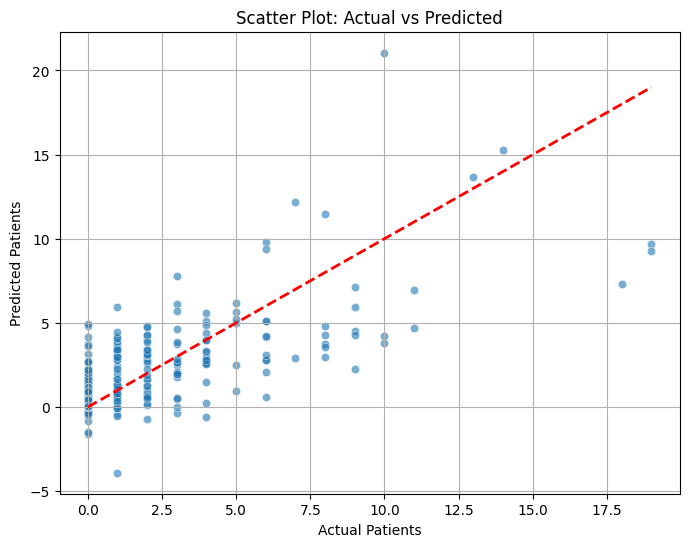

In [ ]:
y_pred = pipeline_rd.predict(X_test_rd)  # หรือ grid_search.predict(X_test_rd)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

โมเดลยังทำนายค่าออกมา ติดลบ และมีความแกว่งสูง (ค่าจริงต่ำแต่ทำนายสูง)

### ❀˖° Lasso Regression

In [ ]:
X_train_Ls = X_train
X_test_Ls = X_test

In [ ]:
X_train_Ls_2 = X_train
X_test_Ls_2 = X_test

#### Without Polynomial Feature

##### Step 1 - Scaling

In [ ]:
# scaling
scaler = RobustScaler()
X_train_Ls_scaled = scaler.fit_transform(X_train_Ls)
X_test_Ls_scaled = scaler.transform(X_test_Ls)

##### Step 2 - Build, train and test model

In [ ]:
# train
lasso = Lasso(alpha=1.0)
lasso.fit(X_train_Ls_scaled, y_train)

#test
y_predict = lasso.predict(X_test_Ls_scaled)

In [ ]:
print("Training set score: {:.2f}".format(lasso.score(X_train_Ls_scaled, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test_Ls_scaled, y_test)))

# The mean squared error
mse_test_Ls= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_Ls)

Training set score: 0.02
Test set score: 0.02
Mean squared error: 9.79


##### Step 3 - Grid-Search with Cross-Validation

สร้าง Pipeline เพื่อให้ใช้กับ GridsearchCV ได้สะดวก

In [ ]:
pipeline = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('lasso', Lasso(max_iter=1000000))
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'lasso', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num', 'transformer__num__memory', 'transformer__num__steps', 'transformer__num__transform_input', 'transformer__num__verbose', 'transformer__num__scaler', 'transformer__num__scaler__copy', 'transformer__num__scaler__quantile_range', 'transformer__num__scaler__unit_variance', 'transformer__num__scaler__with_centering', 'transformer__num__scaler__with_scaling', 'lasso__alpha', 'lasso__copy_X', 'lasso__fit_intercept', 'lasso__max_iter', 'lasso__positive', 'lasso__precompute', 'lasso__random_state', 'lasso__selection', 'lasso__tol', 'lasso__warm_start'])

Hyperparameter tuning (GridsearchCV)

In [ ]:
# Define the parameter grid to search
param_grid = {
    'lasso__alpha': np.logspace(-3, 0, 13)
}

# Set up the GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', return_train_score=True, n_jobs=1)

# Fit the grid search
grid_search.fit(X_train_Ls, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          RobustScaler())]),
                                                                         ['Temperature',
                                                                          'Rainfall',
                                                                          'Humidity',
                                                                          'Rainfall_roll7',
                                                                          'Rainfall_roll14',
                                                                          'Rainfall_roll16',
                                                                          'Rainfall_roll17',
                                                                          'Rainfall_roll20',
                                                                          'Rainfall_roll30',
                                                                          'Rainfall_roll60',
                                                                          'Rainfall_roll90',
                                                                          'Temperature_roll7',
                                                                          'Tempera...
                                                                          'Humidity_roll17',
                                                                          'Humidity_roll20',
                                                                          'Humidity_roll30',
                                                                          'Humidity_roll60',
                                                                          'Humidity_roll90',
                                                                          'TempRain_roll16',
                                                                          'Rainfall_roll7_lag14',
                                                                          'Temperature_roll7_lag14', ...])])),
                                       ('lasso', Lasso(max_iter=1000000))]),
             n_jobs=1,
             param_grid={'lasso__alpha': array([0.001, 0.002, 0.003, 0.006, 0.01 , 0.018, 0.032, 0.056, 0.1  ,
       0.178, 0.316, 0.562, 1.   ])},
             return_train_score=True, scoring='r2')

In [ ]:
print(param_grid)

{'lasso__alpha': array([0.001, 0.002, 0.003, 0.006, 0.01 , 0.018, 0.032, 0.056, 0.1  ,
       0.178, 0.316, 0.562, 1.   ])}


In [ ]:
# Get the best parameters and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'lasso__alpha': np.float64(0.01)}
0.28555202328870716


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ GridSearchCV
best_alpha = grid_search.best_params_['lasso__alpha']

# Create a new pipeline with the best parameters
pipeline_Ls = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('lasso', Lasso(alpha=best_alpha))
])

# Fit lasso model with best degree and best alpha on the training data and evaluate on the test data
pipeline_Ls.fit(X_train_Ls, y_train)
test_score = pipeline_Ls.score(X_test_Ls, y_test)

# Print test score
print("Test score (R²) with best degree and best alpha:", test_score)

Test score (R²) with best degree and best alpha: 0.32018763256386373


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.993e+00, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


ผลลัพธ์ทั้งหมดที่ได้จาก GridSearchCV

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_lasso__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.344619,0.053988,0.004299,0.000066,0.001000,{'lasso__alpha': 0.001},0.273127,0.202254,0.317170,0.238226,...,0.260576,0.038456,7,0.357395,0.383381,0.348959,0.369470,0.358371,0.363515,0.011882
1,0.311848,0.042206,0.004346,0.000112,0.001778,{'lasso__alpha': 0.0017782794100389228},0.274780,0.206688,0.317698,0.246750,...,0.264197,0.036618,6,0.356149,0.382613,0.347880,0.367751,0.356935,0.362266,0.011974
2,0.301815,0.096323,0.004264,0.000048,0.003162,{'lasso__alpha': 0.0031622776601683794},0.280297,0.215166,0.320796,0.263267,...,0.271692,0.034070,5,0.354442,0.380936,0.346755,0.364513,0.354536,0.360236,0.011786
3,0.374313,0.174841,0.004309,0.000309,0.005623,{'lasso__alpha': 0.005623413251903491},0.288035,0.226570,0.325831,0.282242,...,0.280977,0.031701,3,0.350175,0.376294,0.344495,0.357795,0.351683,0.356088,0.010954
4,0.073062,0.045889,0.003754,0.000283,0.010000,{'lasso__alpha': 0.01},0.291120,0.235458,0.325917,0.294686,...,0.285552,0.029250,1,0.343023,0.368131,0.338014,0.347926,0.346393,0.348697,0.010295
5,0.028251,0.016214,0.003611,0.000161,0.017783,{'lasso__alpha': 0.01778279410038923},0.287113,0.238038,0.313890,0.292985,...,0.281663,0.025014,2,0.333443,0.356313,0.324888,0.336144,0.337710,0.337700,0.010307
6,0.015894,0.005871,0.003621,0.000324,0.031623,{'lasso__alpha': 0.03162277660168379},0.283143,0.244001,0.294500,0.283266,...,0.274781,0.017388,4,0.318344,0.338770,0.309733,0.315975,0.320812,0.320727,0.009744
7,0.012342,0.002514,0.003460,0.000058,0.056234,{'lasso__alpha': 0.05623413251903491},0.259015,0.243397,0.255004,0.253029,...,0.249837,0.007559,8,0.287011,0.304634,0.282463,0.288625,0.291143,0.290775,0.007485
8,0.012330,0.002116,0.003775,0.000841,0.100000,{'lasso__alpha': 0.1},0.188664,0.201752,0.168823,0.161494,...,0.178470,0.014657,9,0.211361,0.221491,0.212957,0.212655,0.222943,0.216281,0.004898
9,0.011896,0.002630,0.003839,0.000857,0.177828,{'lasso__alpha': 0.1778279410038923},0.163558,0.163500,0.128253,0.129312,...,0.141373,0.018250,10,0.168572,0.158685,0.164785,0.171868,0.169391,0.166660,0.004590


ดู 10 ตัวแรกที่ได้ mean test score

In [ ]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results[['param_lasso__alpha', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_lasso__alpha,mean_test_score
4,0.010000,0.285552
5,0.017783,0.281663
3,0.005623,0.280977
6,0.031623,0.274781
2,0.003162,0.271692
1,0.001778,0.264197
0,0.001000,0.260576
7,0.056234,0.249837
8,0.100000,0.178470
9,0.177828,0.141373


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_Ls.score(X_train_Ls, y_train)))
print("Test set score: {:.2f}".format(pipeline_Ls.score(X_test_Ls, y_test)))

#test
y_predict = pipeline_Ls.predict(X_test_Ls)

# The mean squared error
mse_test_Ls= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_Ls)

# Root Mean Squared Error
rmse_test_Ls = np.sqrt(mse_test_Ls)
print("Root Mean Squared Error: %.2f" % rmse_test_Ls)

# Mean Absolute Error
mae_test_Ls = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_Ls)

Training set score: 0.34
Test set score: 0.32
Mean squared error: 6.82
Root Mean Squared Error: 2.61
Mean Absolute Error: 1.75


**โมเดลนี้เกิดภาวะ Underfit**

เหตุผล ค่า R-squared Score ต่ำมากทั้งคู่

* Training Score อยู่ที่ 0.34
* Test Score อยู่ที่ 0.32

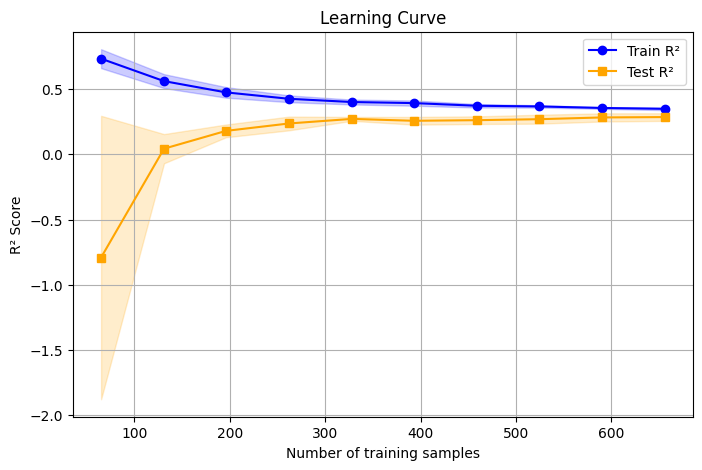

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_Ls,
    X=X_train_Ls,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

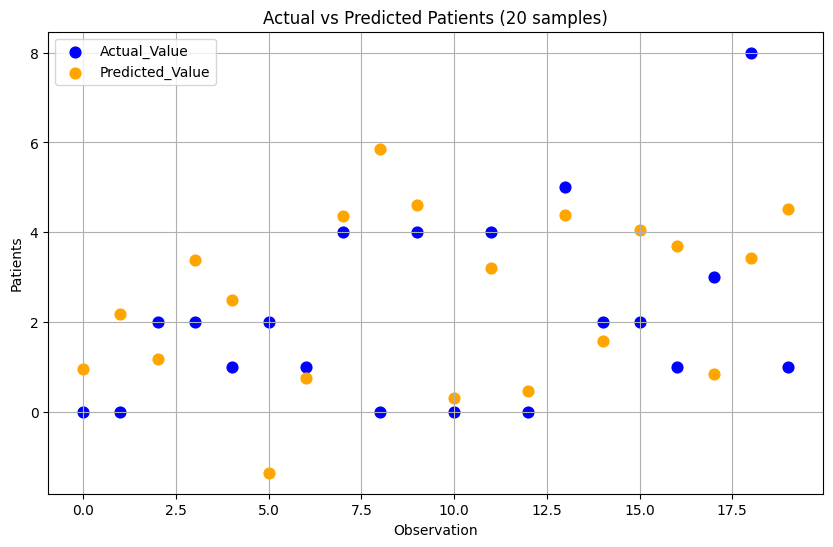

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ความแม่นยำ โมเดลทำนายได้ใกล้เคียงในบางจุด แต่ในหลายจุดยัง มีความคลาดเคลื่อนสูง

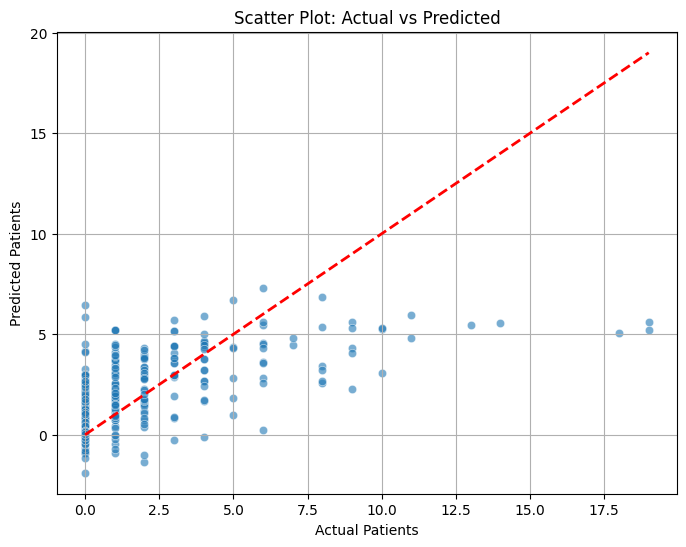

In [ ]:
y_pred = pipeline_Ls.predict(X_test_rd)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

โมเดลไม่โตตามค่าจริง สังเกตที่ฝั่งขวาของกราฟ (ค่าจริงสูง 10-19) จุดข้อมูล วิ่งออกข้าง ในแนวนอน แทนที่จะวิ่งเฉียงขึ้นตามเส้นประสีแดง ตีความได้ว่า ไม่ว่าผู้ป่วยจริงจะมาเยอะแค่ไหน โมเดลก็ทายค่าได้แค่ประมาณ 5-6 เท่านั้น

#### With Polynomial Feature

##### Step 1 - Polynomial feature

In [ ]:
# create polynomial features
polyFeat = PolynomialFeatures(degree=2)

X_train_Ls_poly = polyFeat.fit_transform(X_train_Ls_2)
X_test_Ls_poly = polyFeat.transform(X_test_Ls_2)

print(X_train_Ls_poly.shape)
print(X_test_Ls_poly.shape)

(821, 630)
(274, 630)


##### Step 2 - Scaling

In [ ]:
# scaling
scaler = RobustScaler()
X_train_Ls_scaled = scaler.fit_transform(X_train_Ls_poly)
X_test_Ls_scaled = scaler.transform(X_test_Ls_poly)

##### Step 3 - Build, train and test model

In [ ]:
# train
lasso = Lasso(alpha=1.0)
lasso.fit(X_train_Ls_scaled, y_train)

#test
y_predict = lasso.predict(X_test_Ls_scaled)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.394e+00, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


In [ ]:
print("Training set score: {:.2f}".format(lasso.score(X_train_Ls_scaled, y_train)))
print("Test set score: {:.2f}".format(lasso.score(X_test_Ls_scaled, y_test)))

# The mean squared error
mse_test_Ls= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_Ls)

Training set score: 0.10
Test set score: 0.10
Mean squared error: 9.06


##### Step 4 - Grid-Search with Cross-Validation

สร้าง Pipeline เพื่อให้ใช้กับ GridsearchCV ได้สะดวก

In [ ]:
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('transformer', column_transformer_poly),
    ('lasso', Lasso(max_iter=10000)) # เพิ่มชื่อ 'lasso' ให้กับ step
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'lasso', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num_poly', 'transformer__num_poly__memory', 'transformer__num_poly__steps', 'transformer__num_poly__transform_input', 'transformer__num_poly__verbose', 'transformer__num_poly__poly', 'transformer__num_poly__scaler', 'transformer__num_poly__poly__degree', 'transformer__num_poly__poly__include_bias', 'transformer__num_poly__poly__interaction_only', 'transformer__num_poly__poly__order', 'transformer__num_poly__scaler__copy', 'transformer__num_poly__scaler__quantile_range', 'transformer__num_poly__scaler__unit_variance', 'transformer__num_poly__scaler__with_centering', 'transformer__num_poly__scaler__with_scaling', 'lasso__alpha', 'lasso__copy_

Hyperparameter tuning (GridsearchCV)

In [ ]:
# Define the parameter grid to search
param_grid = {
    'transformer__num_poly__poly__degree': [1, 2, 3],
    'lasso__alpha': np.logspace(-3, 0, 13)
}

# Set up the GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', return_train_score=True, n_jobs=-1)

# Fit the grid search
grid_search.fit(X_train_Ls_2, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.069e+03, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('num_poly',
                                                                         Pipeline(steps=[('poly',
                                                                                          PolynomialFeatures(include_bias=False)),
                                                                                         ('scaler',
                                                                                          RobustScaler())]),
                                                                         ['Temperature',
                                                                          'Rainfall',
                                                                          'Humidity',
                                                                          'Rainfall_roll7',
                                                                          'Rainfall_roll14',
                                                                          'Rainfall_roll16',
                                                                          'Rainfall_roll17',
                                                                          'Rainfall_roll20',
                                                                          'Rainfall_roll30',
                                                                          'Rainfall_r...
                                                                          'Humidity_roll30',
                                                                          'Humidity_roll60',
                                                                          'Humidity_roll90',
                                                                          'TempRain_roll16',
                                                                          'Rainfall_roll7_lag14',
                                                                          'Temperature_roll7_lag14', ...])])),
                                       ('lasso', Lasso(max_iter=10000))]),
             n_jobs=-1,
             param_grid={'lasso__alpha': array([0.001, 0.002, 0.003, 0.006, 0.01 , 0.018, 0.032, 0.056, 0.1  ,
       0.178, 0.316, 0.562, 1.   ]),
                         'transformer__num_poly__poly__degree': [1, 2, 3]},
             return_train_score=True, scoring='r2')

In [ ]:
print(param_grid)

{'transformer__num_poly__poly__degree': [1, 2, 3], 'lasso__alpha': array([0.001, 0.002, 0.003, 0.006, 0.01 , 0.018, 0.032, 0.056, 0.1  ,
       0.178, 0.316, 0.562, 1.   ])}


In [ ]:
# Get the best parameters and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'lasso__alpha': np.float64(0.005623413251903491), 'transformer__num_poly__poly__degree': 2}
0.45665609738468704


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ GridSearchCV
best_degree = grid_search.best_params_['transformer__num_poly__poly__degree']
best_alpha = grid_search.best_params_['lasso__alpha']

# Create a new pipeline with the best parameters
pipeline_Ls = Pipeline([
    ('transformer', column_transformer_poly),
    ('lasso', Lasso(alpha=best_alpha))
])

# Fit lasso model with best degree and best alpha on the training data and evaluate on the test data
pipeline_Ls.fit(X_train_Ls, y_train)
test_score = pipeline_Ls.score(X_test_Ls, y_test)

# Print test score
print("Test score (R²) with best degree and best alpha:", test_score)

Test score (R²) with best degree and best alpha: 0.4737654646471533


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.185e+03, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


ผลลัพธ์ทั้งหมดที่ได้จาก GridSearchCV

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_lasso__alpha,param_transformer__num_poly__poly__degree,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.356608,0.045173,0.010911,0.001117,0.001000,1,"{'lasso__alpha': 0.001, 'transformer__num_poly...",0.273365,0.202186,0.317038,...,0.260402,0.038548,18,0.357381,0.383363,0.348962,0.369417,0.358280,0.363481,0.011879
1,5.520669,1.066697,0.015183,0.005394,0.001000,2,"{'lasso__alpha': 0.001, 'transformer__num_poly...",0.518941,0.396361,0.511496,...,0.424360,0.079709,5,0.729760,0.766762,0.731098,0.742188,0.764919,0.746945,0.016030
2,96.661822,5.922564,0.046035,0.008820,0.001000,3,"{'lasso__alpha': 0.001, 'transformer__num_poly...",0.102582,0.235281,-0.173869,...,-0.385522,0.588070,37,0.830439,0.851134,0.841279,0.835188,0.858665,0.843341,0.010322
3,0.445133,0.122122,0.018632,0.008004,0.001778,1,"{'lasso__alpha': 0.0017782794100389228, 'trans...",0.274825,0.206448,0.317667,...,0.263971,0.036744,17,0.356071,0.382570,0.347977,0.367699,0.356892,0.362242,0.011943
4,6.202594,0.808365,0.017099,0.006371,0.001778,2,"{'lasso__alpha': 0.0017782794100389228, 'trans...",0.521575,0.385496,0.494801,...,0.433364,0.072424,3,0.709018,0.745595,0.713089,0.722587,0.744849,0.727028,0.015496
5,98.400483,8.454855,0.044982,0.002058,0.001778,3,"{'lasso__alpha': 0.0017782794100389228, 'trans...",0.037528,0.219573,-0.283461,...,-0.453571,0.641660,39,0.812386,0.836599,0.820506,0.818463,0.841634,0.825917,0.011216
6,0.355648,0.006742,0.010225,0.000725,0.003162,1,"{'lasso__alpha': 0.0031622776601683794, 'trans...",0.280263,0.214995,0.320796,...,0.271526,0.034142,16,0.354331,0.380894,0.346755,0.364511,0.354368,0.360172,0.011799
7,5.198861,0.949687,0.013655,0.001516,0.003162,2,"{'lasso__alpha': 0.0031622776601683794, 'trans...",0.520169,0.392036,0.490657,...,0.455036,0.071774,2,0.682474,0.723460,0.691456,0.697247,0.719863,0.702900,0.016066
8,94.853550,8.637778,0.043714,0.003914,0.003162,3,"{'lasso__alpha': 0.0031622776601683794, 'trans...",-0.014649,0.224267,-0.336213,...,-0.430330,0.595953,38,0.790277,0.819623,0.798062,0.800271,0.823030,0.806253,0.012793
9,0.381476,0.061205,0.011882,0.002626,0.005623,1,"{'lasso__alpha': 0.005623413251903491, 'transf...",0.287848,0.226475,0.325831,...,0.280873,0.031724,14,0.350067,0.376293,0.344495,0.357653,0.351470,0.355996,0.010978


ดู 10 ตัวแรกที่ได้ mean test score

In [ ]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results[['param_transformer__num_poly__poly__degree', 'param_lasso__alpha', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_transformer__num_poly__poly__degree,param_lasso__alpha,mean_test_score
10,2,0.005623,0.456656
7,2,0.003162,0.455036
4,2,0.001778,0.433364
13,2,0.010000,0.429196
1,2,0.001000,0.424360
16,2,0.017783,0.399287
19,2,0.031623,0.391125
22,2,0.056234,0.372150
25,2,0.100000,0.347928
28,2,0.177828,0.330176


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_Ls.score(X_train_Ls, y_train)))
print("Test set score: {:.2f}".format(pipeline_Ls.score(X_test_Ls, y_test)))

#test
y_predict = pipeline_Ls.predict(X_test_Ls)

# The mean squared error
mse_test_Ls= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_Ls)

# Root Mean Squared Error
rmse_test_Ls = np.sqrt(mse_test_Ls)
print("Root Mean Squared Error: %.2f" % rmse_test_Ls)

# Mean Absolute Error
mae_test_Ls = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_Ls)

Training set score: 0.62
Test set score: 0.47
Mean squared error: 5.28
Root Mean Squared Error: 2.30
Mean Absolute Error: 1.56


**โมเดลนี้เกิดภาวะ Overfit**

เหตุผล Training Score (0.62) สูงกว่า
Test Score (0.47) มีช่องว่าง 0.15

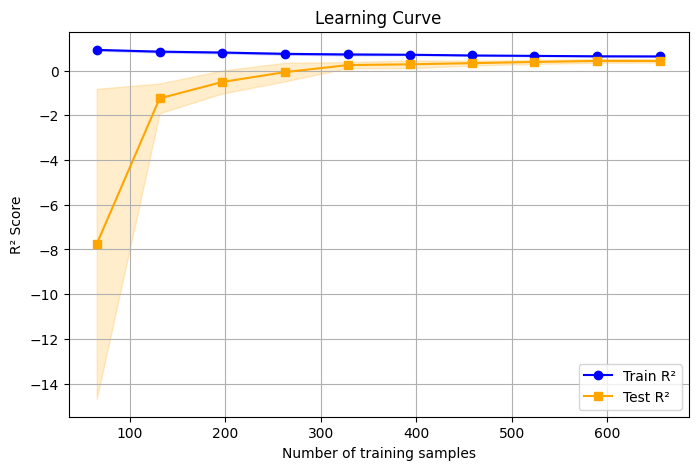

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_Ls,
    X=X_train_Ls,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

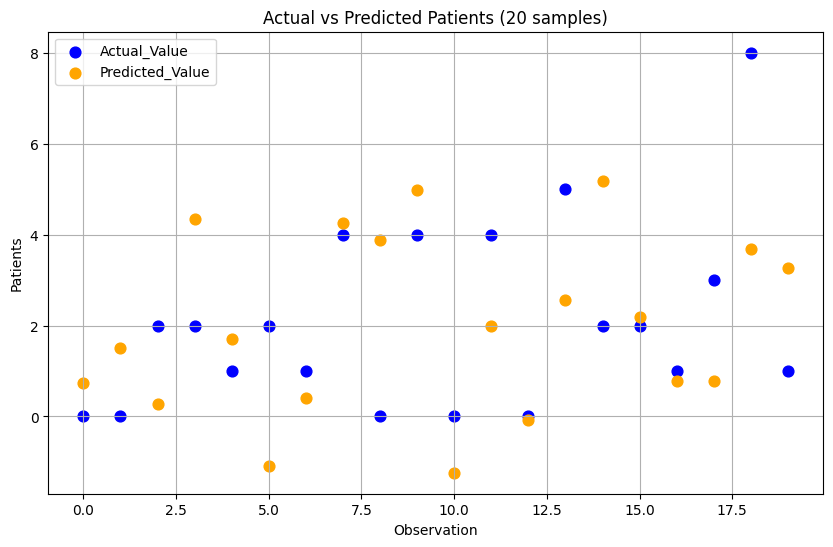

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ค่าติดลบ ที่  5 และ 10 ค่าทำนาย (สีส้ม) ตกลงไปใต้เส้น 0
โมเดลยังไม่เข้าใจว่า จำนวนผู้ป่วย ต่ำสุดคือ 0

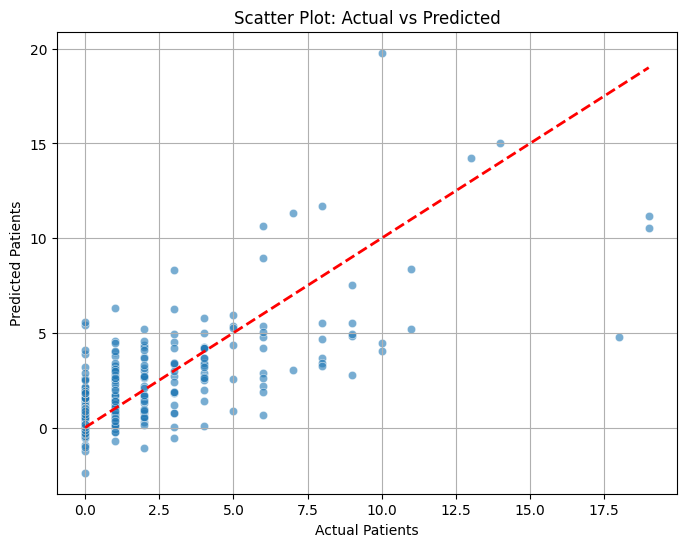

In [ ]:
y_pred = pipeline_Ls.predict(X_test_rd)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

สังเกตที่แกน X ค่าประมาณ 10 มีจุดข้อมูลจุดหนึ่งที่ค่าทำนาย (แกน Y) พุ่งกระโดดไปสูงเกือบ 20 โมเดลมีความอ่อนไหวผิดปกติต่อข้อมูลบางตัว ทำให้ทำนายเวอร์เกินจริงไปมาก

### ❀˖° Elastic Net Regression

In [ ]:
X_train_En = X_train
X_test_En = X_test

In [ ]:
X_train_En_2 = X_train
X_test_En_2 = X_test

#### Without Polynomial Feature

##### Step 1 - Scaling

In [ ]:
# scaling
scaler = RobustScaler()
X_train_En_scaled = scaler.fit_transform(X_train_En)
X_test_En_scaled = scaler.transform(X_test_En)

##### Step 2 - Build, train and test model

In [ ]:
# train
EN = ElasticNet(alpha=1.0, l1_ratio=0.5)
EN = EN.fit(X_train_En_scaled, y_train)

#test
y_predict = EN.predict(X_test_En_scaled)

In [ ]:
print("Training set score: {:.2f}".format(EN.score(X_train_En_scaled, y_train)))
print("Test set score: {:.2f}".format(EN.score(X_test_En_scaled, y_test)))

# The mean squared error
mse_test_En= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_En)

Training set score: 0.06
Test set score: 0.05
Mean squared error: 9.51


##### Step 3 - Grid-Search with Cross-Validation

สร้าง Pipeline เพื่อให้ใช้กับ GridsearchCV ได้สะดวก

In [ ]:
pipeline = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('en', ElasticNet())
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'en', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num', 'transformer__num__memory', 'transformer__num__steps', 'transformer__num__transform_input', 'transformer__num__verbose', 'transformer__num__scaler', 'transformer__num__scaler__copy', 'transformer__num__scaler__quantile_range', 'transformer__num__scaler__unit_variance', 'transformer__num__scaler__with_centering', 'transformer__num__scaler__with_scaling', 'en__alpha', 'en__copy_X', 'en__fit_intercept', 'en__l1_ratio', 'en__max_iter', 'en__positive', 'en__precompute', 'en__random_state', 'en__selection', 'en__tol', 'en__warm_start'])

Hyperparameter tuning (GridsearchCV)

In [ ]:
# Define the parameter grid to search
param_grid = {
    'en__alpha': np.logspace(-4, -1, 10),
    'en__l1_ratio': [0.01, .1, .5, .9, .98, 1]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='r2', return_train_score=True, n_jobs=1)

# Fit the grid search
grid_search.fit(X_train_En, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.515e+03, tolerance: 7.817e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.344e+03, tolerance: 7.591e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.436e+03, tolerance: 7.466e

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          RobustScaler())]),
                                                                         ['Temperature',
                                                                          'Rainfall',
                                                                          'Humidity',
                                                                          'Rainfall_roll7',
                                                                          'Rainfall_roll14',
                                                                          'Rainfall_roll16',
                                                                          'Rainfall_roll17',
                                                                          'Rainfall_roll20',
                                                                          'Rainfall_roll30',
                                                                          'Rainfall_roll60',
                                                                          'Rainfall_roll90',
                                                                          'Temperature_roll7',
                                                                          'Tempera...
                                                                          'Humidity_roll30',
                                                                          'Humidity_roll60',
                                                                          'Humidity_roll90',
                                                                          'TempRain_roll16',
                                                                          'Rainfall_roll7_lag14',
                                                                          'Temperature_roll7_lag14', ...])])),
                                       ('en', ElasticNet())]),
             n_jobs=1,
             param_grid={'en__alpha': array([0.0001    , 0.00021544, 0.00046416, 0.001     , 0.00215443,
       0.00464159, 0.01      , 0.02154435, 0.04641589, 0.1       ]),
                         'en__l1_ratio': [0.01, 0.1, 0.5, 0.9, 0.98, 1]},
             return_train_score=True, scoring='r2')

In [ ]:
print(param_grid)

{'en__alpha': array([0.0001    , 0.00021544, 0.00046416, 0.001     , 0.00215443,
       0.00464159, 0.01      , 0.02154435, 0.04641589, 0.1       ]), 'en__l1_ratio': [0.01, 0.1, 0.5, 0.9, 0.98, 1]}


In [ ]:
# Get the best parameters and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'en__alpha': np.float64(0.01), 'en__l1_ratio': 1}
0.285392819596869


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ GridSearchCV
best_alpha = grid_search.best_params_['en__alpha']
best_l1_ratio = grid_search.best_params_['en__l1_ratio']

# Create a new pipeline with the best parameters
pipeline_En = Pipeline([
    ('transformer', column_transformer_no_poly),
    ('en', ElasticNet(alpha=best_alpha, l1_ratio=best_l1_ratio))
])

# Fit ElasticNet model with best degree and best alpha on the training data and evaluate on the test data
pipeline_En.fit(X_train_En, y_train)
test_score = pipeline_En.score(X_test_En, y_test)

# Print test score
print("Test score (R²) with best degree, best alpha and best l1_ratio:", test_score)

Test score (R²) with best degree, best alpha and best l1_ratio: 0.3201876325638633


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.993e+00, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


ผลลัพธ์ทั้งหมดที่ได้จาก GridSearchCV

In [ ]:
results = pd.DataFrame(grid_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_en__alpha,param_en__l1_ratio,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.042643,0.009549,0.009914,0.006155,0.000100,0.01,"{'en__alpha': 0.0001, 'en__l1_ratio': 0.01}",0.266939,0.196384,0.307068,...,0.257504,0.036076,44,0.357170,0.383328,0.348050,0.367180,0.357676,0.362681,0.011967
1,0.033333,0.003790,0.007713,0.002612,0.000100,0.10,"{'en__alpha': 0.0001, 'en__l1_ratio': 0.1}",0.266910,0.196301,0.307080,...,0.257459,0.036114,45,0.357176,0.383330,0.348051,0.367182,0.357678,0.362683,0.011967
2,0.035955,0.003441,0.007436,0.002258,0.000100,0.50,"{'en__alpha': 0.0001, 'en__l1_ratio': 0.5}",0.266775,0.195925,0.307126,...,0.257248,0.036283,46,0.357202,0.383335,0.348054,0.367183,0.357687,0.362692,0.011965
3,0.033725,0.005257,0.005599,0.000128,0.000100,0.90,"{'en__alpha': 0.0001, 'en__l1_ratio': 0.9}",0.266628,0.195540,0.307166,...,0.257021,0.036455,48,0.357224,0.383337,0.348052,0.367177,0.357693,0.362697,0.011963
4,0.037049,0.007992,0.007947,0.003198,0.000100,0.98,"{'en__alpha': 0.0001, 'en__l1_ratio': 0.98}",0.266598,0.195461,0.307172,...,0.256974,0.036490,49,0.357228,0.383337,0.348052,0.367175,0.357694,0.362697,0.011962
5,0.034347,0.001729,0.005848,0.000311,0.000100,1.00,"{'en__alpha': 0.0001, 'en__l1_ratio': 1}",0.266590,0.195441,0.307174,...,0.256962,0.036499,50,0.357229,0.383337,0.348051,0.367174,0.357694,0.362697,0.011962
6,0.034224,0.001928,0.005783,0.000338,0.000215,0.01,"{'en__alpha': 0.00021544346900318845, 'en__l1_...",0.268206,0.198254,0.307802,...,0.258846,0.035593,37,0.357090,0.383293,0.348047,0.367050,0.357625,0.362621,0.011958
7,0.033172,0.001503,0.005587,0.000163,0.000215,0.10,"{'en__alpha': 0.00021544346900318845, 'en__l1_...",0.268161,0.198092,0.307835,...,0.258769,0.035668,38,0.357107,0.383302,0.348052,0.367063,0.357634,0.362632,0.011958
8,0.038799,0.008160,0.005670,0.000234,0.000215,0.50,"{'en__alpha': 0.00021544346900318845, 'en__l1_...",0.267933,0.197349,0.307961,...,0.258384,0.036003,39,0.357180,0.383334,0.348069,0.367106,0.357670,0.362672,0.011958
9,0.035315,0.004006,0.006162,0.000343,0.000215,0.90,"{'en__alpha': 0.00021544346900318845, 'en__l1_...",0.267657,0.196565,0.308024,...,0.257933,0.036341,40,0.357242,0.383352,0.348072,0.367120,0.357695,0.362696,0.011957


ดู 10 ตัวแรกที่ได้ mean test score

In [ ]:
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results[['param_en__alpha', 'param_en__l1_ratio', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_en__alpha,param_en__l1_ratio,mean_test_score
41,0.010000,1.00,0.285393
40,0.010000,0.98,0.285270
39,0.010000,0.90,0.284516
47,0.021544,1.00,0.279438
46,0.021544,0.98,0.279089
34,0.004642,0.98,0.277766
35,0.004642,1.00,0.277760
33,0.004642,0.90,0.277620
45,0.021544,0.90,0.277612
38,0.010000,0.50,0.277144


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_En.score(X_train_En, y_train)))
print("Test set score: {:.2f}".format(pipeline_En.score(X_test_En, y_test)))

#test
y_predict = pipeline_En.predict(X_test_En)

# The mean squared error
mse_test_En= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_En)

# Root Mean Squared Error
rmse_test_En = np.sqrt(mse_test_En)
print("Root Mean Squared Error: %.2f" % rmse_test_En)

# Mean Absolute Error
mae_test_En = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_En)

Training set score: 0.34
Test set score: 0.32
Mean squared error: 6.82
Root Mean Squared Error: 2.61
Mean Absolute Error: 1.75


**โมเดลนี้เกิดภาวะ Underfit**

เหตุผล ค่า R-squared Score ต่ำมากทั้งคู่

* Training Score อยู่ที่ 0.34
* Test Score อยู่ที่ 0.32

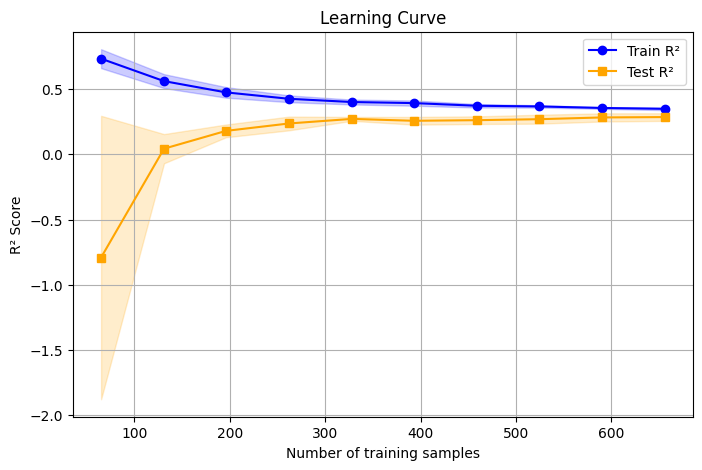

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_En,
    X=X_train_En,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

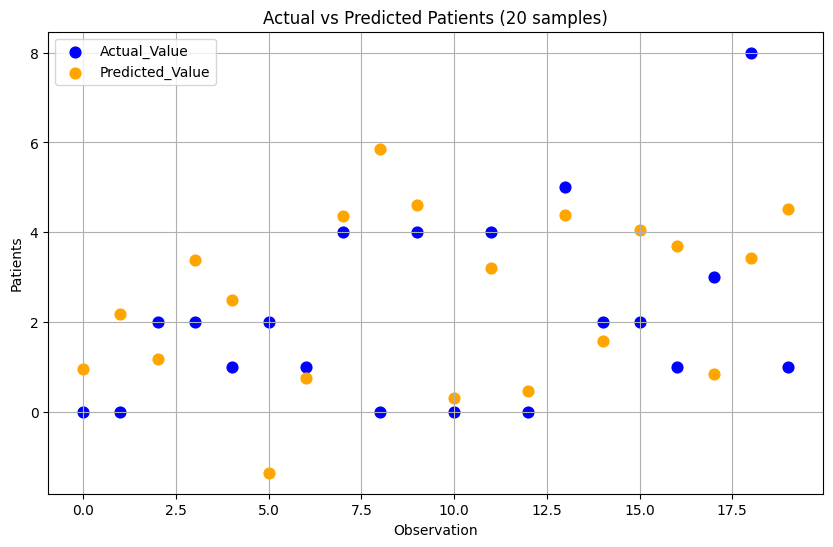

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

ค่าจริงคือ 0 (ไม่มีผู้ป่วย) แต่โมเดลทำนายพุ่งไปถึงเกือบ 6
ทำให้เกิด False Alarm หรือการเตรียมทรัพยากรเก้อ

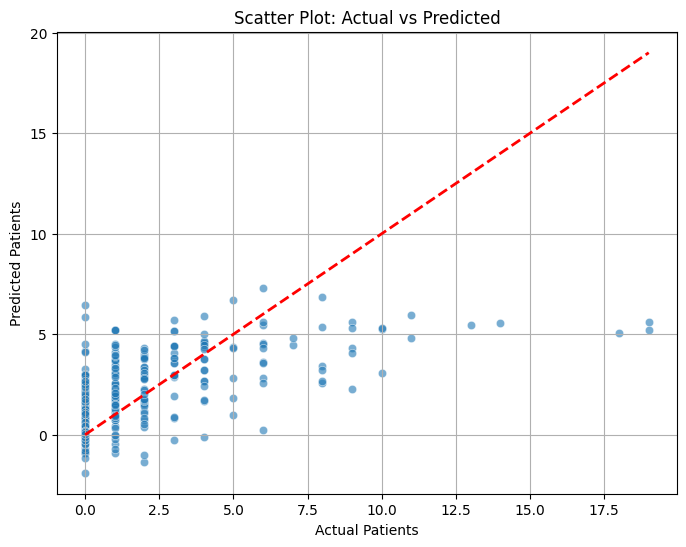

In [ ]:
y_pred = pipeline_En.predict(X_test_En)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

ค่าจริงคือ 0 (ไม่มีผู้ป่วย) แต่โมเดลทำนายกระโดดไปสูงถึง 6 ซึ่งจะทำให้เกิด การแจ้งเตือนผิดพลาด (False Alarm)

#### With Polynomial Feature

##### Step 1 - Polynomial feature

In [ ]:
# create polynomial features
polyFeat = PolynomialFeatures(degree=2)

X_train_En_poly = polyFeat.fit_transform(X_train_En_2)
X_test_En_poly = polyFeat.transform(X_test_En_2)

print(X_train_En_poly.shape)
print(X_test_En_poly.shape)

(821, 630)
(274, 630)


##### Step 2 - Scaling

In [ ]:
# scaling
scaler = RobustScaler()
X_train_En_scaled = scaler.fit_transform(X_train_En_poly)
X_test_En_scaled = scaler.transform(X_test_En_poly)

##### Step 3 - Build, train and test model

In [ ]:
# train
EN = ElasticNet(alpha=1.0, l1_ratio=0.5)
EN = EN.fit(X_train_En_scaled, y_train)

#test
y_predict = EN.predict(X_test_En_scaled)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.999e+03, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


In [ ]:
print("Training set score: {:.2f}".format(EN.score(X_train_En_scaled, y_train)))
print("Test set score: {:.2f}".format(EN.score(X_test_En_scaled, y_test)))

# The mean squared error
mse_test_En= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_En)

Training set score: 0.24
Test set score: 0.23
Mean squared error: 7.74


##### Step 4 - Randomized Search with Cross-Validation

สร้าง Pipeline เพื่อให้ใช้กับ RandomizedSearchCV ได้สะดวก

In [ ]:
pipeline = Pipeline([
    ('transformer', column_transformer_poly),
    ('en', ElasticNet())
])

print("ชื่อ Parameter ทั้งหมดใน Pipeline:")
pipeline.get_params().keys()

ชื่อ Parameter ทั้งหมดใน Pipeline:


dict_keys(['memory', 'steps', 'transform_input', 'verbose', 'transformer', 'en', 'transformer__force_int_remainder_cols', 'transformer__n_jobs', 'transformer__remainder', 'transformer__sparse_threshold', 'transformer__transformer_weights', 'transformer__transformers', 'transformer__verbose', 'transformer__verbose_feature_names_out', 'transformer__num_poly', 'transformer__num_poly__memory', 'transformer__num_poly__steps', 'transformer__num_poly__transform_input', 'transformer__num_poly__verbose', 'transformer__num_poly__poly', 'transformer__num_poly__scaler', 'transformer__num_poly__poly__degree', 'transformer__num_poly__poly__include_bias', 'transformer__num_poly__poly__interaction_only', 'transformer__num_poly__poly__order', 'transformer__num_poly__scaler__copy', 'transformer__num_poly__scaler__quantile_range', 'transformer__num_poly__scaler__unit_variance', 'transformer__num_poly__scaler__with_centering', 'transformer__num_poly__scaler__with_scaling', 'en__alpha', 'en__copy_X', 'en__

Hyperparameter tuning (RandomizedSearchCV)

In [ ]:
# Define the parameter grid to search
param_distributions = {
    'transformer__num_poly__poly__degree': [1, 2, 3],
    'en__alpha': np.logspace(-4, -1, 10),
    'en__l1_ratio': [0.01, .1, .5, .9, .98, 1]
}

# Set up the RandomizedSearchCV
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_distributions,
    n_iter=20,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    random_state=42,
    verbose=2
)

# Fit the grid search
random_search.fit(X_train_En, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.587e+03, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('transformer',
                                              ColumnTransformer(transformers=[('num_poly',
                                                                               Pipeline(steps=[('poly',
                                                                                                PolynomialFeatures(include_bias=False)),
                                                                                               ('scaler',
                                                                                                RobustScaler())]),
                                                                               ['Temperature',
                                                                                'Rainfall',
                                                                                'Humidity',
                                                                                'Rainfall_roll7',
                                                                                'Rainfall_roll14',
                                                                                'Rainfall_roll16',
                                                                                'Rainfall_roll17',
                                                                                'Rainfall_roll20',
                                                                                'Rainfall_roll30',
                                                                                'Rain...
                                                                                'Rainfall_roll7_lag14',
                                                                                'Temperature_roll7_lag14', ...])])),
                                             ('en', ElasticNet())]),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'en__alpha': array([0.0001    , 0.00021544, 0.00046416, 0.001     , 0.00215443,
       0.00464159, 0.01      , 0.02154435, 0.04641589, 0.1       ]),
                                        'en__l1_ratio': [0.01, 0.1, 0.5, 0.9,
                                                         0.98, 1],
                                        'transformer__num_poly__poly__degree': [1,
                                                                                2,
                                                                                3]},
                   random_state=42, scoring='r2', verbose=2)

In [ ]:
print(param_distributions)

{'transformer__num_poly__poly__degree': [1, 2, 3], 'en__alpha': array([0.0001    , 0.00021544, 0.00046416, 0.001     , 0.00215443,
       0.00464159, 0.01      , 0.02154435, 0.04641589, 0.1       ]), 'en__l1_ratio': [0.01, 0.1, 0.5, 0.9, 0.98, 1]}


In [ ]:
# Get the best parameters and best score
print(random_search.best_params_)
print(random_search.best_score_)

{'transformer__num_poly__poly__degree': 2, 'en__l1_ratio': 0.01, 'en__alpha': np.float64(0.00021544346900318845)}
0.4508949907012526


In [ ]:
# ดึงค่าพารามิเตอร์ที่ดีที่สุดจากผลลัพธ์ของ RandomizedSearchCV
best_degree = random_search.best_params_['transformer__num_poly__poly__degree']
best_alpha = random_search.best_params_['en__alpha']
best_l1_ratio = random_search.best_params_['en__l1_ratio']

# Create a new pipeline with the best parameters
pipeline_En = Pipeline([
    ('transformer', column_transformer_poly),
    ('en', ElasticNet(alpha=best_alpha, l1_ratio=best_l1_ratio))
])

# Fit ElasticNet model with best degree and best alpha on the training data and evaluate on the test data
pipeline_En.fit(X_train_En, y_train)
test_score = pipeline_En.score(X_test_En, y_test)

# Print test score
print("Test score (R²) with best degree, best alpha and best l1_ratio:", test_score)

Test score (R²) with best degree, best alpha and best l1_ratio: 0.5090052107731868


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.587e+03, tolerance: 9.609e-01
  model = cd_fast.enet_coordinate_descent(


ผลลัพธ์ทั้งหมดที่ได้จาก RandomizedSearchCV

In [ ]:
results = pd.DataFrame(random_search.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_transformer__num_poly__poly__degree,param_en__l1_ratio,param_en__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.908645,0.066199,0.012774,0.003712,2,0.01,0.000215,"{'transformer__num_poly__poly__degree': 2, 'en...",0.447702,0.396812,0.513707,0.522179,0.374074,0.450895,0.059772,1
1,0.087085,0.015523,0.013979,0.003549,1,0.50,0.000464,"{'transformer__num_poly__poly__degree': 1, 'en...",0.270162,0.200168,0.309381,0.252791,0.269707,0.260442,0.035403,15
2,0.049994,0.016641,0.010327,0.003921,1,0.90,0.046416,"{'transformer__num_poly__poly__degree': 1, 'en...",0.268464,0.245430,0.264971,0.260298,0.246591,0.257151,0.009465,19
3,0.045729,0.013761,0.007797,0.002594,1,0.50,0.002154,"{'transformer__num_poly__poly__degree': 1, 'en...",0.278578,0.214014,0.315019,0.266606,0.272976,0.269439,0.032415,11
4,0.789577,0.115389,0.014931,0.005780,2,0.01,0.046416,"{'transformer__num_poly__poly__degree': 2, 'en...",0.402634,0.381125,0.396178,0.547212,0.361192,0.417668,0.066324,4
5,0.078808,0.009832,0.012835,0.004368,1,1.00,0.000100,"{'transformer__num_poly__poly__degree': 1, 'en...",0.266590,0.195441,0.307174,0.246388,0.269217,0.256962,0.036499,20
6,0.064154,0.020455,0.011616,0.005867,1,0.50,0.000215,"{'transformer__num_poly__poly__degree': 1, 'en...",0.267933,0.197349,0.307961,0.249216,0.269461,0.258384,0.036003,18
7,14.955438,1.664666,0.070693,0.036745,3,0.98,0.001000,"{'transformer__num_poly__poly__degree': 3, 'en...",0.469398,0.387745,0.466437,-0.069833,0.154964,0.281743,0.209877,6
8,12.060077,0.824805,0.038135,0.019593,3,0.10,0.010000,"{'transformer__num_poly__poly__degree': 3, 'en...",0.449992,0.383888,0.470164,-0.094680,0.183359,0.278545,0.212399,7
9,0.518391,0.020810,0.010580,0.001586,2,0.90,0.010000,"{'transformer__num_poly__poly__degree': 2, 'en...",0.428784,0.381333,0.448425,0.566799,0.379391,0.440946,0.068390,3


ดู 10 ตัวแรกที่ได้ mean test score สูงที่สุด

In [ ]:
cv_results = pd.DataFrame(random_search.cv_results_)
cv_results[['param_transformer__num_poly__poly__degree', 'param_en__alpha', 'param_en__l1_ratio', 'mean_test_score']].sort_values(by='mean_test_score', ascending=False).head(10)

,param_transformer__num_poly__poly__degree,param_en__alpha,param_en__l1_ratio,mean_test_score
0,2,0.000215,0.01,0.450895
15,2,0.000100,1.00,0.449197
9,2,0.010000,0.90,0.440946
4,2,0.046416,0.01,0.417668
13,2,0.021544,1.00,0.401531
7,3,0.001000,0.98,0.281743
8,3,0.010000,0.10,0.278545
18,1,0.004642,0.50,0.274650
17,3,0.010000,1.00,0.272052
10,1,0.004642,0.10,0.271319


##### Evaluate Model

In [ ]:
print("Training set score: {:.2f}".format(pipeline_En.score(X_train_En, y_train)))
print("Test set score: {:.2f}".format(pipeline_En.score(X_test_En, y_test)))

#test
y_predict = pipeline_En.predict(X_test_En)

# The mean squared error
mse_test_En= mean_squared_error(y_test, y_predict)
print("Mean squared error: %.2f" % mse_test_En)

# Root Mean Squared Error
rmse_test_En = np.sqrt(mse_test_En)
print("Root Mean Squared Error: %.2f" % rmse_test_En)

# Mean Absolute Error
mae_test_En = np.mean(np.abs(y_predict - y_test))
print("Mean Absolute Error: %.2f" % mae_test_En)

Training set score: 0.68
Test set score: 0.51
Mean squared error: 4.92
Root Mean Squared Error: 2.22
Mean Absolute Error: 1.48


**โมเดลนี้เกิดภาวะ Overfit**

เหตุผล Training Score (0.68) สูงกว่า
Test Score (0.51) มีช่องว่าง 0.17

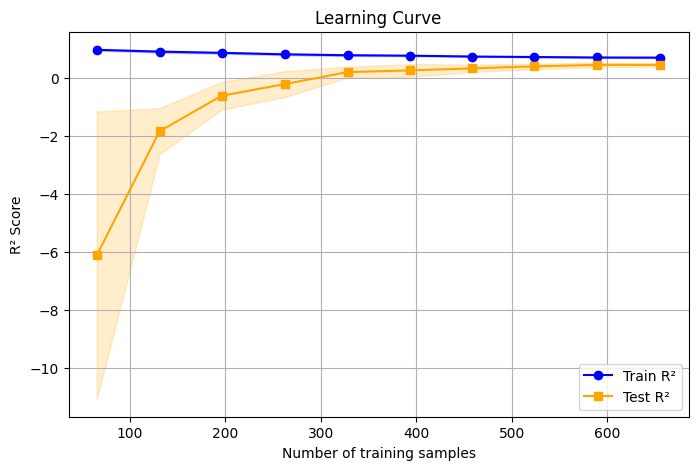

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

train_sizes, train_scores, test_scores = learning_curve(
    estimator=pipeline_En,
    X=X_train_En,
    y=y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),  # ใช้ 10 step ของ training data
    cv=5,
    scoring='r2',
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

# คำนวณค่า mean และ std ของแต่ละ fold
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# วาดกราฟ learning curve
plt.figure(figsize=(8,5))
plt.plot(train_sizes, train_mean, 'o-', color='blue', label='Train R²')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_mean, 's-', color='orange', label='Test R²')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color='orange')
plt.xlabel('Number of training samples')
plt.ylabel('R² Score')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()

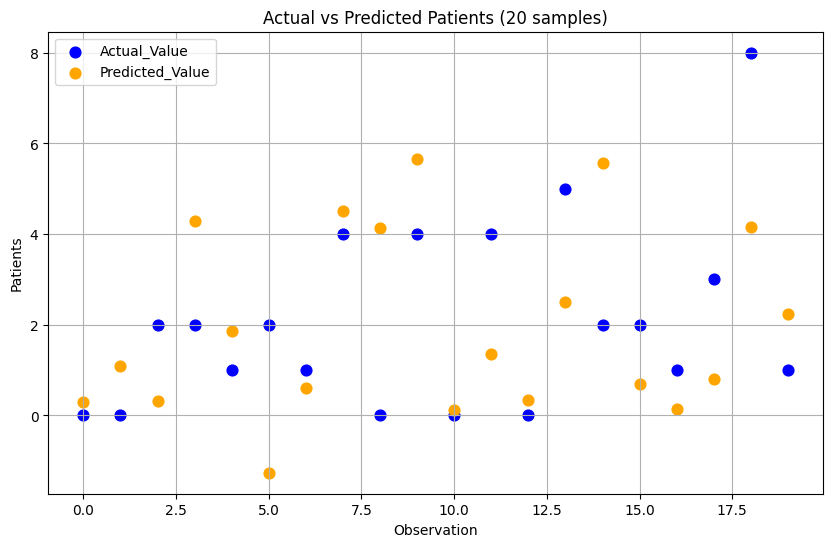

In [ ]:
# เลือกมาเฉพาะ 20 จุดแรก
sample_size = 20
y_test_sample = y_test[:sample_size]
y_pred_sample = y_predict[:sample_size]

# index สำหรับแกน x
x = np.arange(sample_size)

plt.figure(figsize=(10, 6))

# plot actual
plt.scatter(x, y_test_sample, color='blue', label='Actual_Value', s=60)

# plot predicted
plt.scatter(x, y_pred_sample, color='orange', label='Predicted_Value', s=60)

plt.xlabel('Observation')
plt.ylabel('Patients')
plt.title('Actual vs Predicted Patients (20 samples)')
plt.legend()
plt.grid(True)
plt.show()

โมเดลทำนายค่าตกลงไปที่ค่าติดลบ
ยังมีข้อผิดพลาดที่จำนวนผู้ป่วยจริงไม่สามารถติดลบได้

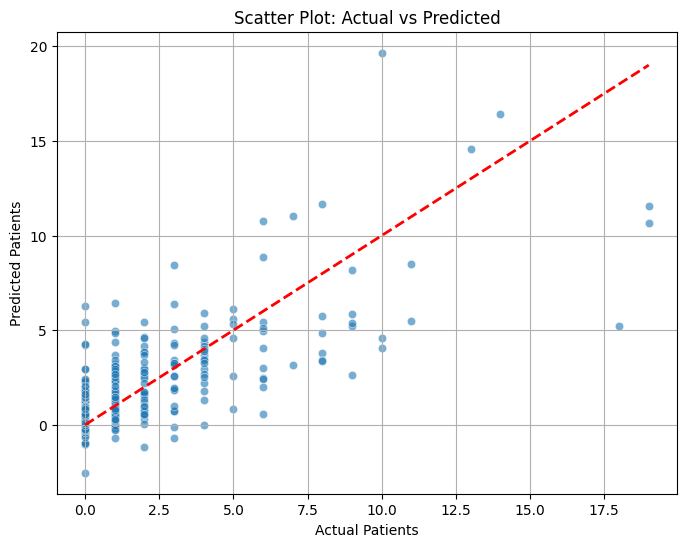

In [ ]:
y_pred = pipeline_Ls.predict(X_test_En_2)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)  # alpha ลดความทับซ้อน
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # เส้น y=x

plt.xlabel('Actual Patients')
plt.ylabel('Predicted Patients')
plt.title('Scatter Plot: Actual vs Predicted')
plt.grid(True)
plt.show()

ต่างจากโมเดลก่อนหน้าที่กราฟแบนราบ (ทำนายค่าเดิมตลอด) โมเดลนี้จุดข้อมูลเริ่มวิ่งเฉียงขึ้นตามเส้นประสีแดงบ้างแล้ว โมเดลเริ่มเรียนรู้แล้วว่า ยิ่งค่าจริงมาก ค่าทำนายก็ควรจะมากตาม

## **Summary**

โครงงานนี้ทำขึ้นเพื่อคาดการณ์จำนวนผู้ป่วยไข้เลือดออกในประเทศไทยโดยใช้ข้อมูลสิ่งแวดล้อมเป็นตัวแปรต้น เช่น ปริมาณฝน อุณหภูมิ และความชื้น โดยได้ทดลองใช้โมเดล Regression หลายรูปแบบทั้งแบบ Linear Regression และโมเดล Regularization ได้แก่ Ridge, Lasso และ Elastic Net ทั้งในเวอร์ชันที่ใช้เฉพาะข้อมูลเดิมและเวอร์ชันที่เพิ่ม Polynomial Feature เข้าไปเพื่อเพิ่มความซับซ้อนของโมเดล

**ผลการทดลองพบว่า**

* โมเดลที่ ไม่เพิ่ม Polynomial Feature มีความสามารถในการทำนายต่ำมาก โดยคะแนน R² อยู่ราว 0.31-0.35 และค่า RMSE อยู่ที่ประมาณ 2.59-2.63
* เมื่อเพิ่ม Polynomial Feature แล้ว โมเดลทุกตัวให้ผลดีขึ้นอย่างชัดเจน โดยสามารถจับความสัมพันธ์แบบไม่เชิงเส้น (non-linear) ระหว่างตัวแปรอากาศและจำนวนผู้ป่วยได้ดีขึ้น
* ในกลุ่มโมเดลที่เพิ่ม Polynomial Feature โมเดลที่ให้ผลดีที่สุดคือ
Elastic Net Regression With Polynomial Feature
โดยมี
   * Test score (R²) = 0.51
   * RMSE = 2.22 (ต่ำที่สุด)
   * MAE = 1.48 (ต่ำที่สุด)

จากผลลัพธ์นี้สามารถสรุปได้ว่า การเพิ่ม Polynomial Feature ทำให้โมเดลสามารถเรียนรู้ลักษณะของข้อมูลได้ดีขึ้น และโมเดลแบบ Elastic Net ซึ่งผสมผสานข้อดีของทั้ง Ridge และ Lasso ช่วยควบคุมความซับซ้อนและเลือก feature ได้เหมาะสมที่สุด ทำให้มีประสิทธิภาพสูงกว่ารูปแบบอื่น

> โดยรวมแล้ว งานนี้สามารถบรรลุวัตถุประสงค์ที่ตั้งไว้ คือสร้างโมเดลพยากรณ์จำนวนผู้ป่วยไข้เลือดออกจากข้อมูลสิ่งแวดล้อมได้ในระดับหนึ่ง และยังชี้ให้เห็นทิศทางว่าโมเดลเป็นลักษณะ non-linear การเพิ่ม feature interaction ช่วยให้ผลลัพธ์ดีขึ้นอย่างมีนัยสำคัญ

อย่างไรก็ตาม โมเดลยังไม่แม่นยำมากนัก หากต้องการให้ค่า R² สูงขึ้น สามารถทำได้โดย
1. เพิ่ม Feature ใหม่ ที่เกี่ยวข้องกับการระบาด เช่น ระยะห่างระหว่างแหล่งน้ำ ข้อมูลประชากร
2. เพิ่มจำนวนและช่วงเวลาของข้อมูลให้มากขึ้น เพื่อให้โมเดลเรียนรู้รูปแบบได้ครอบคลุมมากขึ้น